<h1 style="text-align:center; font-size: 2em;font-family:'Computer Modern'">FYS-STK4155 Project 1 Notebook</h1>
<h2 style="text-align:center; font-size: 1.5em;font-family:'Computer Modern'">Aleksander Berge Gursli - aleksbg</h2>
<h3 style="text-align:center; font-size: 1em;font-family:'Computer Modern'">Fall semester of 2024</h3>


**Disclaimers / notes / etc for the start...**

Went with working in a .ipynb notebook for all tasks, even if I myself would have preferred to work more structured with .py files etc. This is mostly due to me struggling with sickness for a long time, and thus the time constraints made this easier and better for me personally. Another reason is that the project file itself and the weekly work we've been doing has mostly been done in notebooks. Even if it's not the most structured way to present the code and the drawback of the necessary top-to-bottom running of cells, I saw no mention that using a notebook for the code would be a drawback when it comes to grading, since the Code, implementation and testing part of the evaluation form don't mention this specifically. I felt that it would be possible to ensure that I followed the marks presented there in a notebook as well. 


Importing necessary libs/packages, this also includes the ones used in the code we were provided.

In [550]:
# Taken from the provided code - some used by me as well.
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
from imageio import imread

# For my usage
import seaborn as sns
import pandas as pd
import sklearn.linear_model as lm
import sklearn.model_selection as ms
sns.set_theme()

#### Code we were provided as part of the task description, taken from the Project1.pdf /.ipynb files. 

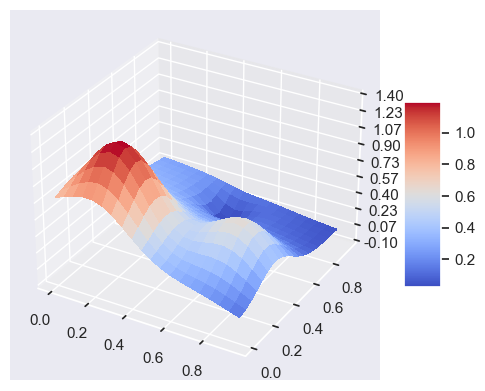

In [441]:
# The provided Franke function code and the included 3D-plot code found in the project files.
fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
# Make data.
x = np.arange(0, 1, 0.05)
y = np.arange(0, 1, 0.05)
x, y = np.meshgrid(x,y)

def FrankeFunction(x,y):
    term1 = 0.75*np.exp(-(0.25*(9*x-2)**2) - 0.25*((9*y-2)**2))
    term2 = 0.75*np.exp(-((9*x+1)**2)/49.0 - 0.1*(9*y+1))
    term3 = 0.5*np.exp(-(9*x-7)**2/4.0 - 0.25*((9*y-3)**2))
    term4 = -0.2*np.exp(-(9*x-4)**2 - (9*y-7)**2)
    return term1 + term2 + term3 + term4

z = FrankeFunction(x, y)

# Plot the surface.
surf = ax.plot_surface(x, y, z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-0.10, 1.40)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

C:\Users\aleks\AppData\Local\Temp\ipykernel_2636\4283248523.py:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  terrain1 = imread('SRTM_data_Norway_1.tif')


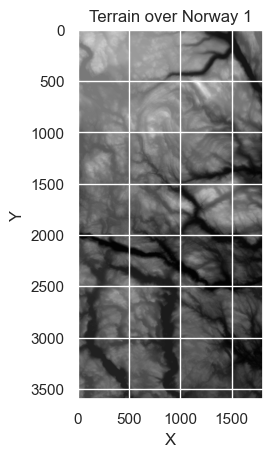

In [443]:
# The loading of the real .tif data as presented in Part g)
# Load the terrain
terrain1 = imread('SRTM_data_Norway_1.tif')
# Show the terrain
plt.figure()
plt.title('Terrain over Norway 1')
plt.imshow(terrain1, cmap='gray')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


#### Code written by me; if necessary - I've referenced in docstrings.

##### Various functions to be used in multiple parts of the project:

##### Data preparation:

In [448]:
def franke_func_data(n=100, add_noise=False, noise_std=0.1, random_state=42):
    """
    Using the Franke function to make the data variables.
    
    Arguments:
    n -- resolution of x, y arrays, default=100 (int)
    add_noise -- to include noise or not, default=False (bool)
    noise_std -- the std value of the noise that can be added, default=0.1 (float)
    random_state -- seed, defaults to 42 (int)
    
    Returns:
    x, y -- meshgrid of the variables (arrays)
    z -- Franke function values with/without optional noise (array)
    """
    np.random.seed(random_state)
    x = np.random.uniform(0, 1, n)
    y = np.random.uniform(0, 1, n)
    x, y = np.meshgrid(x, y)
    z = FrankeFunction(x, y)
    
    if add_noise:
        z += np.random.normal(0, noise_std, z.shape)
    return x, y, z

def create_X(*variables, deg=5):
    """Forms a design/feature matrix for a univariate (x) or bivariate (x,y) function for (deg) polynomial degrees.
    
    Arguments:
    variables -- positional argument, either univariate (x) or bivariate (x,y) - (arrays)
    deg -- the polynomial degree, default 5 - (int)
    
    Returns: (array)
    X -- the design/feature matrix
    
    Somewhat derived from:
    https://compphysics.github.io/MachineLearning/doc/LectureNotes/_build/html/chapter2.html#meet-the-covariance-matrix
    """
    num_vars = len(variables)
    if num_vars == 1:
        x = variables[0]
        X = np.zeros((len(x), deg + 1))
        for i in range(0, deg + 1):
            X[:,i] = x**i
    elif num_vars == 2:
        x = variables[0]
        y = variables[1]
        if len(x.shape) > 1:
            x = np.ravel(x)
            y = np.ravel(y)
        N = len(x)
        l = int((deg+1) * (deg+2) / 2)
        X = np.ones((N, l))

        k = 1
        for i in range(1, deg + 1):
            for j in range(i + 1):
                X[:,k] = (x**(i-j)) * (y**j)
                k += 1
    else:
        raise ValueError("Currently only supports uni- or bivariate input.")
    return X

##### Helper functions:

In [451]:
def OLS(X, y): 
    """Performs OLS regression by way of SVD
    
    Arguments:
    X -- the design/feature matrix (array)
    y -- the response variable (array)
    
    Returns: (array)
    beta -- the OLS beta coefficients
    """
    U, S, Vh = np.linalg.svd(X, full_matrices=False)
    S_inv = np.diag(1/S)
    X_pinv = Vh.T @ S_inv @ U.T
    beta = X_pinv @ y
    return beta

def ridge_regression(X, y, l):
    """
    Performs Ridge regression by way of SVD.
    
    Arguments:
    X -- design/feature matrix (array)
    y -- response variable (array)
    l -- lambda - regularization parameter (float)
    
    Returns:
    beta -- Ridge regression coefficients (array)
    """
    U, S, Vh = np.linalg.svd(X, full_matrices=False)
    S_ridge = S / (S**2 + l)
    beta = Vh.T @ np.diag(S_ridge) @ U.T @ y
    return beta

def tt_split(X, y, test_size=0.2, random_state=42):
    """
    Performs splitting of the data using sklearns train_test_split().
    Originally I thought about using other methods as well for splitting
    Which is why this is a function even when it's just sklearn. 
    
    Arguments:
    X -- the design/feature matrix (array)
    y -- the response variable (array)
    test_size -- size of the test set, defaulting to 0.2 - pareto (float)
    random_state -- seed, defaults to 42 (int)
    
    Returns:
    sklearn's train_test_split object (X_train, X_test, y_train, y_test) -- split datasets
    """
    return ms.train_test_split(X, y, test_size=test_size, random_state=random_state)

def scale_X(X_train, X_test):
    """
    Performs scaling on the given design/feature matrices (intercept excluded),
    by subtracting the mean and then dividing by std.
    
    Arguments: (arrays)
    X_train -- training design/feature matrix
    X_test -- test design/feature matrix
    
    Returns: (arrays)
    X_train_scaled, X_test_scaled -- the scaled design/feature test matrices
    """
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()
    
    mean = np.mean(X_train[:, 1:], axis=0)
    std = np.std(X_train[:, 1:], axis=0)
    #in case of std = 0 values, we need to ensure there's no /0 errors
    std[std == 0] = 1 
    
    X_train_scaled[:, 1:] = (X_train[:, 1:] - mean) / std
    X_test_scaled[:, 1:] = (X_test[:, 1:] - mean) / std
    return X_train_scaled, X_test_scaled

def cross_validation(X, z, reg_method, l, k, scaling, random_state=42):
    """
    Performs cross-validation on given datasets, by regression method for k folds and given lambda.
    Uses sklearns KFold function.
    
    Arguments:
    X -- design/feature matrix (array)
    z -- the response variable (array)
    reg_method -- method of regression ("OLS", "Ridge" or "Lasso")
    k -- amount of folds (int), default=5
    l -- lambda - regularization parameter (float)
    scaling -- whether to include scaling or not (bool)
    random_state -- seed, defaults to 42 (int)
    
    Returns:(floats)
    mse_cv -- average of the MSE scores computed for k number of folds
    r2_cv -- average of the R2 scores computed for k number of folds
    beta_avg -- average of the beta values computed for k number of folds
    """
    kfold = ms.KFold(n_splits=k, shuffle=True, random_state=random_state)
    mse_scores = []
    r2_scores = []
    betas = []

    for train_inds, test_inds in kfold.split(X):
        X_train_cv, X_test_cv = X[train_inds], X[test_inds]
        z_train_cv, z_test_cv = z[train_inds], z[test_inds]

        # if scaling, we need to apply inside of the folds as well.
        if scaling:
            X_train_scaled, X_test_scaled = scale_X(X_train_cv, X_test_cv)
        else:
            # so many different names for these splits, kept scaled even if not scaling for simplicity
            X_train_scaled, X_test_scaled = X_train_cv, X_test_cv

        beta = exe_reg_method(X_train_scaled, z_train_cv, reg_method, l)
        betas.append(beta)

        z_test_pred = X_test_scaled @ beta
        mse_test = mse(z_test_cv, z_test_pred)
        r2_test = r2(z_test_cv, z_test_pred)
        mse_scores.append(mse_test)
        r2_scores.append(r2_test)

    mse_cv = np.mean(mse_scores)
    r2_cv = np.mean(r2_scores)
    beta_avg = np.mean(betas, axis=0)

    return mse_cv, r2_cv, beta_avg


def bootstrap(X_train, z_train, X_test, z_test, reg_method, n_resamples, scaling):
    """
    Performs bootstrapping on the given datasets for n_resamples.
    NOTE: Included reg_method in case I wanted to see the effect on ridge/lasso.
    For now it's only called for OLS. This means that Lambda is currently not implemented
    
    Arguments:
    X_train -- the training design/feature matrix (array)
    z_train -- the training response variable (array)
    X_test -- the test design/feature matrix (array)
    z_test -- the test response variable (array)
    reg_method -- method of regression ("OLS", "Ridge" or "Lasso") -- only used OLS so far
    n_resamples -- amount of resamples (int)
    scaling -- whether to include scaling or not (bool)
    
    Returns:(floats)
    mse_bootstrap -- average of the MSE scores computed for n resamples. 
    bias -- average of the bias computed for n resamples
    variance -- average of the variance  computed for n resamples
    """
    n = X_train.shape[0]
    pred = np.zeros((z_test.shape[0], n_resamples))

    for i in range(n_resamples):
        idx = np.random.randint(0, n, n)
        X_train_boot = X_train[idx]
        z_train_boot = z_train[idx]

        if scaling:
            X_train_boot, X_test_boot = scale_X(X_train_boot, X_test)
        else:
            X_test_boot = X_test

        beta_boot = exe_reg_method(X_train_boot, z_train_boot, reg_method, 0)
        z_test_pred_boot = X_test_boot @ beta_boot
        pred[:, i] = z_test_pred_boot

    pred_mean = np.mean(pred, axis=1, keepdims=True)
    mse_bootstrap = np.mean(np.mean((z_test[:, np.newaxis] - pred)**2, axis=1, keepdims=True))
    bias = np.mean((z_test[:, np.newaxis] - pred_mean)**2)
    variance = np.mean(np.var(pred, axis=1, keepdims=True))

    return mse_bootstrap, bias, variance


##### Main regression function:

In [ ]:
def regression(x, y, z, degrees, reg_method, scaling=True, lambdas=None, resampling_method=None, n_resamples=100, k=5):
    """
    Performs regression for all polynomial degrees included in degrees for the given method and resampling technique.
    
    Arguments:
    x, y -- the input variables (arrays)
    z -- the response variable (array)
    degrees -- the polynomial degrees (list/range object)
    reg_method -- method of regression ("OLS", "Ridge" or "Lasso")
    scaling -- whether to include scaling or not, default=True (bool)
    lambdas -- lambda values for Ridge/Lasso regression, default=None (array or list)
    resampling_method -- resampling method to use ("bootstrap", "cross-validation" or None)
    n_resamples -- amount of resamples for bootstrapping, default=100 (int)
    k -- number of folds for cross-validation, default=5 (int)
    
    Returns:(Pandas DataFrame)
    results_df -- df with calculated MSE, R2, and beta coefficients for all the degrees/lambdas
    """
    #As we are looping over lambdas, we need to handle OLS and the default value.
    if reg_method == "OLS":
        lambdas = [0]
    elif lambdas is None:
        lambdas = [1]

    z_flat = z.ravel()
    results_list = []

    for deg in degrees:
        X = create_X(x, y, deg=deg)
        for l in lambdas:
            result_row = {"degree": deg, "lambda": l}
            #Case 1, CV
            if resampling_method == "cross-validation":
                mse_cv, r2_cv, beta_avg = cross_validation(X, z_flat, reg_method, l, k, scaling)
                
                result_row.update({
                    "MSE_train": None,
                    "MSE_test": mse_cv,
                    "R2_train": None,
                    "R2_test": r2_cv,
                    "beta": beta_avg,
                    "bias": None,
                    "variance": None
                })
            #Case 2, bootstrap - this needs to be run with OLS for now
            elif resampling_method == "bootstrap" and reg_method == "OLS":
                X_train, X_test, z_train, z_test = tt_split(X, z_flat)
                mse_bootstrap, bias, variance = bootstrap(X_train, z_train, X_test, z_test, reg_method, n_resamples, scaling)
                
                result_row.update({
                    "MSE_train": None,
                    "MSE_test": mse_bootstrap,
                    "R2_train": None,
                    "R2_test": None,
                    "beta": None,
                    "bias": bias,
                    "variance": variance
                })
            else:
                #Case 3 - noe resampling methods
                X_train, X_test, z_train, z_test = tt_split(X, z_flat)
                
                if scaling:
                    X_train, X_test = scale_X(X_train, X_test)

                beta = exe_reg_method(X_train, z_train, reg_method, l)
                z_train_pred = X_train @ beta
                z_test_pred = X_test @ beta
                mse_train = mse(z_train, z_train_pred)
                mse_test = mse(z_test, z_test_pred)
                r2_train = r2(z_train, z_train_pred)
                r2_test = r2(z_test, z_test_pred)

                result_row.update({
                    "MSE_train": mse_train,
                    "MSE_test": mse_test,
                    "R2_train": r2_train,
                    "R2_test": r2_test,
                    "beta": beta,
                    "bias": None,
                    "variance": None
                })
            results_list.append(result_row)

    results_df = pd.DataFrame(results_list)
    return results_df

def exe_reg_method(X_train, z_train, reg_method, l):
    """
    Helper function for the main regression function, executes the given matching regression function.
    Uses the different regression functions to compute beta coeffs. 
    Uses Sklearn's lasso function
    
    Arguments:
    X_train -- the training design/feature matrix (array)
    z_train -- the training response variable (array)
    reg_method -- method of regression ("OLS", "Ridge" or "Lasso")
    l -- lambda - regularization parameter (float)
    
    Returns:
    beta -- the method-determined regression coefficients (array)
    """
    if reg_method == "OLS":
        beta = OLS(X_train, z_train)
    elif reg_method == "Ridge":
        beta = ridge_regression(X_train, z_train, l)
    elif reg_method == "Lasso":
        lasso = lm.Lasso(alpha=l, fit_intercept=False, max_iter=10000)
        lasso.fit(X_train, z_train)
        beta = lasso.coef_
    else:
        raise ValueError("Currently only supports OLS, Ridge and Lasso.")
    return beta

##### Calculations:

In [457]:
def mse(obs_y, pred_y):
    """Calculates the mean square error given the observed/true and predicted values
    
    Arguments: (arrays)
    obs_y -- the observed values (Y)
    pred_y -- the predicted values (Y~)
    
    Returns: (float)
    mse -- the mean square error
    """
    mse = np.mean((obs_y - pred_y)**2)
    return mse

def r2(obs_y, pred_y):
    """Calculates the coefficient of determination - R-squared score given observed/true and predicted values
    
    Arguments: (arrays)
    obs_y -- the observed values (Y)
    pred_y -- the predicted values (Y~) 
    
    Returns: (float)
    r2 -- the r-squared score
    """
    r2 = 1 - np.sum((obs_y - pred_y)**2)/np.sum((obs_y - np.mean(obs_y))**2)
    return r2

##### Plotting:

In [480]:
def plot_scores(results_df, reg_method="OLS", title_string="", fig_name=None):
    """
    Performs plotting of the MSE and R2 scores from the regression results dataframe.
    
    Arguments:
    results_df -- Pandas DataFrame with the regression results (df)
    reg_method -- regression method used ("OLS", "Ridge" or "Lasso") (str)
    title_string -- additional string to add to plot titles (str)
    fig_name -- used for saving the figures, default=None (str)
    """    
    df = results_df.copy()
    if reg_method == "OLS":
        #Case 1 - OLS + CV: Check if MSE_train is all null
        if df["MSE_train"].isnull().all():
            plt.figure(figsize=(8, 8), dpi=125)
            sns.lineplot(data=df, x="degree", y="MSE_test", marker="o")
            plt.title(f"MSE vs Polynomial Degree {title_string}")
            plt.ylabel("MSE (Test)")
            plt.xlabel("Polynomial Degree")
            if fig_name != None:
                plt.savefig(f"results/MSE_{fig_name}.png")
            plt.show()

            plt.figure(figsize=(8, 8), dpi=125)
            sns.lineplot(data=df, x="degree", y="R2_test", marker="o")
            plt.title(f"$R^2$ Score vs Polynomial Degree {title_string}")
            plt.ylabel("$R^2$ Score (Test)")
            plt.xlabel("Polynomial Degree")
            if fig_name != None:
                plt.savefig(f"results/R2_{fig_name}.png")
            plt.show()
        else:
            #Case 2 - OLS w/o CV.
            df = df[df["MSE_train"].notnull()]
            #useing melt due to seaborn - makes handling easier
            mse_df = df.melt(id_vars=["degree"], value_vars=["MSE_train", "MSE_test"], var_name="Data", value_name="MSE")
            plt.figure(figsize=(8, 8), dpi=125)
            sns.lineplot(data=mse_df, x="degree", y="MSE", hue="Data", marker="o")
            plt.title(f"MSE vs Polynomial Degree {title_string}")
            if fig_name != None:
                plt.savefig(f"results/MSE_{fig_name}.png")
            plt.show()
            
            r2_df = df.melt(id_vars=["degree"], value_vars=["R2_train", "R2_test"], var_name="Data", value_name="R2")
            plt.figure(figsize=(8, 8), dpi=125)
            sns.lineplot(data=r2_df, x="degree", y="R2", hue="Data", marker="o")
            plt.title(f"$R^2$ Score vs Polynomial Degree {title_string}")
            if fig_name != None:
                plt.savefig(f"results/R2_{fig_name}.png")
            plt.show()
            
    elif reg_method in ["Ridge", "Lasso"]:
        for degree in df["degree"].unique():
            df_degree = df[df["degree"] == degree]
            #Ridge/lasso case 1: CV again
            if df_degree["MSE_train"].isnull().all():
                plt.figure(figsize=(8, 8), dpi=125)
                sns.lineplot(data=df_degree, x="lambda", y="MSE_test")
                plt.title(f"MSE vs λ for Degree {degree} {title_string}")
                plt.xlabel("λ (log scale)")
                plt.ylabel("MSE (Test)")
                plt.xscale("log")
                if fig_name != None:
                    plt.savefig(f"results/MSE_{fig_name}_deg_{degree}.png")
                plt.show()

                plt.figure(figsize=(8, 8), dpi=125)
                sns.lineplot(data=df_degree, x="lambda", y="R2_test")
                plt.title(f"$R^2$ Score vs λ for Degree {degree} {title_string}")
                plt.xlabel("λ (log scale)")
                plt.ylabel("$R^2$ Score (Test)")
                plt.xscale("log")
                if fig_name != None:
                    plt.savefig(f"results/R2_{fig_name}_deg_{degree}.png")
                plt.show()
            else:
                #Ridge/lasso case 2: w/o CV
                mse_df = df_degree.melt(id_vars=["lambda"], value_vars=["MSE_train", "MSE_test"], var_name="Data", value_name="MSE")
                plt.figure(figsize=(8, 8), dpi=125)
                sns.lineplot(data=mse_df, x="lambda", y="MSE", hue="Data")
                plt.title(f"MSE vs λ for Degree {degree} {title_string}")
                plt.xlabel("λ (log scale)")
                plt.ylabel("MSE")
                plt.xscale("log")
                if fig_name != None:
                    plt.savefig(f"results/MSE_{fig_name}_deg_{degree}.png")
                plt.show()

                r2_df = df_degree.melt(id_vars=["lambda"], value_vars=["R2_train", "R2_test"], var_name="Data", value_name="R2")
                plt.figure(figsize=(8, 8), dpi=125)
                sns.lineplot(data=r2_df, x="lambda", y="R2", hue="Data")
                plt.title(f"$R^2$ Score vs λ for Degree {degree} {title_string}")
                plt.xlabel("λ (log scale)")
                plt.ylabel("$R^2$ Score")
                plt.xscale("log")
                if fig_name != None:
                    plt.savefig(f"results/R2_{fig_name}_deg_{degree}.png")
                plt.show()
    else:
        raise ValueError("Currently only supports OLS, Ridge and Lasso.")



def plot_coeffs(results_df, reg_method="OLS", title_string="", fig_name=None):
    """
    Plots the beta coefficients from the regression results.
    
    Arguments:
    results_df -- Pandas DataFrame containing regression results (df)
    reg_method -- regression method used ("OLS", "Ridge" or "Lasso") (str)
    title_string -- additional string to add to plot titles (str)
    fig_name -- used for saving the figures, default=None (str)
    """
    sns.set_theme()
    df = results_df.copy()
    df = df[df["beta"].notnull()]
    
    if reg_method == "OLS":
        #Case 1 - OLS coeffs
        plt.figure(figsize=(8, 8), dpi=125)
        for degree in degrees:
            beta_values = results_df.loc[results_df["degree"] == degree, "beta"].values[0]
            sns.lineplot(x=range(len(beta_values)), y=beta_values, label=f"Degree {degree}", marker="o")

        plt.xlabel("Coefficient Index")
        plt.ylabel("Coefficient Value")
        plt.title(f"Regression Coefficients for Different Polynomial Degrees {title_string}")
        plt.legend()
        if fig_name != None:
            plt.savefig(f"results/coeffs_{fig_name}.png")
        plt.show()
    elif reg_method in ["Ridge", "Lasso"]:
        #Case 2 - ridge/lasso coeffs
        #Not happy with this one... current version is only usable for small lamba ranges
        lambdas = sorted(results_df["lambda"].unique())

        for l in lambdas:
            plt.figure(figsize=(8, 8), dpi=125)
            for degree in degrees:
                beta_values = results_df.loc[(results_df["lambda"] == l) & (results_df["degree"] == degree), "beta"].values[0]
                sns.lineplot(x=range(len(beta_values)), y=beta_values, label=f"Degree {degree}", marker="o")

            plt.xlabel("Coefficient Index")
            plt.ylabel("Coefficient Value")
            plt.title(f"Regression Coefficients (λ={l}) {title_string}")
            plt.legend()
            if fig_name != None:
                plt.savefig(f"results/coeffs_lambda_{l}_{fig_name}.png")
            plt.show()
    else:
        raise ValueError("Currently only supports OLS, Ridge and Lasso.")

##### Code for the project tasks:

##### Part a) Ordinary Least Square (OLS) on the Franke function.

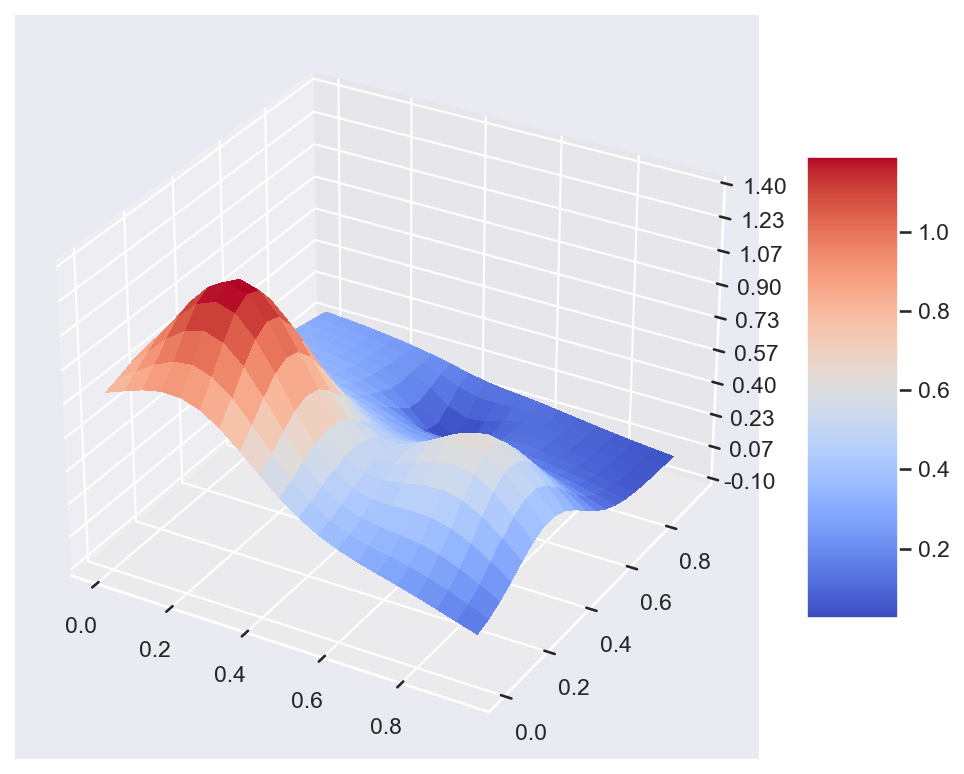

In [528]:
#redoing the surfplot, and adding one with noise 
#NOT using my data setup with random points, as those plots are uglier - this is just to illustrate the added noise on "terrain"
x = np.arange(0, 1, 0.05)
y = np.arange(0, 1, 0.05)
x, y = np.meshgrid(x,y)
z = FrankeFunction(x, y)

fig = plt.figure(figsize=(8, 8), dpi=150)
ax = fig.add_subplot(projection='3d')

# Plot the surface.
surf = ax.plot_surface(x, y, z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-0.10, 1.40)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig("results/a_frank_non_noise_terrain.png")
plt.show()


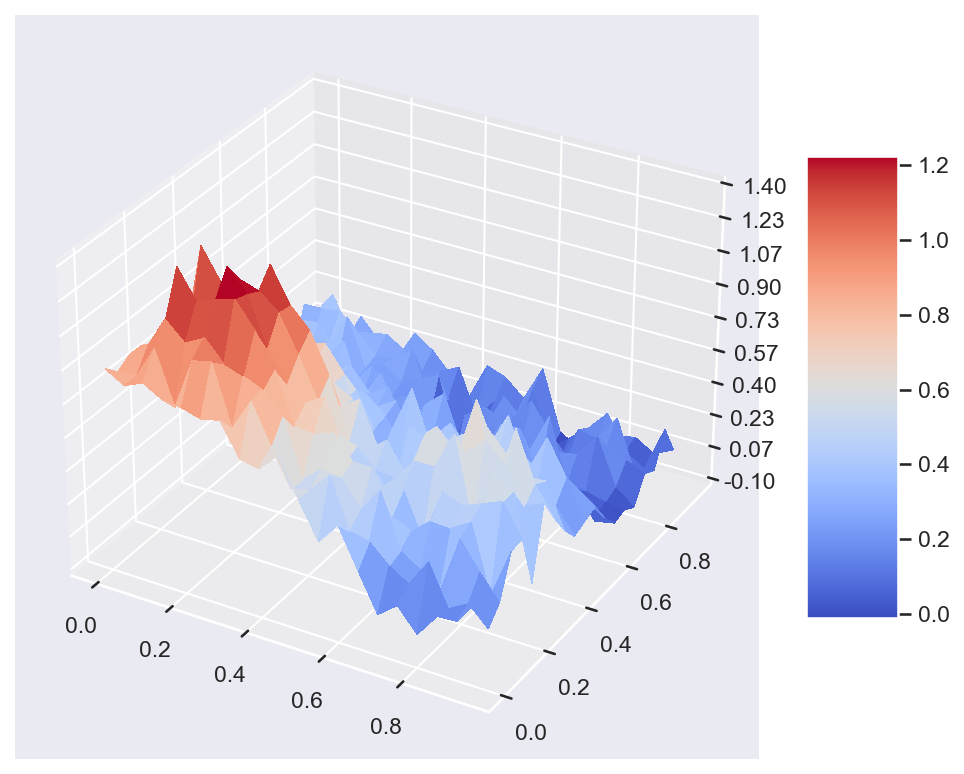

In [530]:
#One with noise
noise = np.random.normal(0, 0.1, z.shape)
z_noise = z + noise

fig = plt.figure(figsize=(8, 8), dpi=150)
ax = fig.add_subplot(projection='3d')

surf = ax.plot_surface(x, y, z_noise, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

ax.set_zlim(-0.10, 1.40)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig("results/a_frank_noisy_terrain.png")
plt.show()

Without noise:

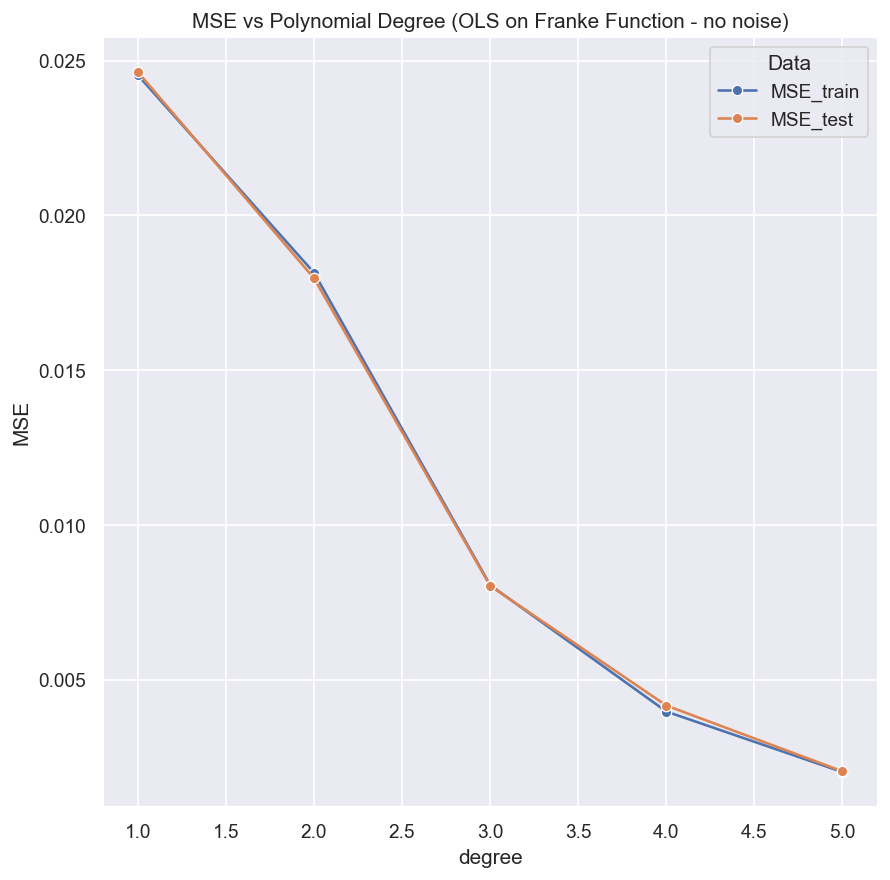

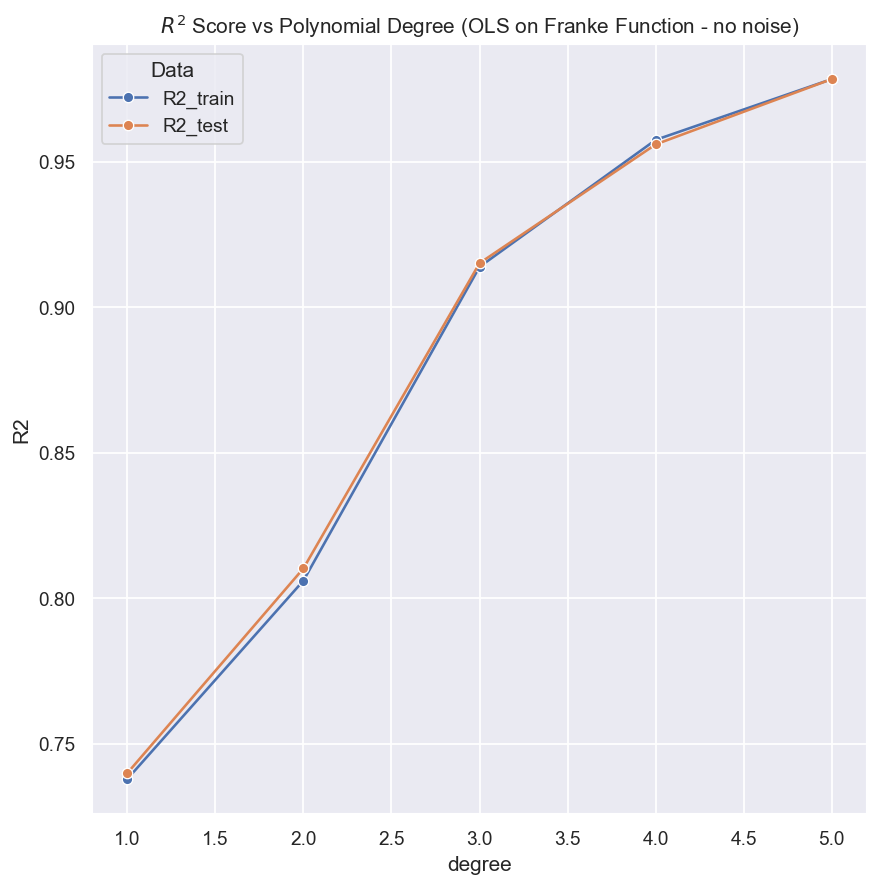

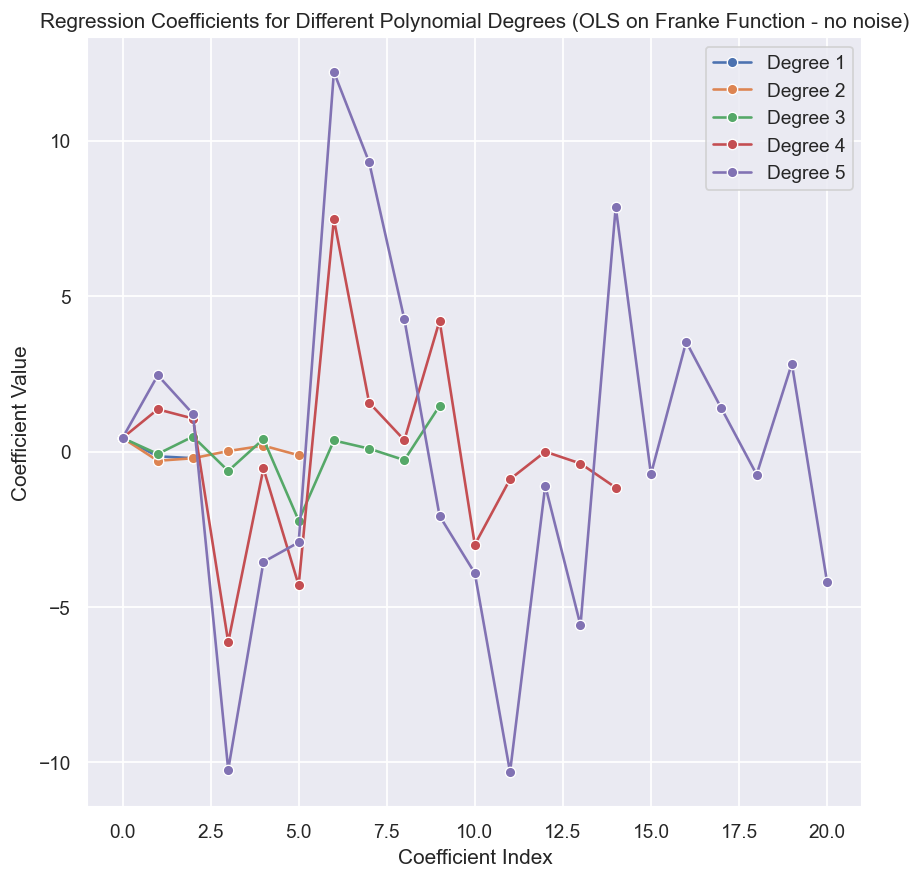

In [536]:
#Now using my franke_func_data to genereate datapoints with np.random.uniform instead
x, y, z = franke_func_data()
degrees = range(1, 6)

results_df = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
)

plot_scores(results_df, reg_method="OLS", title_string="(OLS on Franke Function - no noise)", fig_name="part_a_no_noise")
plot_coeffs(results_df, reg_method="OLS", title_string="(OLS on Franke Function - no noise)", fig_name="part_a_no_noise")

With noise:

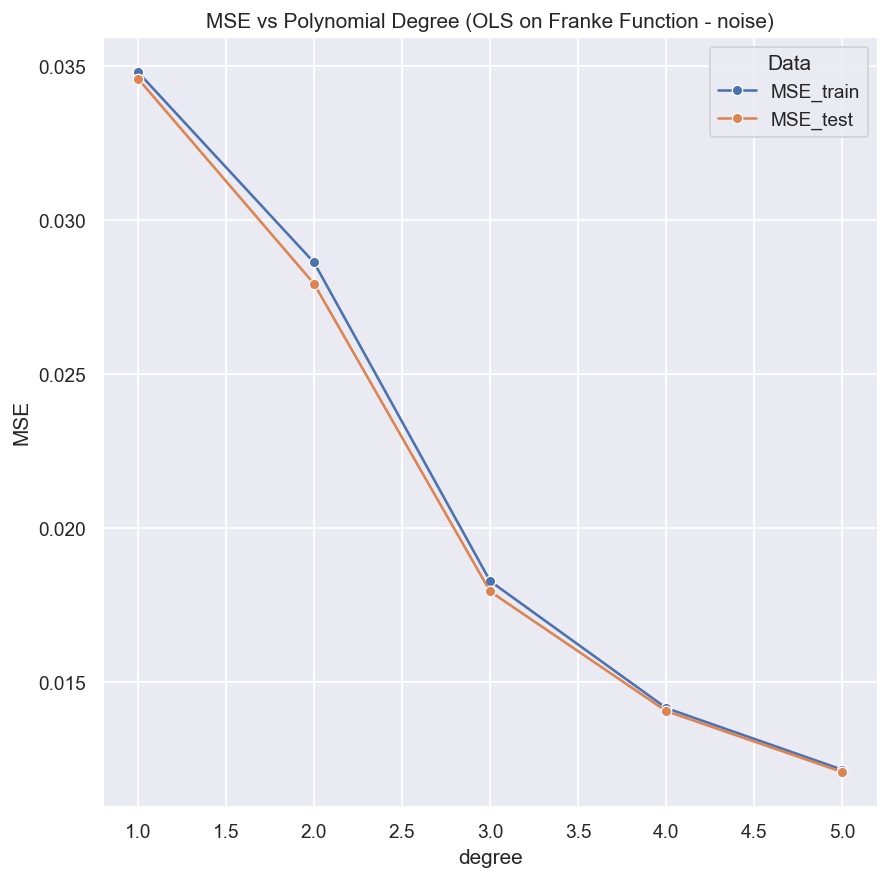

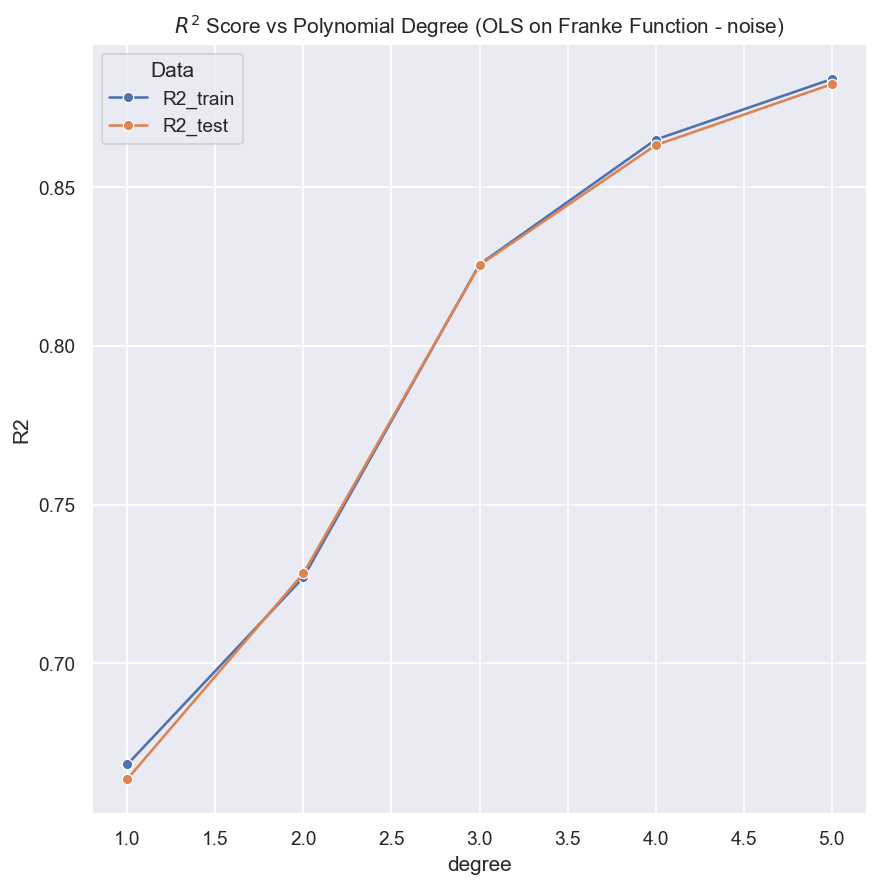

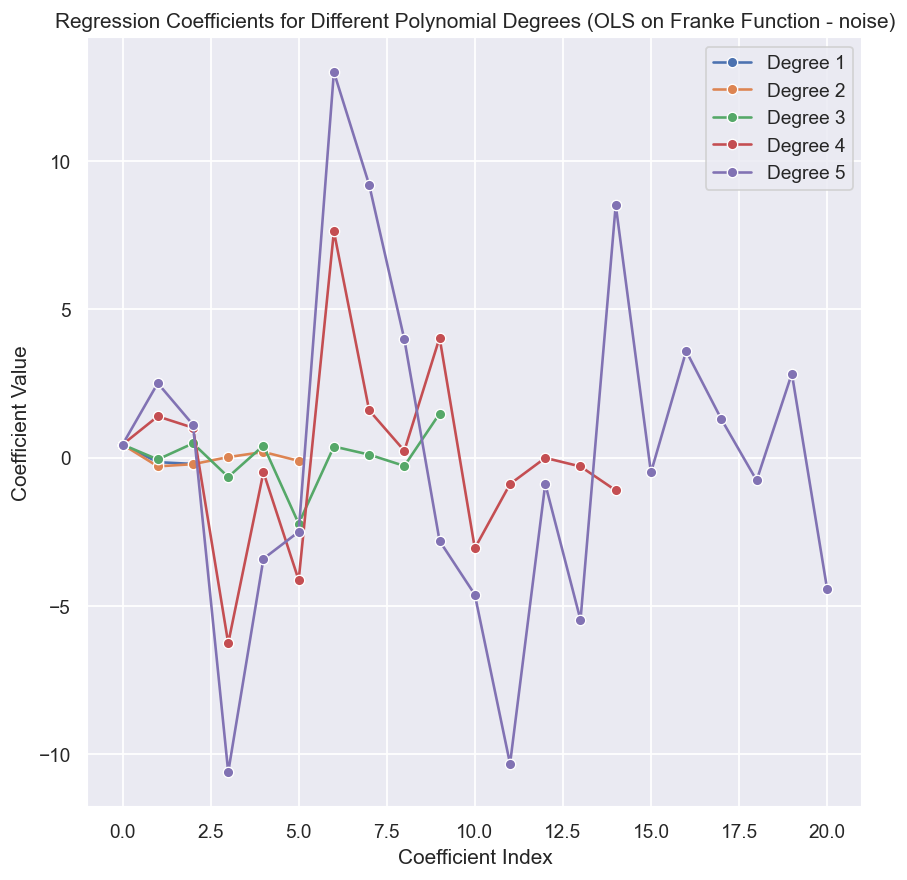

In [538]:
x, y, z = franke_func_data(add_noise=True)
degrees = range(1, 6)

results_df = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
)

plot_scores(results_df, reg_method="OLS", title_string="(OLS on Franke Function - noise)", fig_name="part_a_noise")
plot_coeffs(results_df, reg_method="OLS", title_string="(OLS on Franke Function - noise)", fig_name="part_a_noise")

Noise but w/o scaling.

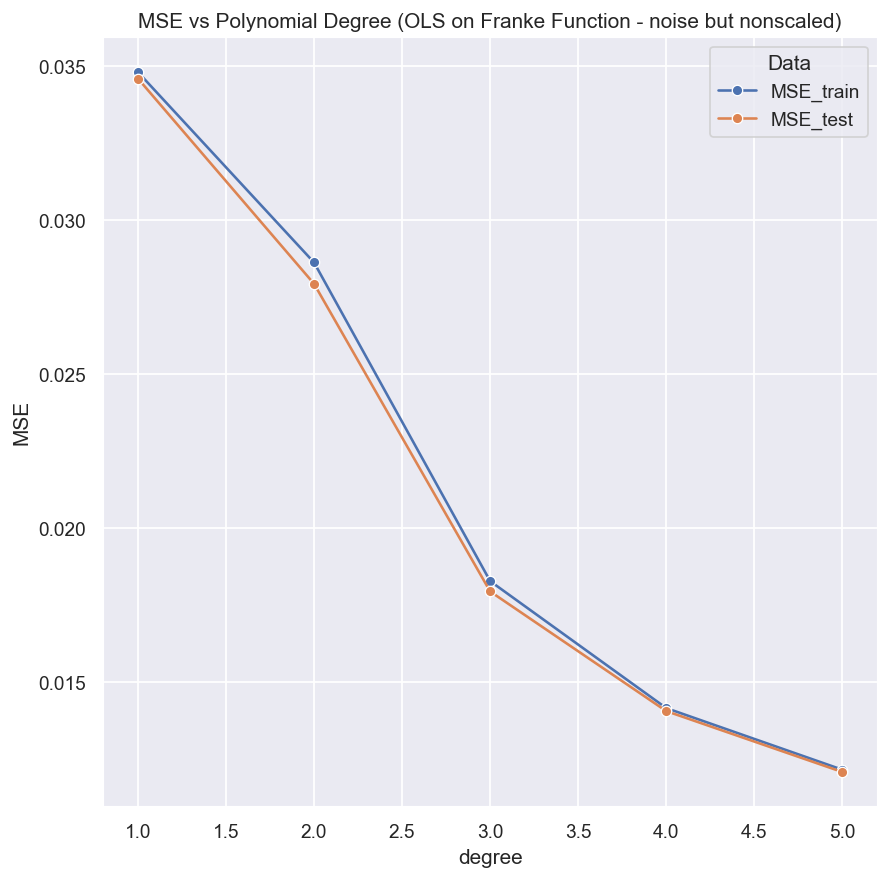

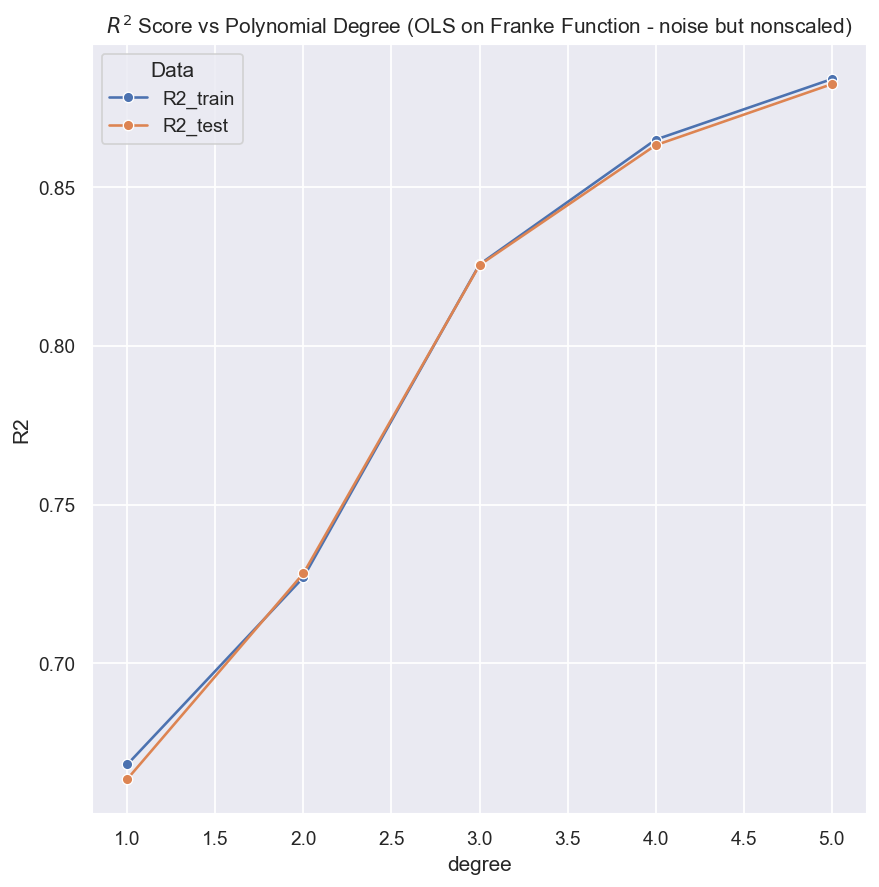

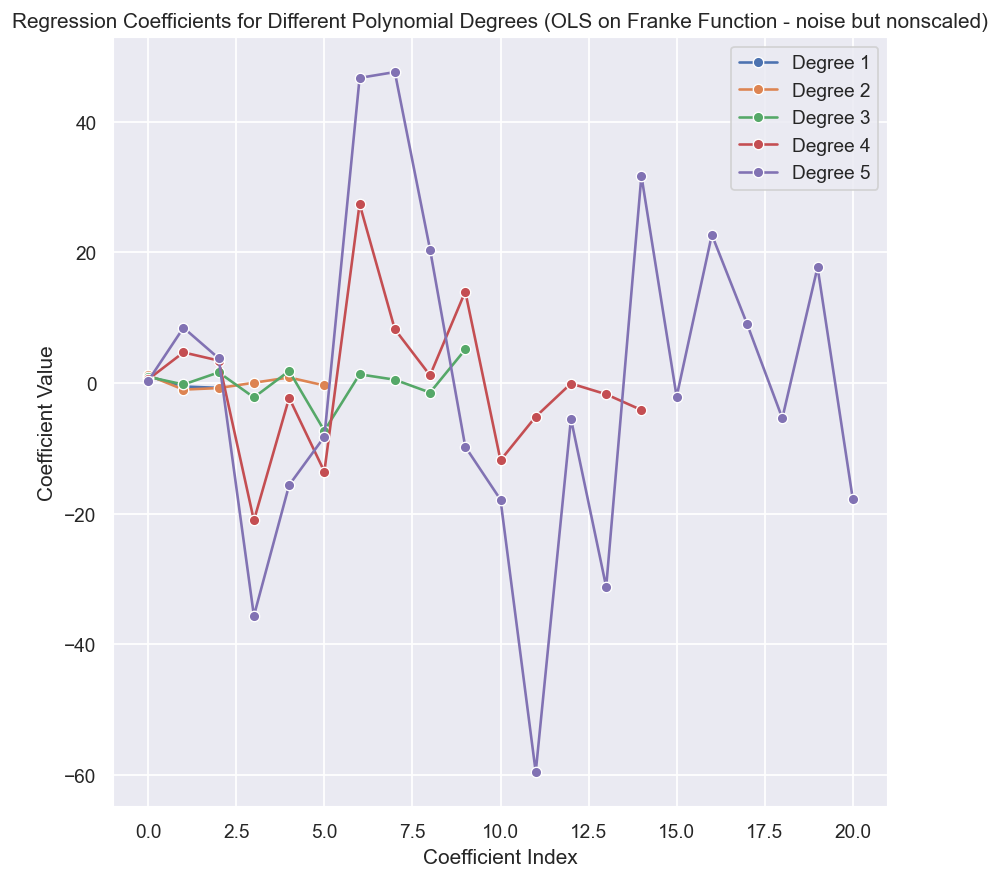

In [544]:
x, y, z = franke_func_data(add_noise=True)
degrees = range(1, 6)

results_df = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
    scaling=False
)

plot_scores(results_df, reg_method="OLS", title_string="(OLS on Franke Function - noise but nonscaled)", fig_name="part_a_noise_nonscaled")
plot_coeffs(results_df, reg_method="OLS", title_string="(OLS on Franke Function - noise but nonscaled)", fig_name="part_a_noise_nonscaled")

##### Part b): Adding Ridge regression for the Franke function.

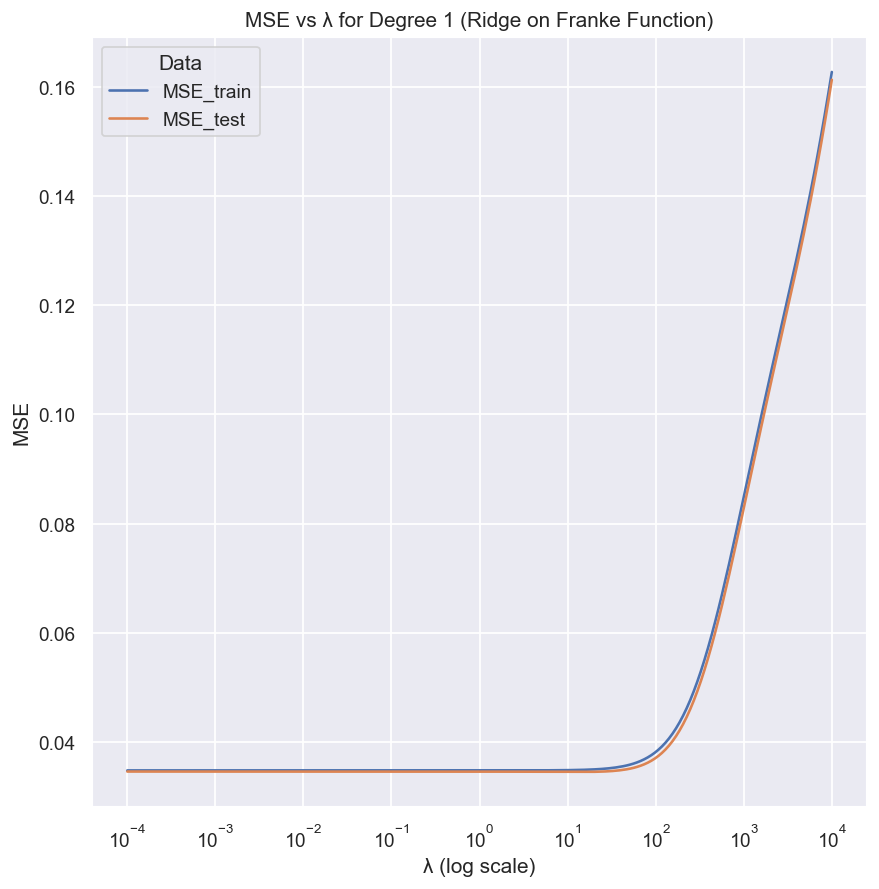

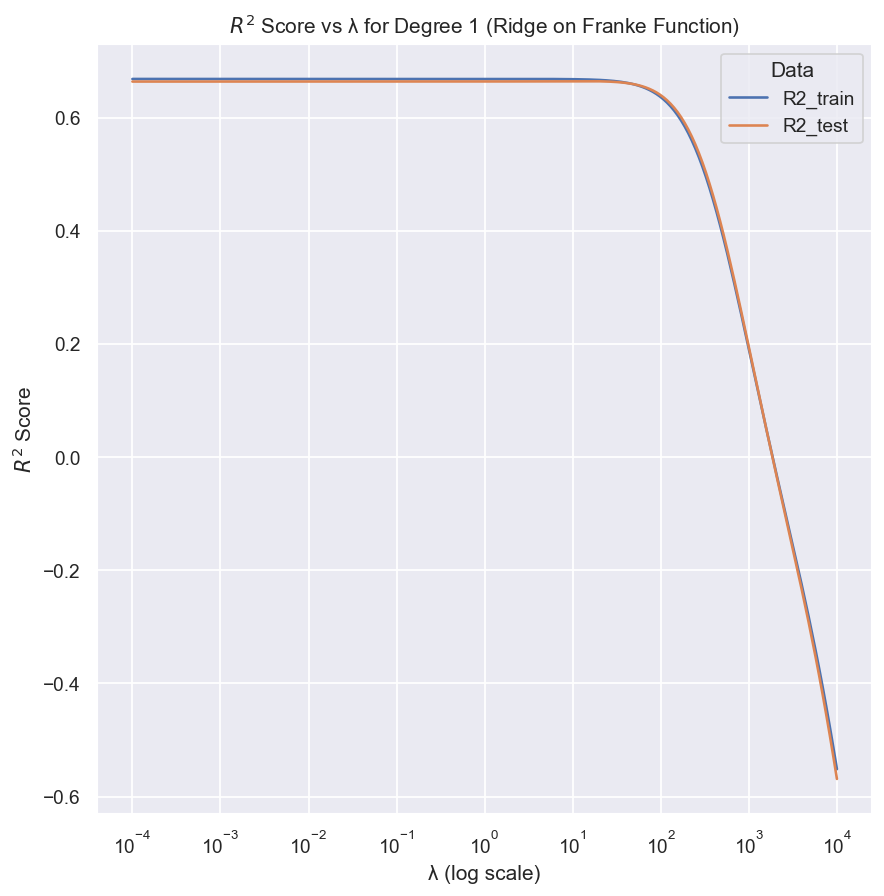

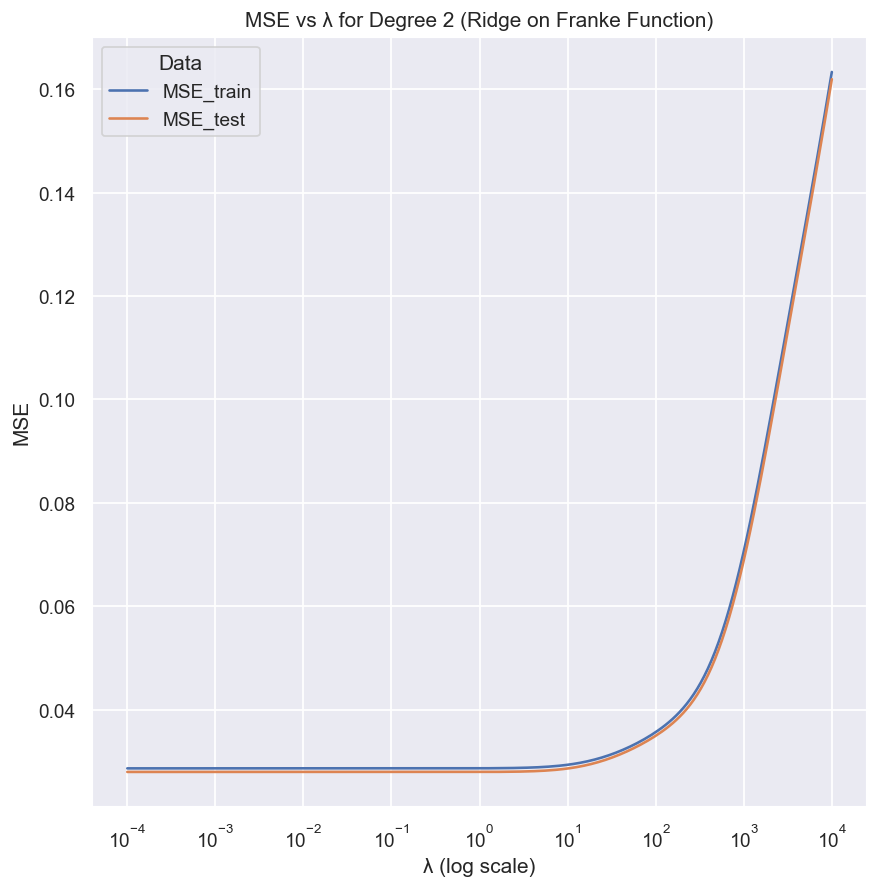

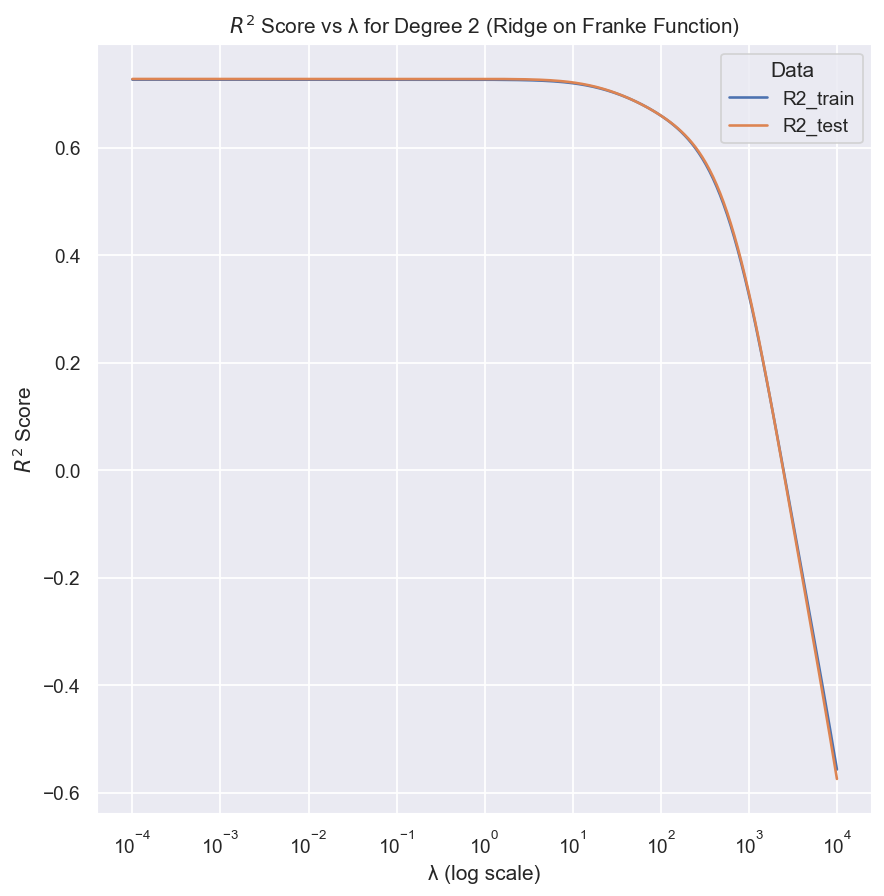

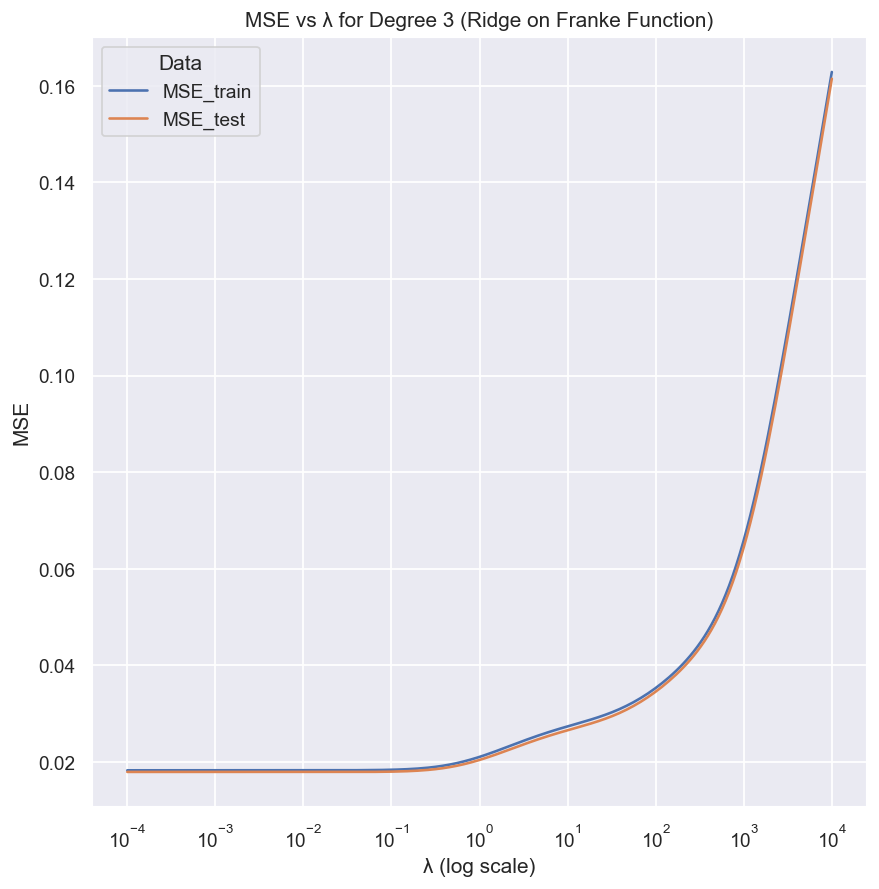

...

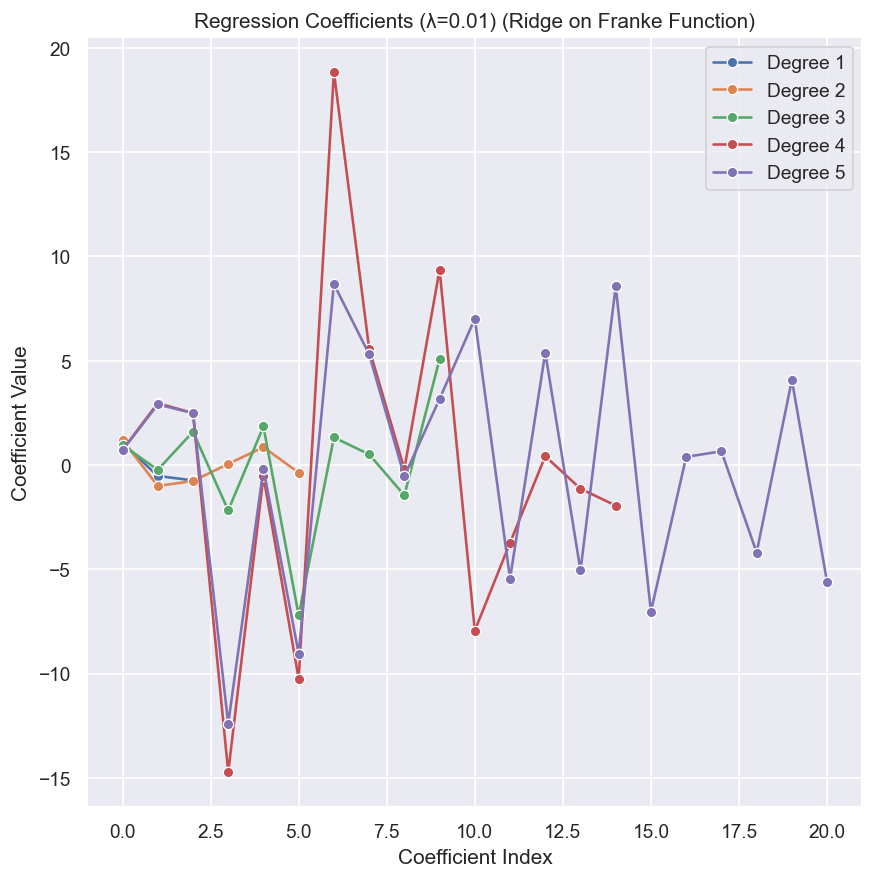

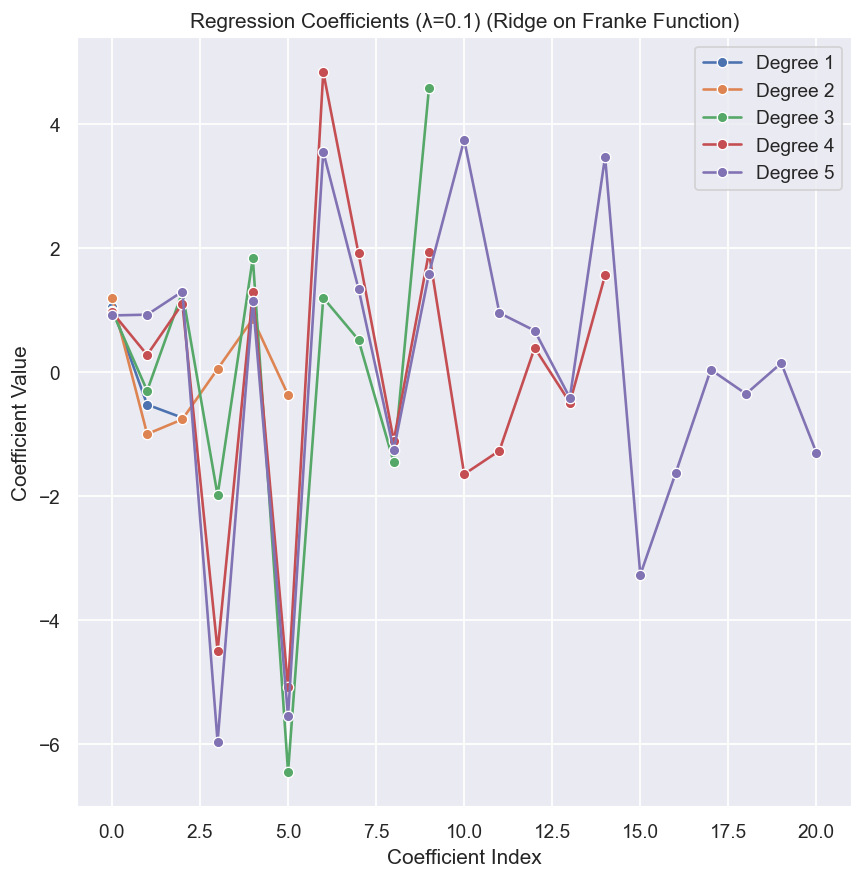

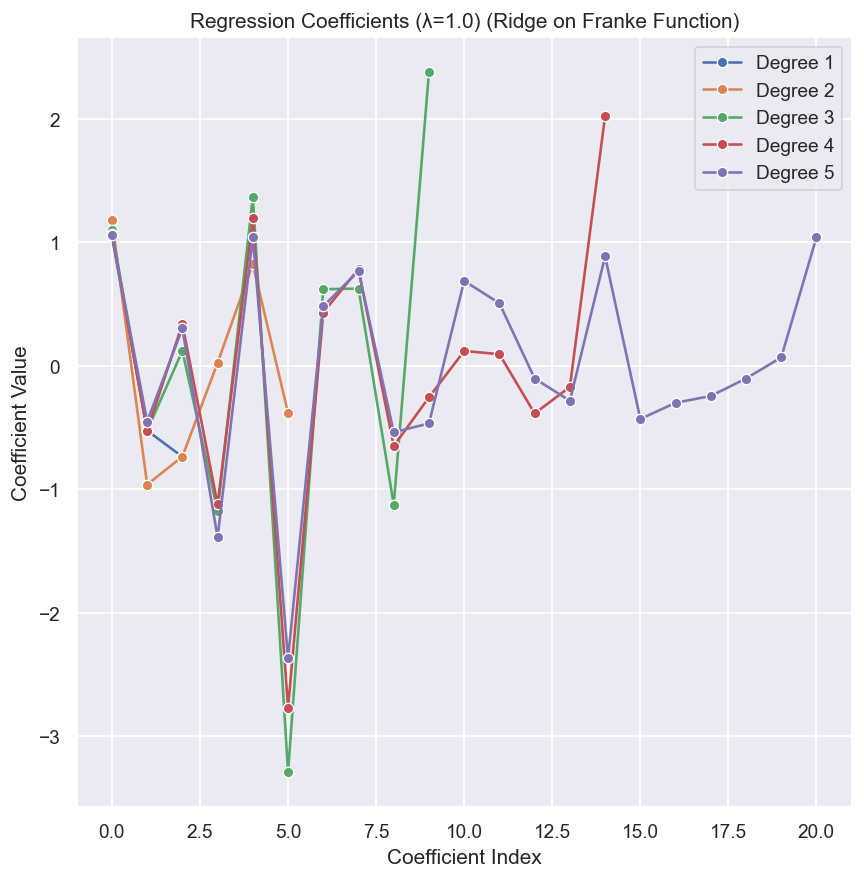

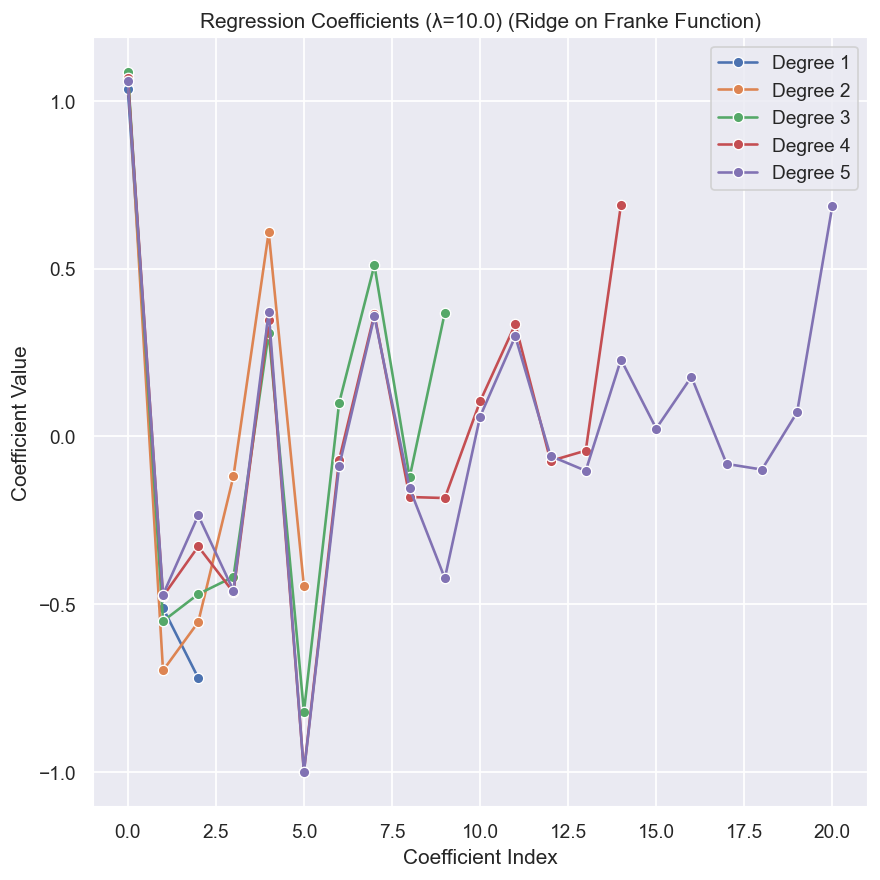

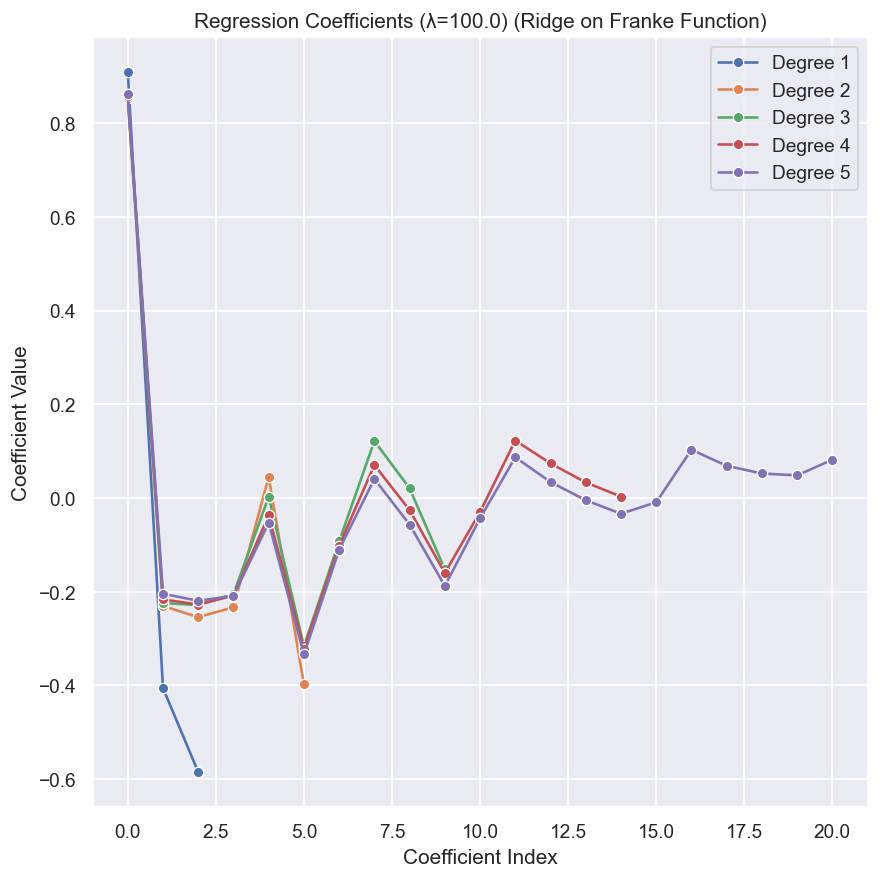

In [698]:
x, y, z = franke_func_data(add_noise=True)
degrees = range(1, 6)
lambdas = np.logspace(-4, 4, 200)

results_df_ridge = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Ridge",
    lambdas=lambdas,
    scaling=False
)

plot_scores(results_df_ridge, reg_method="Ridge", title_string="(Ridge on Franke Function)", fig_name="part_b_noise")

#need smaller lambda range for coef plot
lambdas = np.logspace(-4, 2, 7)

results_df_ridge = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Ridge",
    lambdas=lambdas,
    scaling=False
)
plot_coeffs(results_df_ridge, reg_method="Ridge", title_string="(Ridge on Franke Function)", fig_name="part_b_noise")


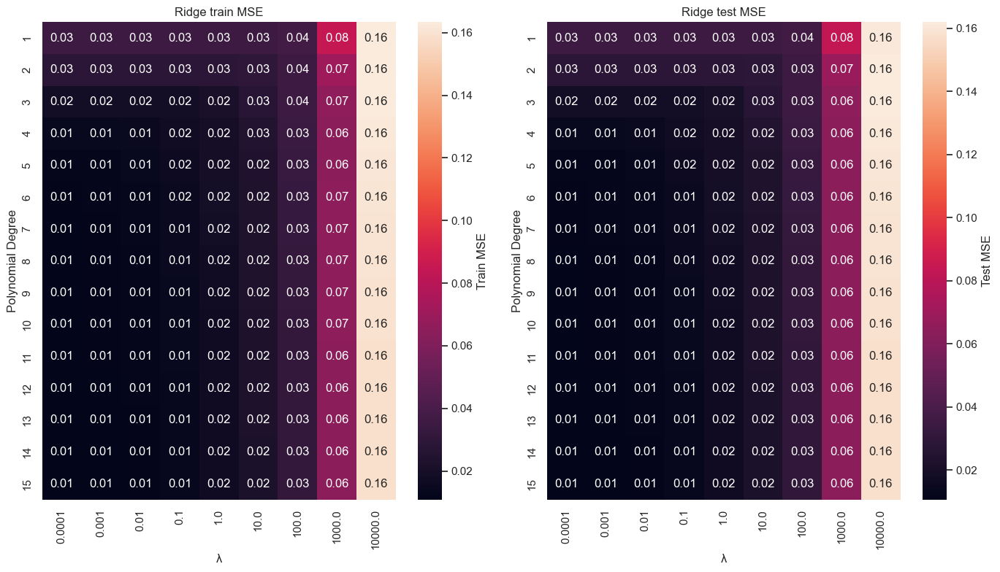

In [696]:
x, y, z = franke_func_data(add_noise=True)
lambdas = np.logspace(-4, 4, 9)

results_df_ridge = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Ridge",
    lambdas=lambdas,
    scaling=False
)

#Reshaping the ridge df to create heatmaps for mse
mse_train_pivot = results_df_ridge.pivot(index="degree", columns="lambda", values="MSE_train")
mse_test_pivot = results_df_ridge.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
sns.heatmap(mse_train_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Train MSE"})
plt.title("Ridge train MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.subplot(1, 2, 2)
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Ridge test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.tight_layout()
plt.savefig("results/ridge_heatmap.png")
plt.show()


##### Part c): Adding Lasso for the Franke function.

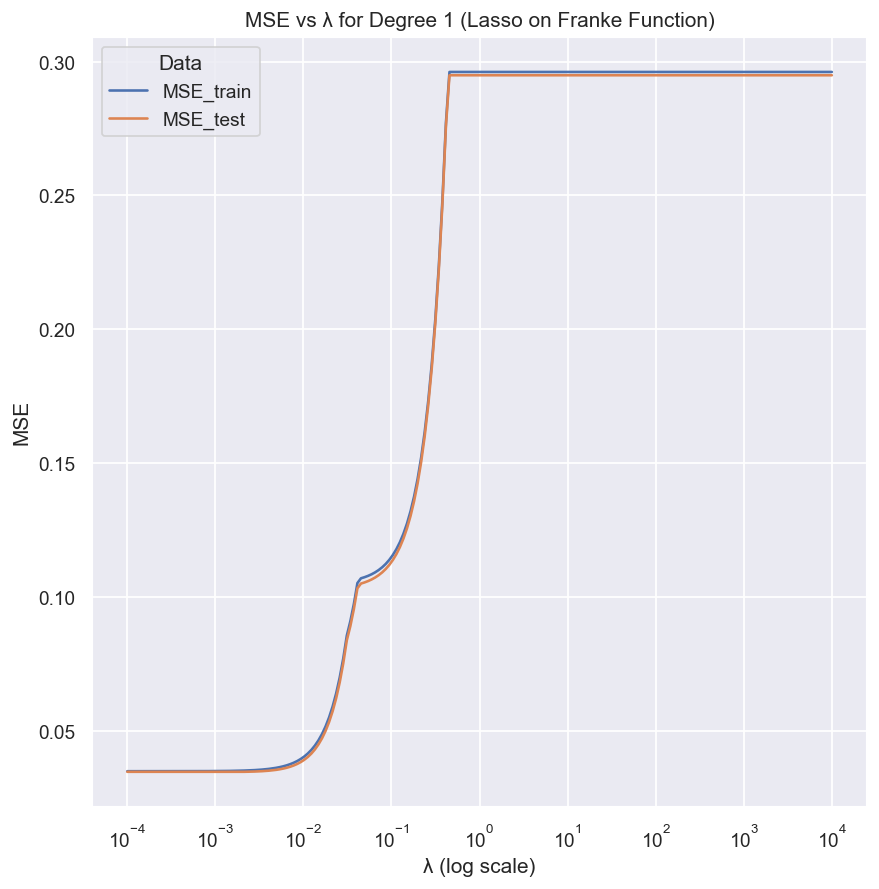

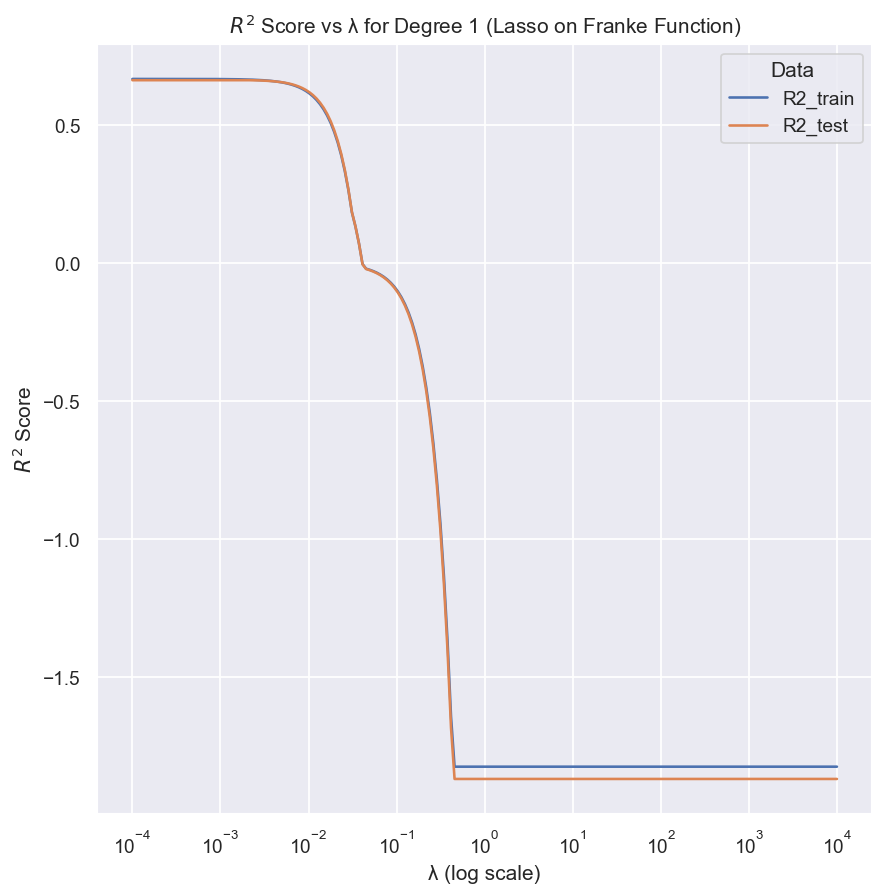

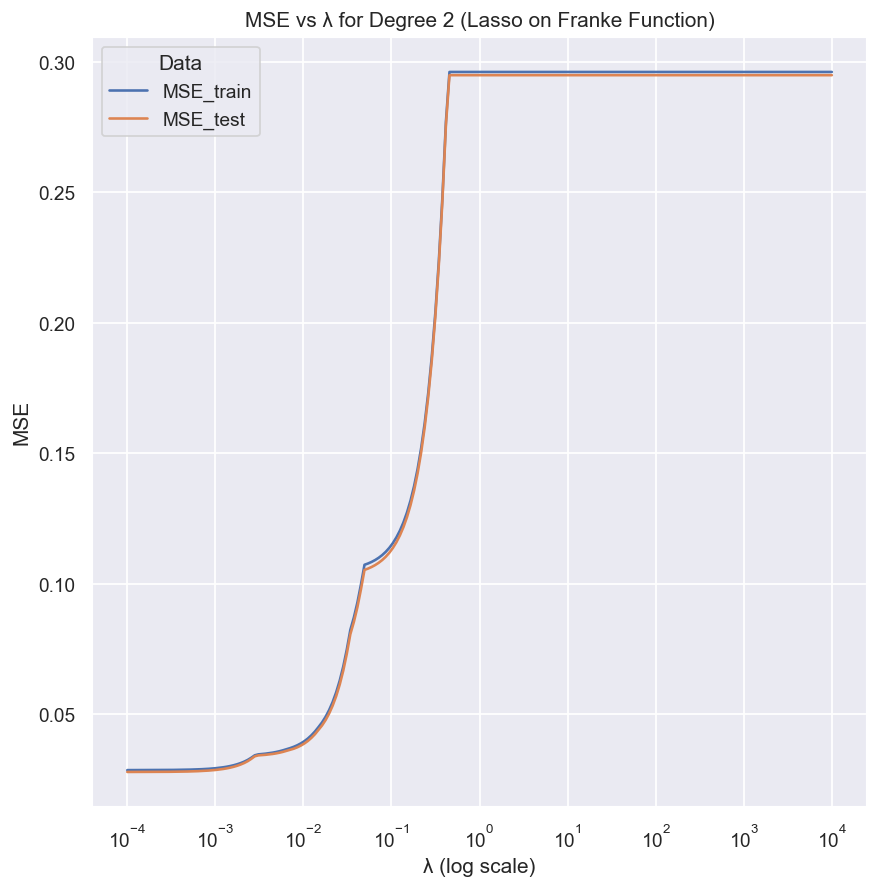

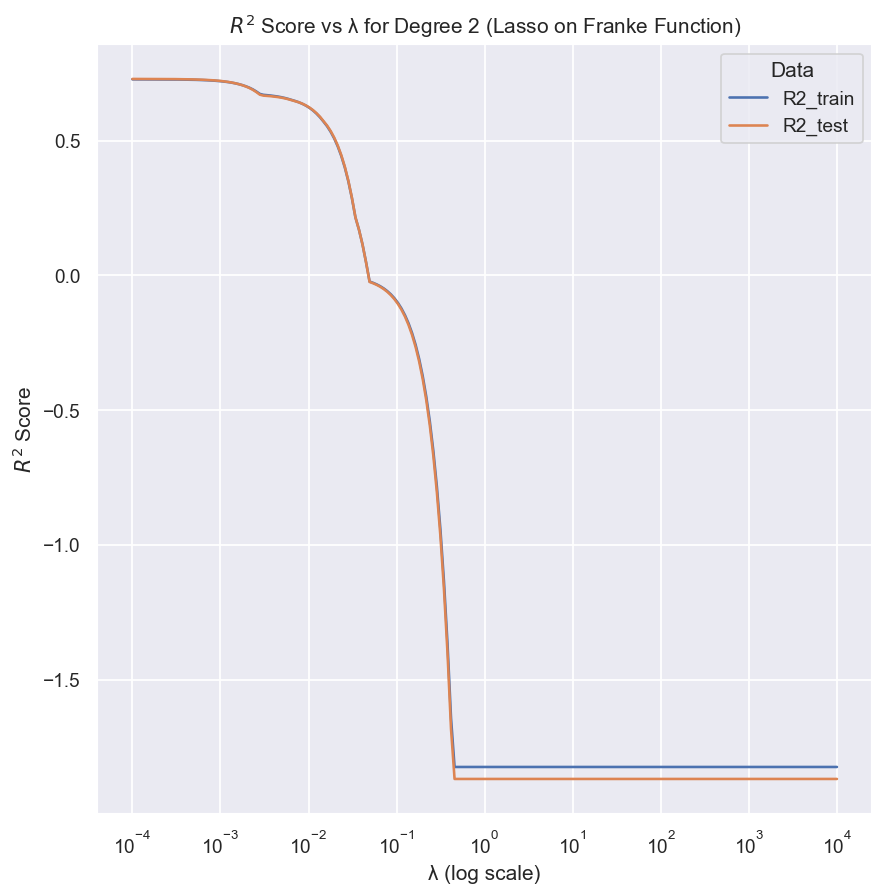

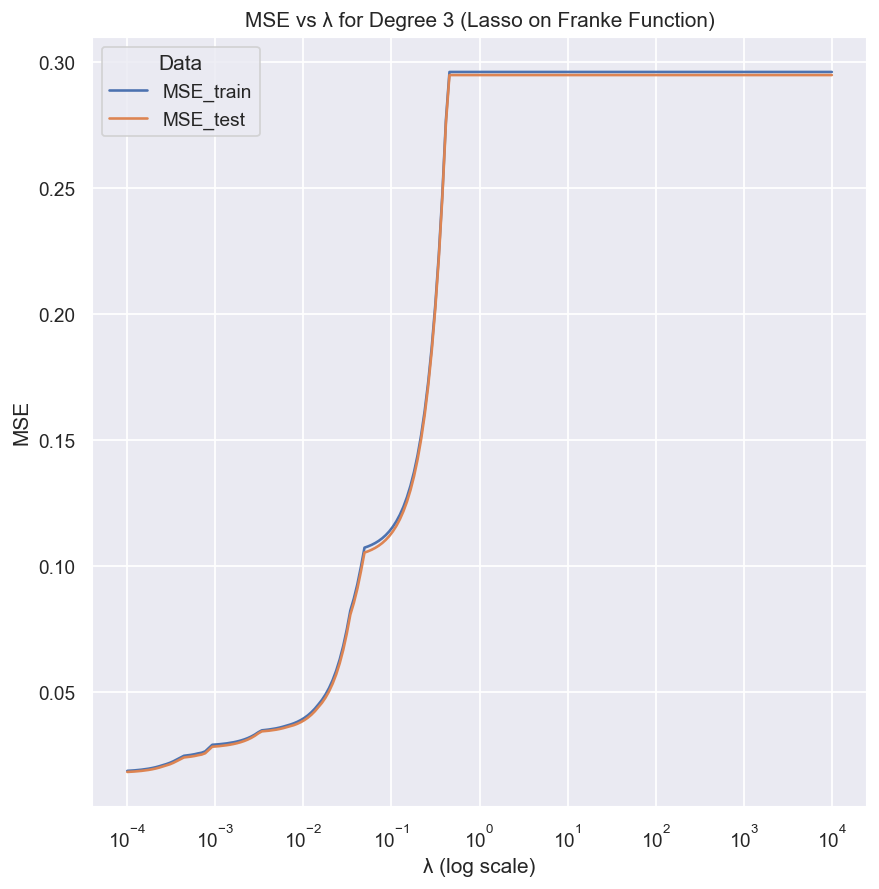

...

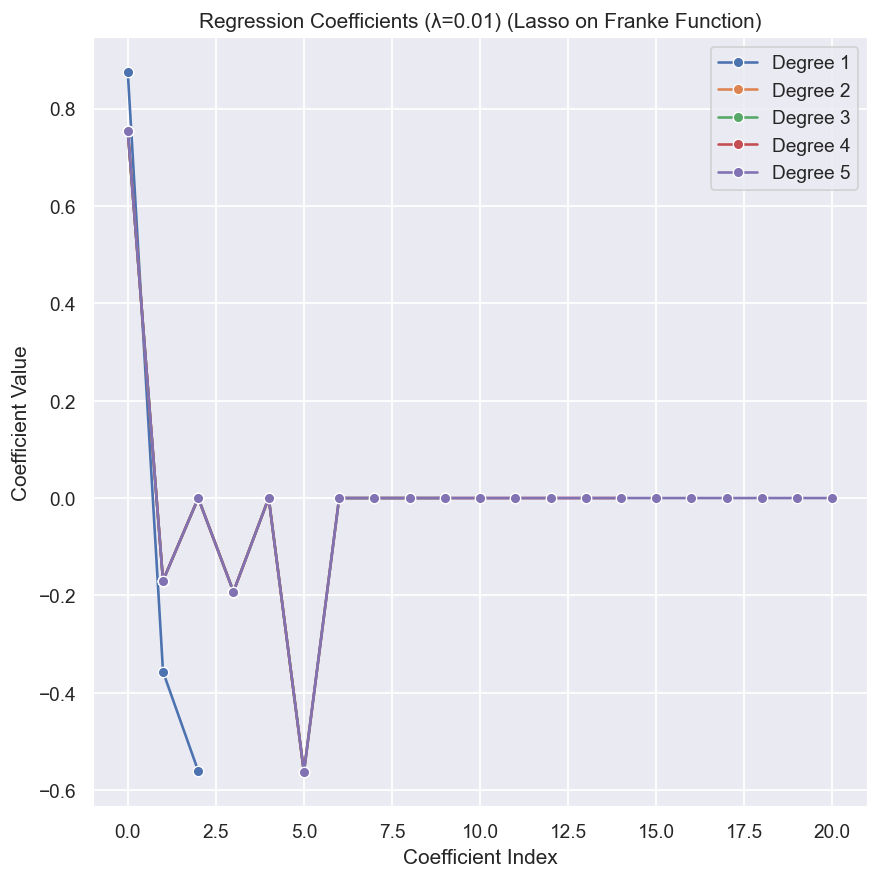

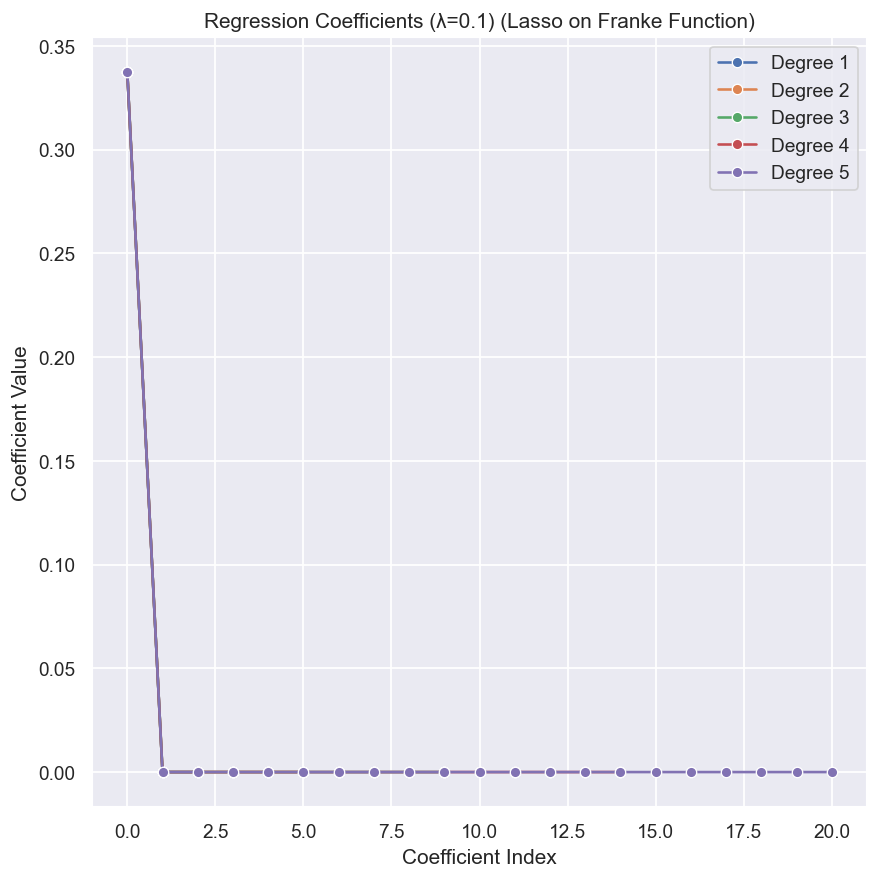

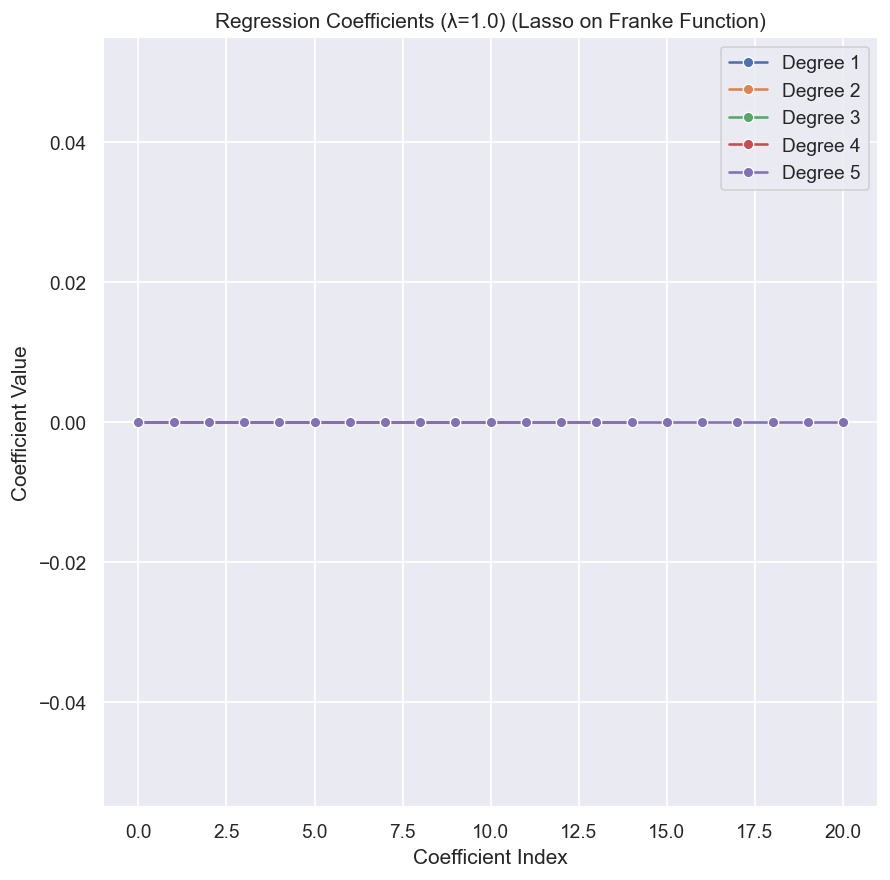

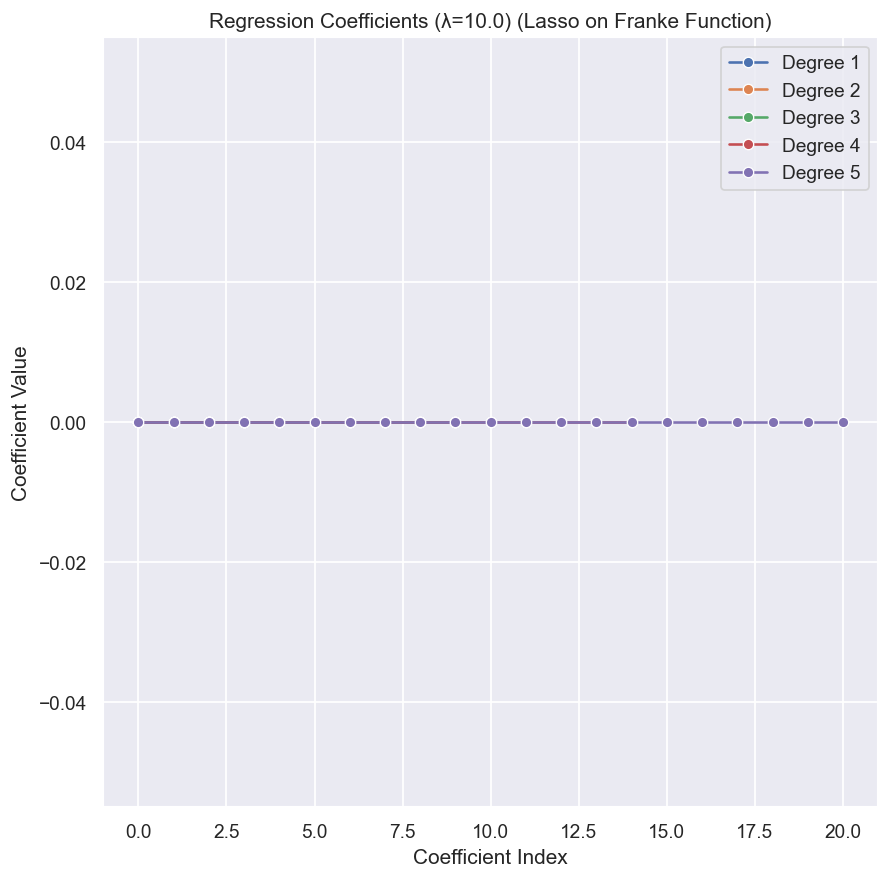

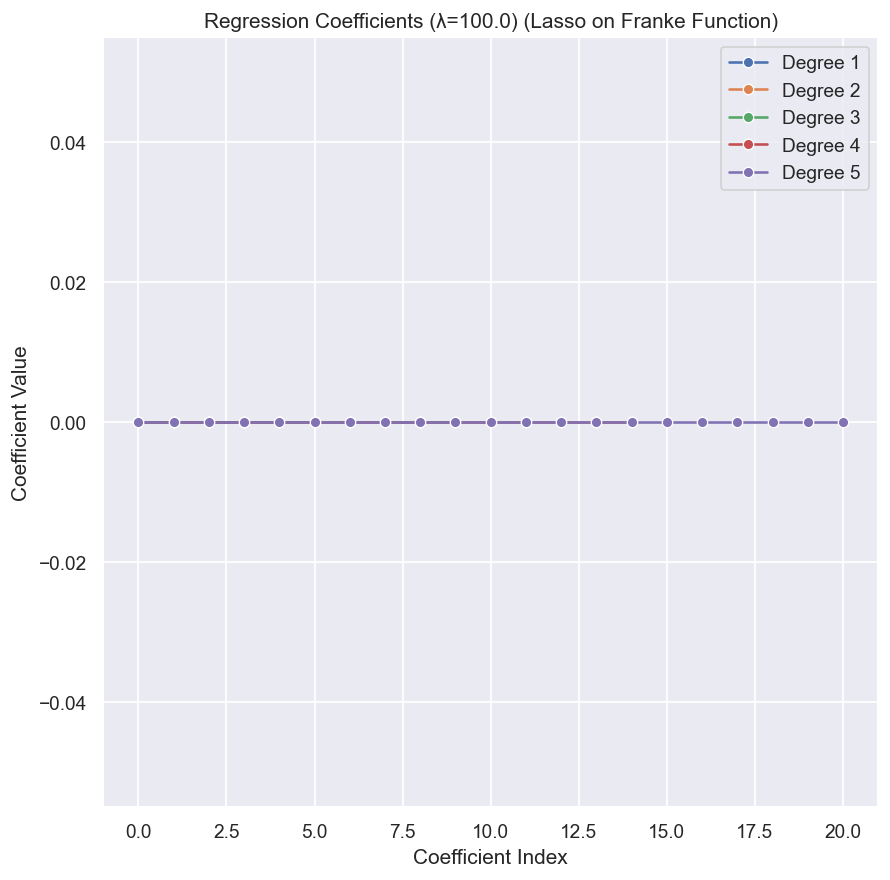

In [700]:
x, y, z = franke_func_data(add_noise=True)
degrees = range(1, 6)
lambdas = np.logspace(-4, 4, 200)
#lambdas = np.logspace(-4, 1, 6)
results_df_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
    scaling=False
)

plot_scores(results_df_lasso, reg_method="Lasso", title_string="(Lasso on Franke Function)", fig_name="part_c_noise")

#need smaller lambda range for coef plot
lambdas = np.logspace(-4, 2, 7)

results_df_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
    scaling=False
)
plot_coeffs(results_df_lasso, reg_method="Lasso", title_string="(Lasso on Franke Function)", fig_name="part_c_noise")

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.448e+00, tolerance: 2.369e-01
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.685e+00, tolerance: 2.369e-01
  model = cd_fast.enet_coordinate_descent(


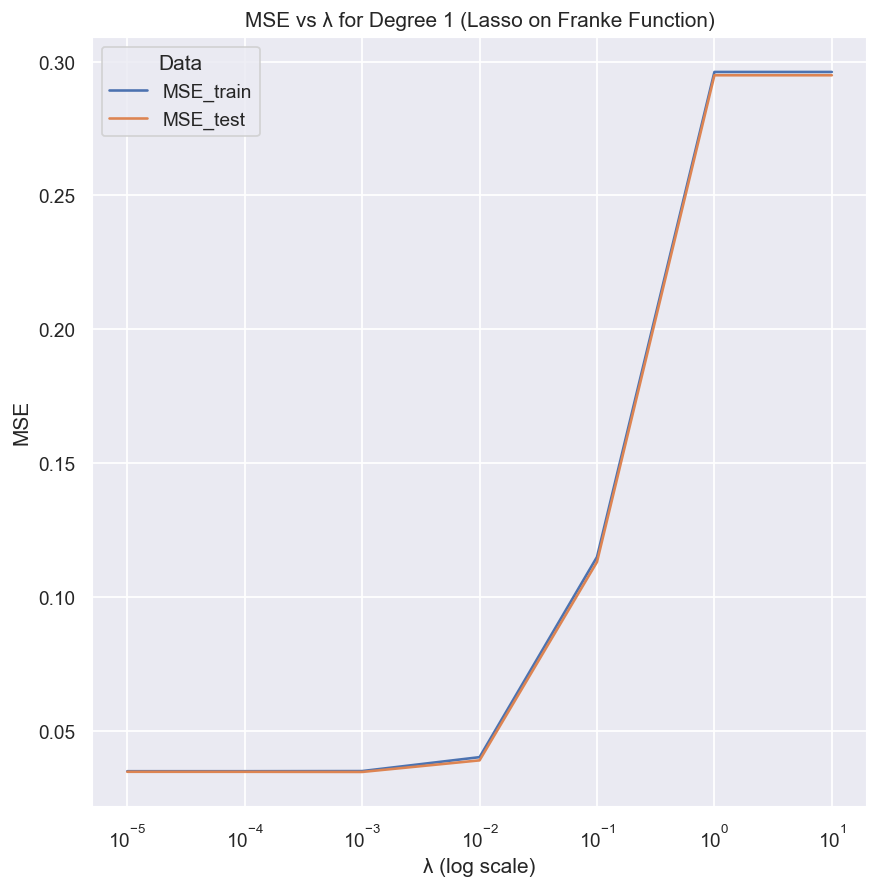

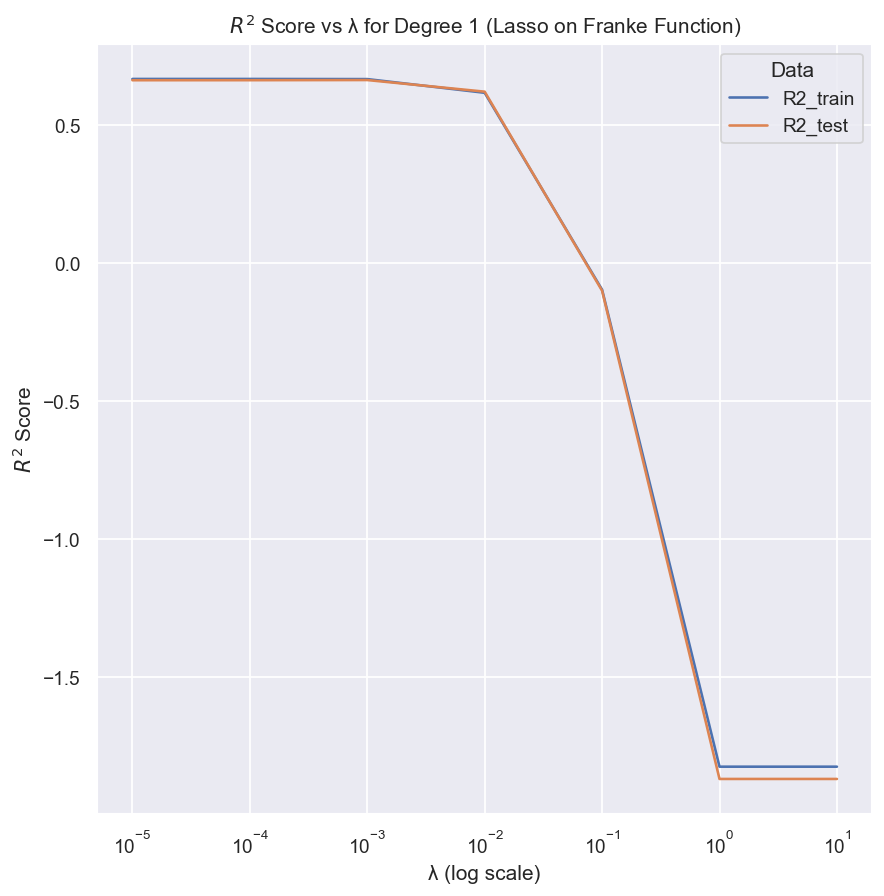

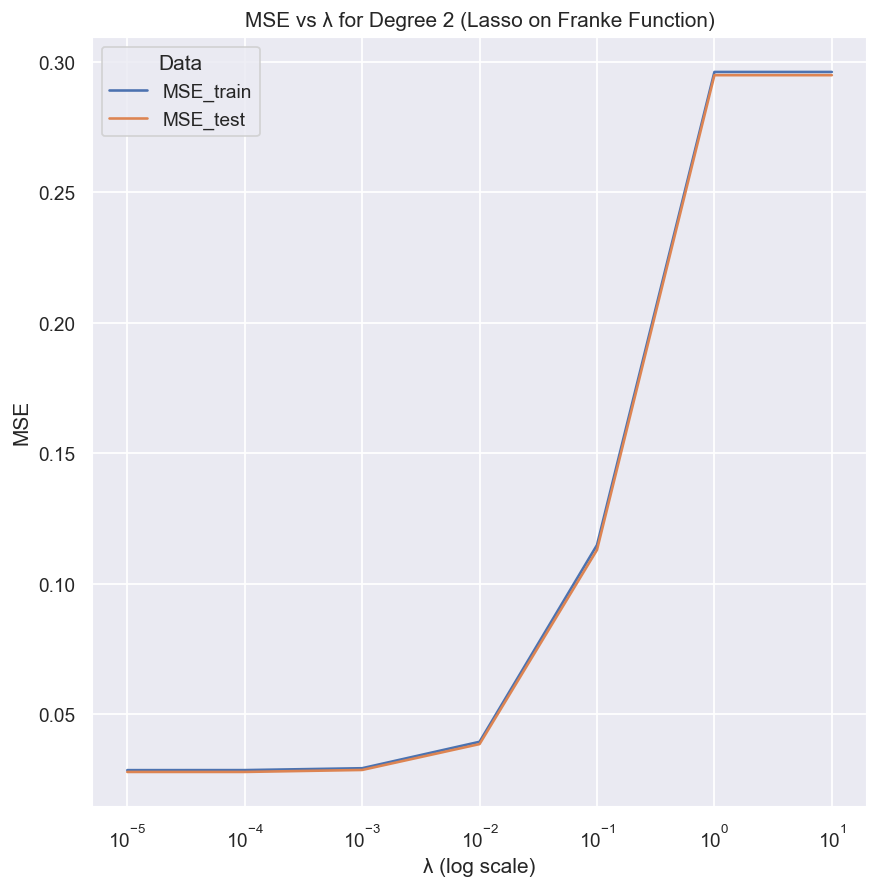

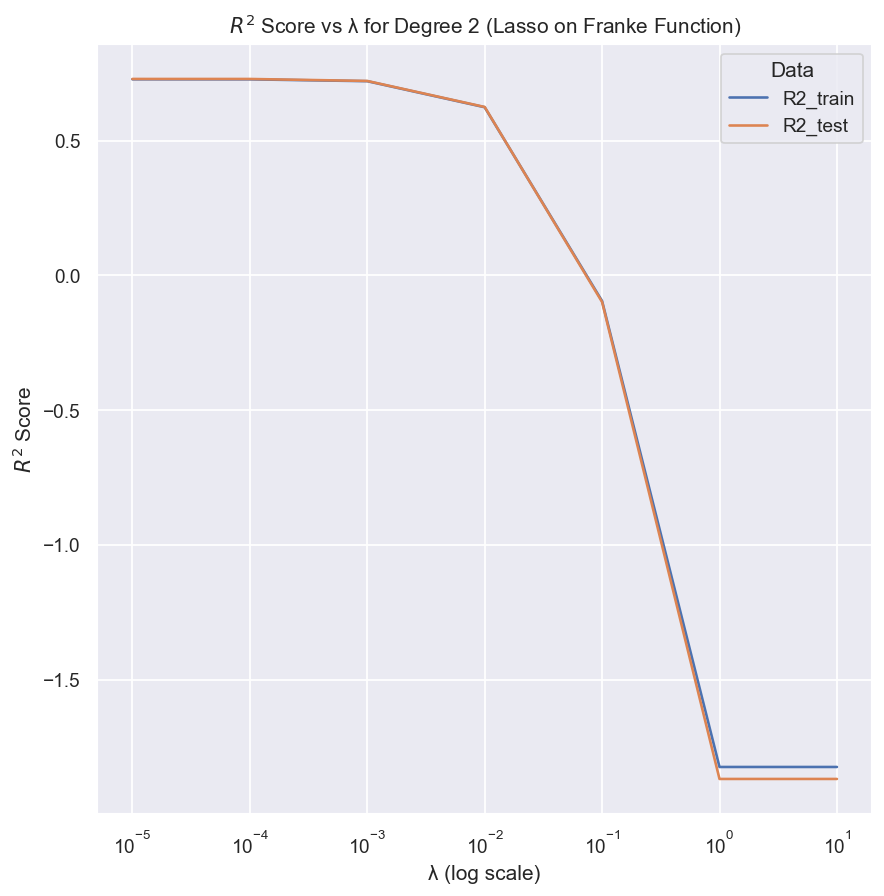

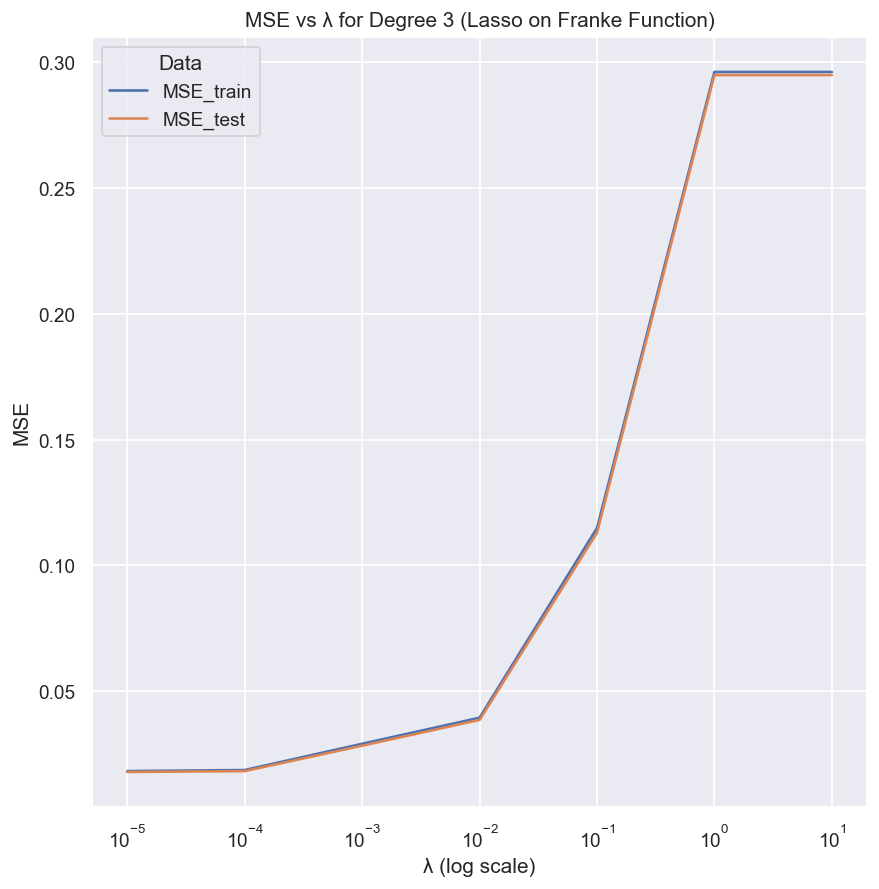

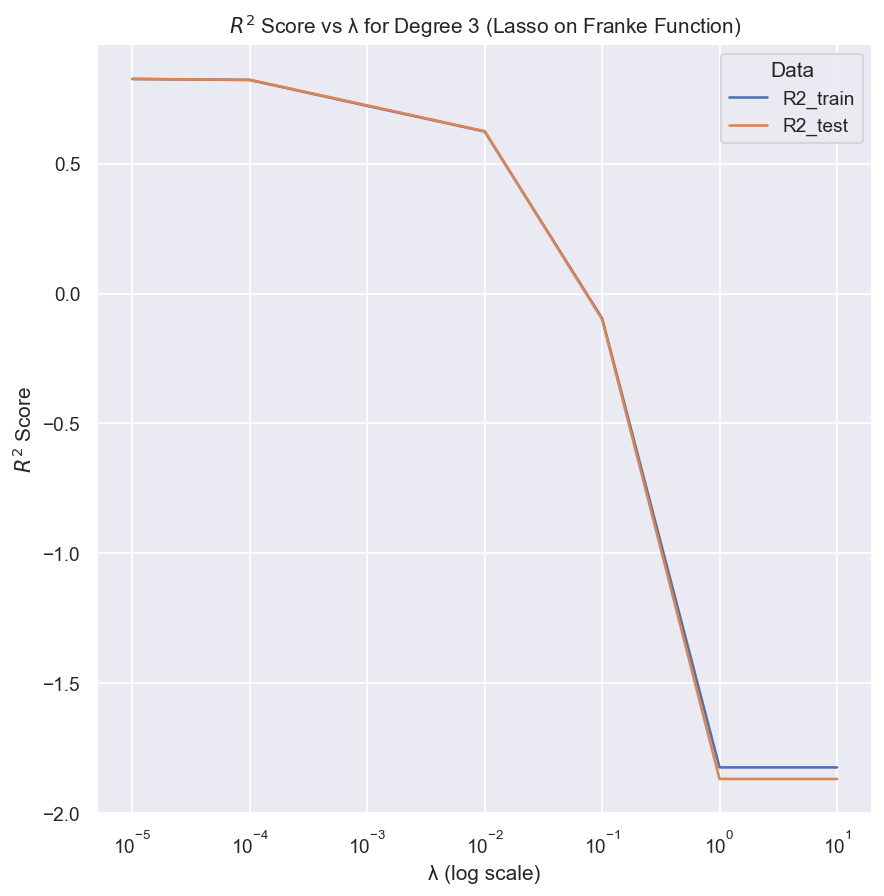

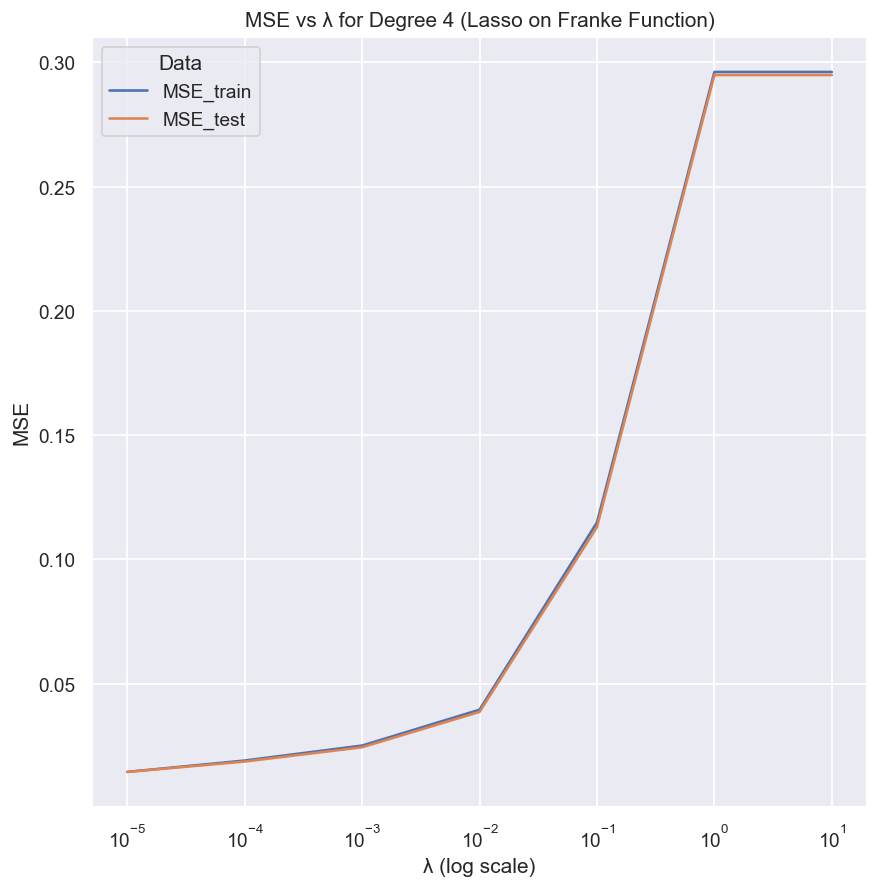

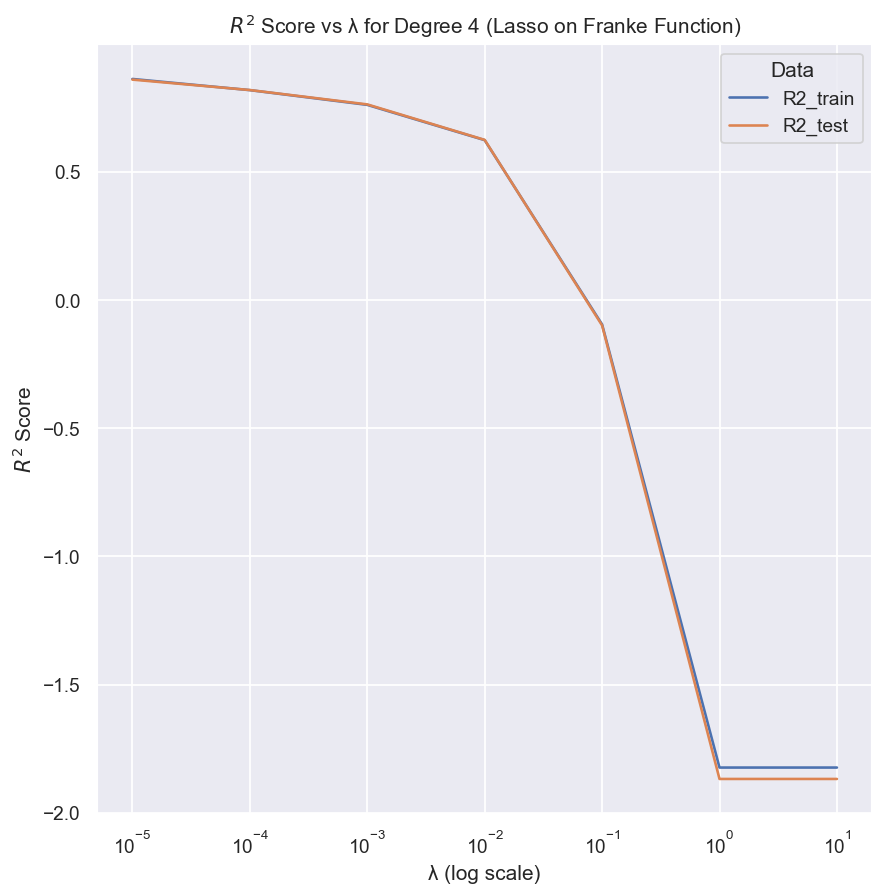

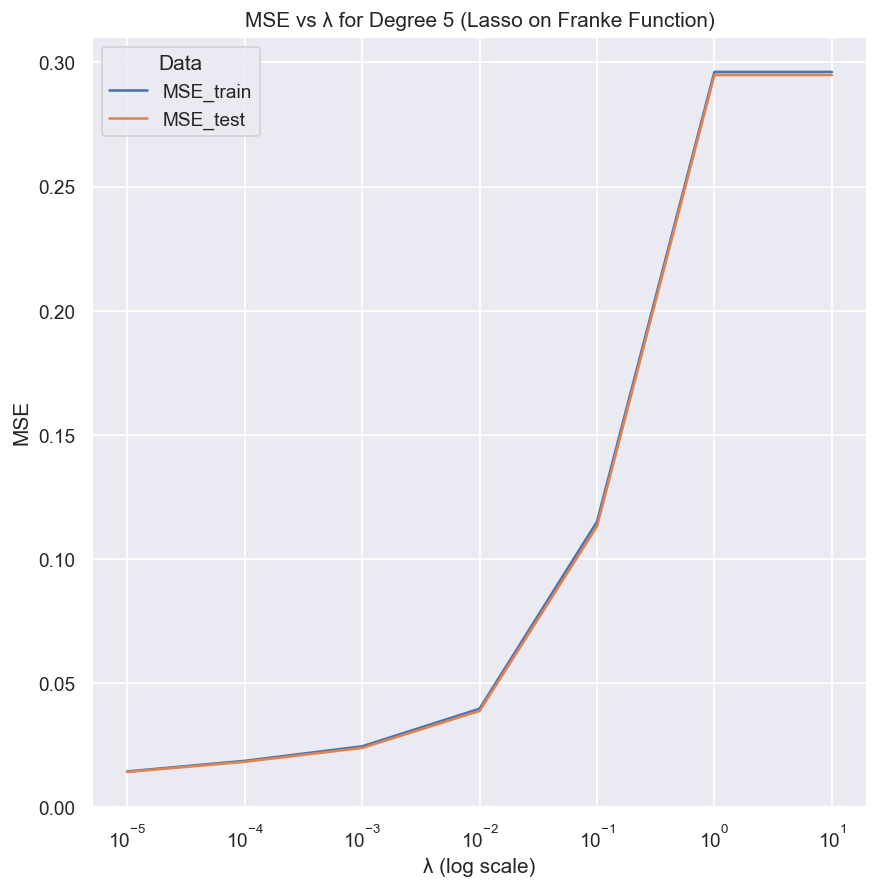

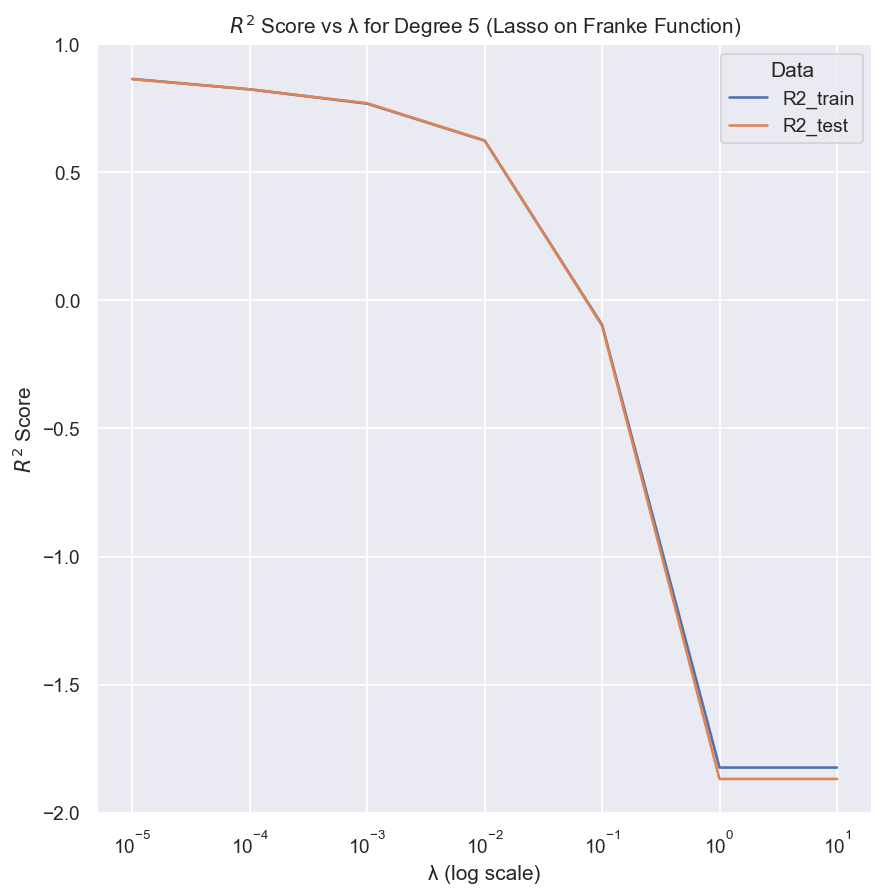

In [702]:
#evident that -4,4 is a bit far can test -5,1 instead
lambdas = np.logspace(-5, 1, 7)
results_df_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
    scaling=False
)

plot_scores(results_df_lasso, reg_method="Lasso", title_string="(Lasso on Franke Function)", fig_name="part_c_v2_noise")

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.448e+00, tolerance: 2.369e-01
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.685e+00, tolerance: 2.369e-01
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.710e-01, toleranc

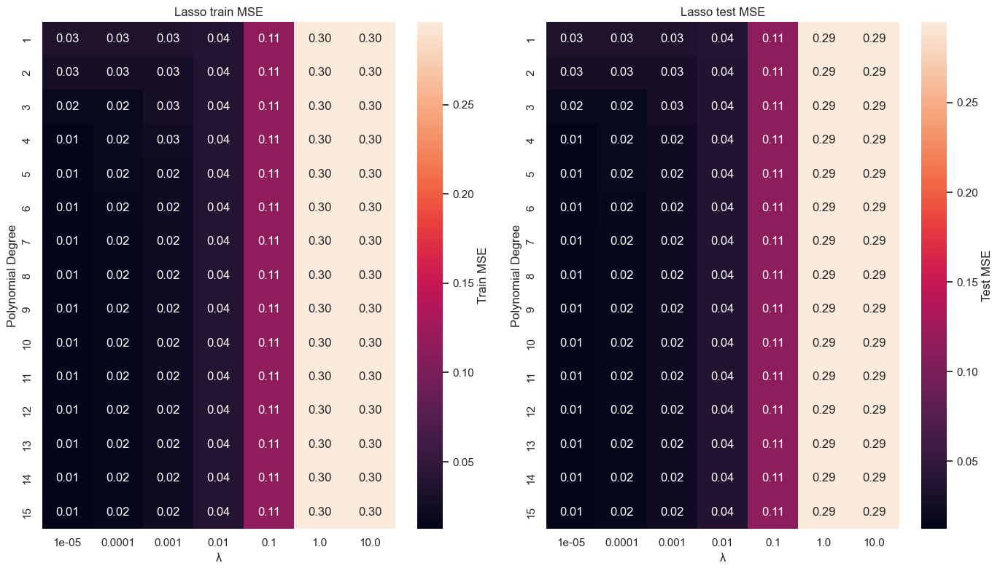

In [704]:
#lasso heatmaps
x, y, z = franke_func_data(add_noise=True)
lambdas = np.logspace(-5, 1, 7)

results_df_lasso = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Lasso",
    lambdas=lambdas,
    scaling=False
)

mse_train_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_train")
mse_test_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
sns.heatmap(mse_train_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Train MSE"})
plt.title("Lasso train MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.subplot(1, 2, 2)
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Lasso test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.tight_layout()
plt.savefig("results/lasso_heatmap.png")
plt.show()

##### Part d): Paper and pencil part. Not done in this notebook, see the report.

##### Part e): Bias-variance trade-off and resampling techniques.

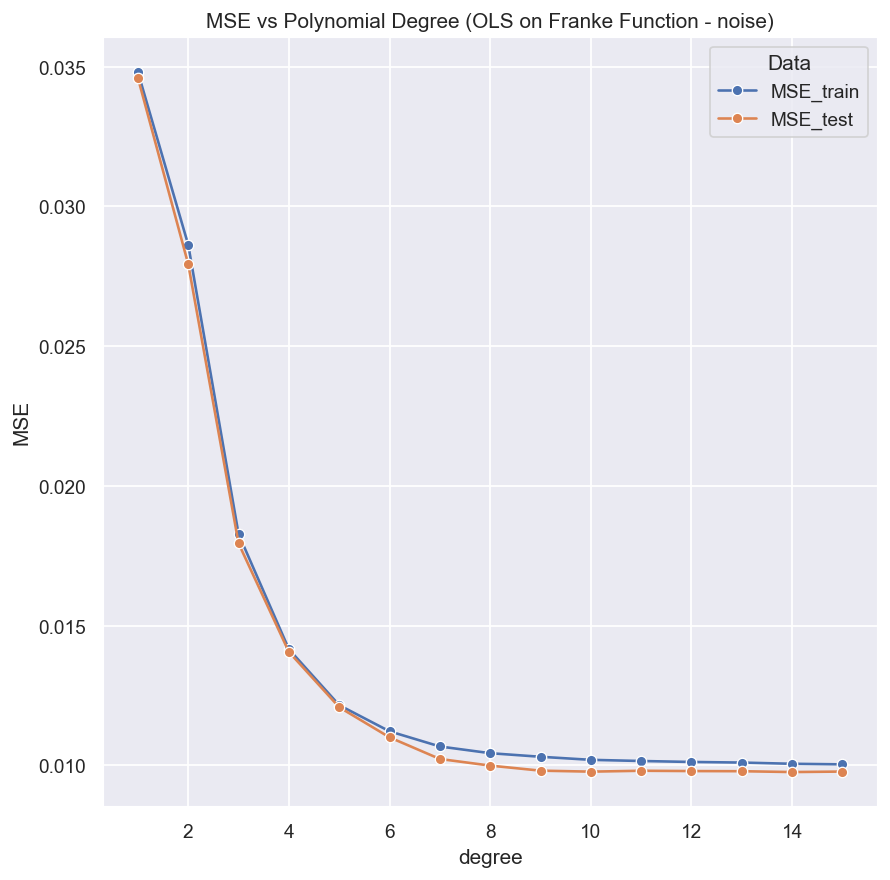

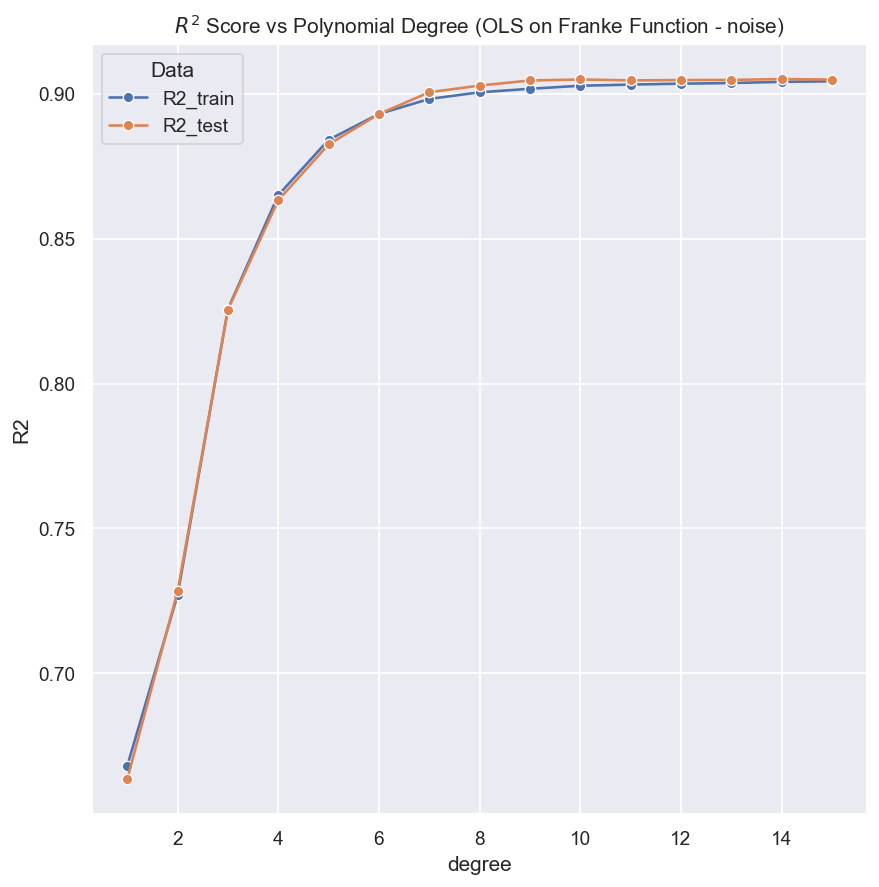

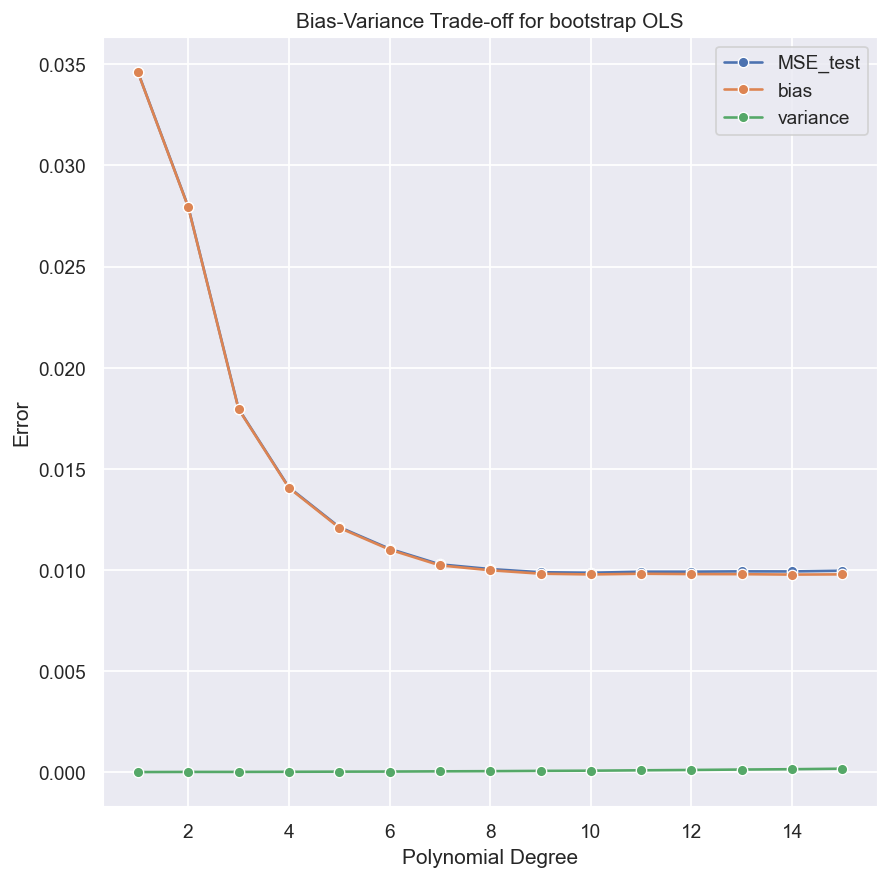

In [706]:
x, y, z = franke_func_data(add_noise=True)
results_df = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="OLS",
    scaling=False
)

plot_scores(results_df, reg_method="OLS", title_string="(OLS on Franke Function - noise)", fig_name="part_e_tt")

results_df_bootstrap = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="OLS",
    resampling_method="bootstrap",
    scaling=False
)

df = results_df_bootstrap.copy()
df = df[df["bias"].notnull()]
df_melt = df.melt(id_vars=["degree"], value_vars=["MSE_test", "bias", "variance"], var_name="Error Type", value_name="Error")

plt.figure(figsize=(8, 8), dpi=125)
sns.lineplot(data=df_melt, x="degree", y="Error", hue="Error Type", marker="o")
plt.xlabel("Polynomial Degree")
plt.ylabel("Error")
plt.title("Bias-Variance Trade-off for bootstrap OLS")
plt.legend()
plt.savefig("results/part_e_boot")
plt.show()

##### Part f): Cross-validation as resampling techniques, adding more complexity.

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.448e+00, tolerance: 2.369e-01
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.869e+00, tolerance: 2.394e-01
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.542e+00, toleranc

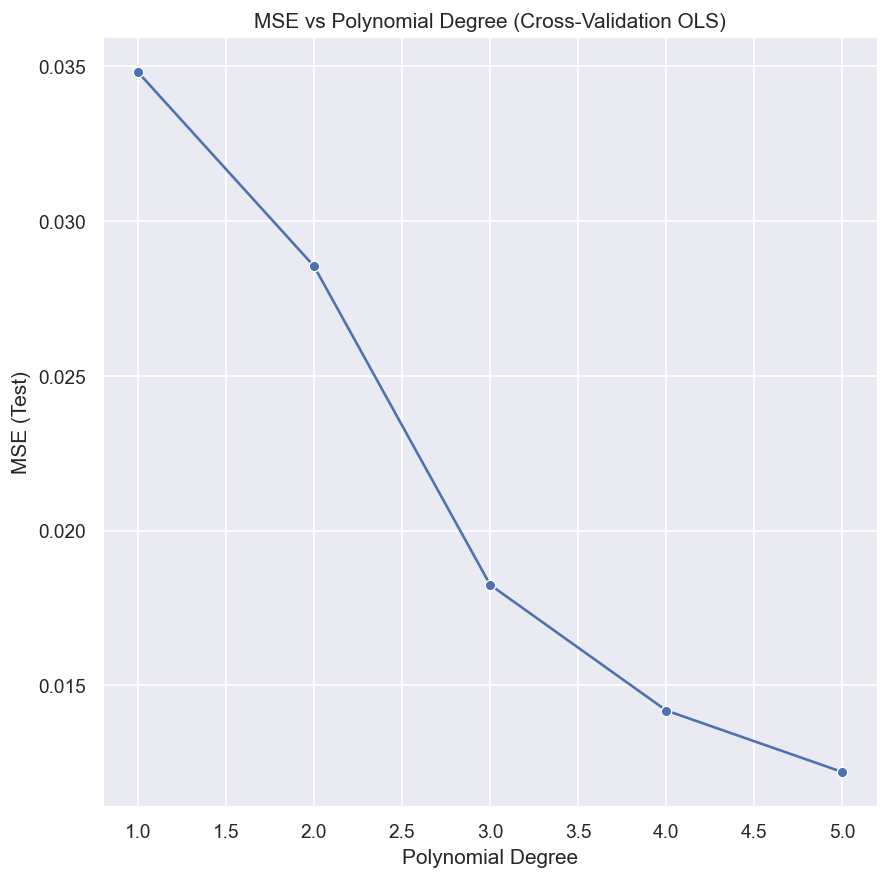

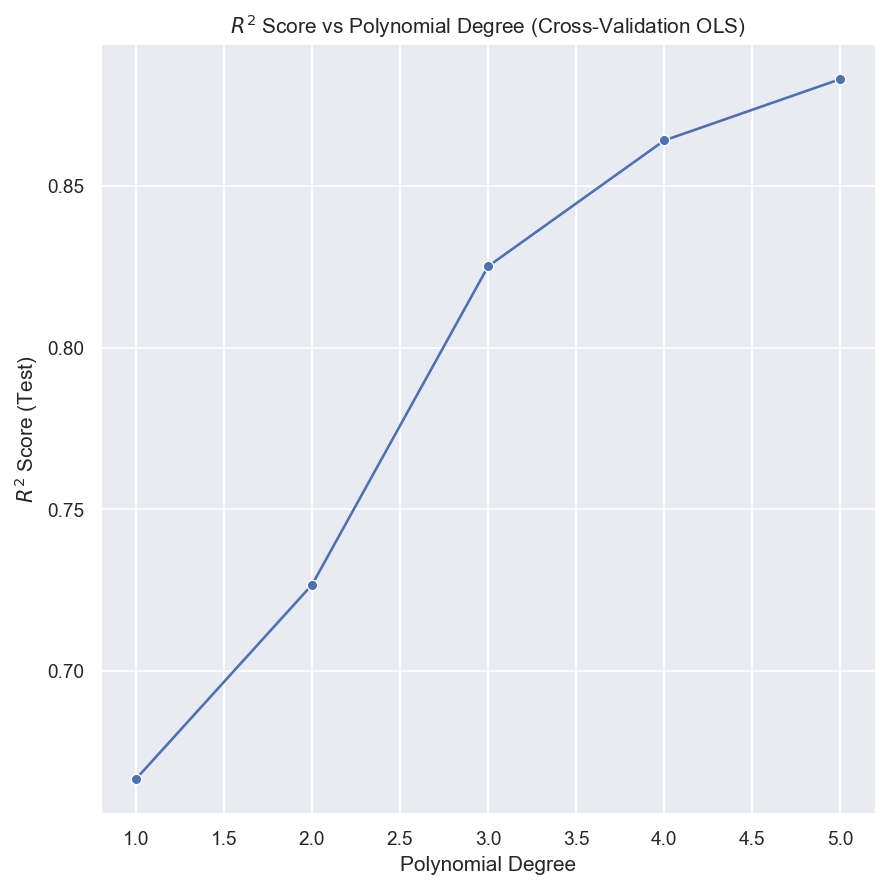

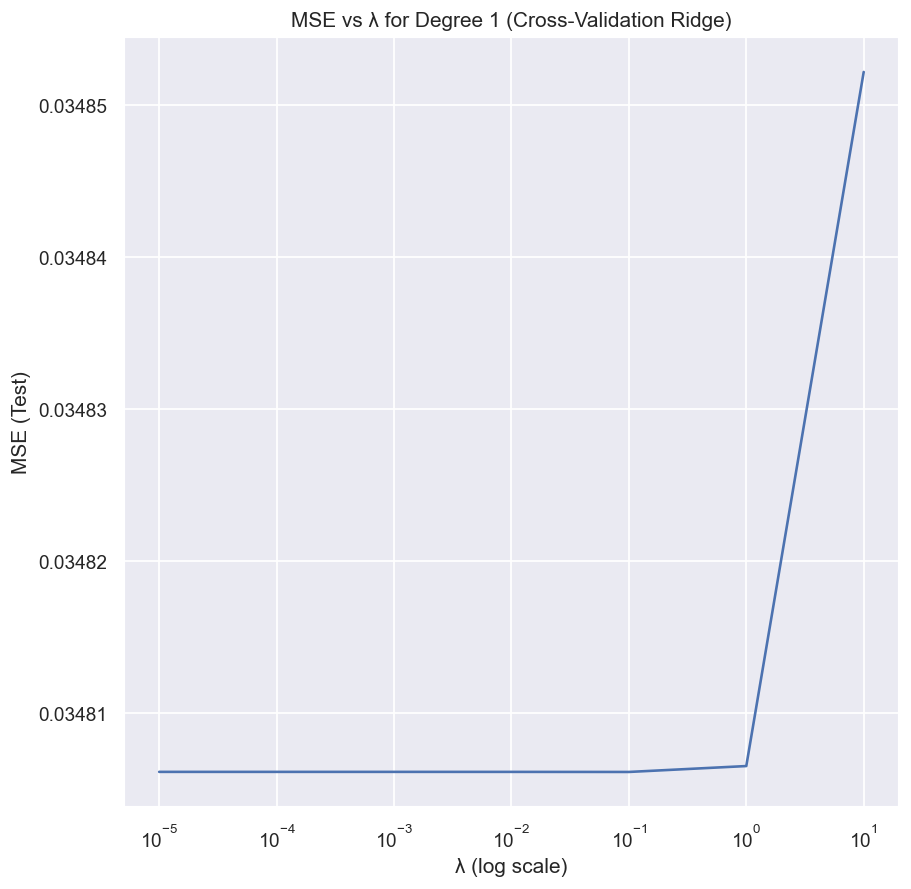

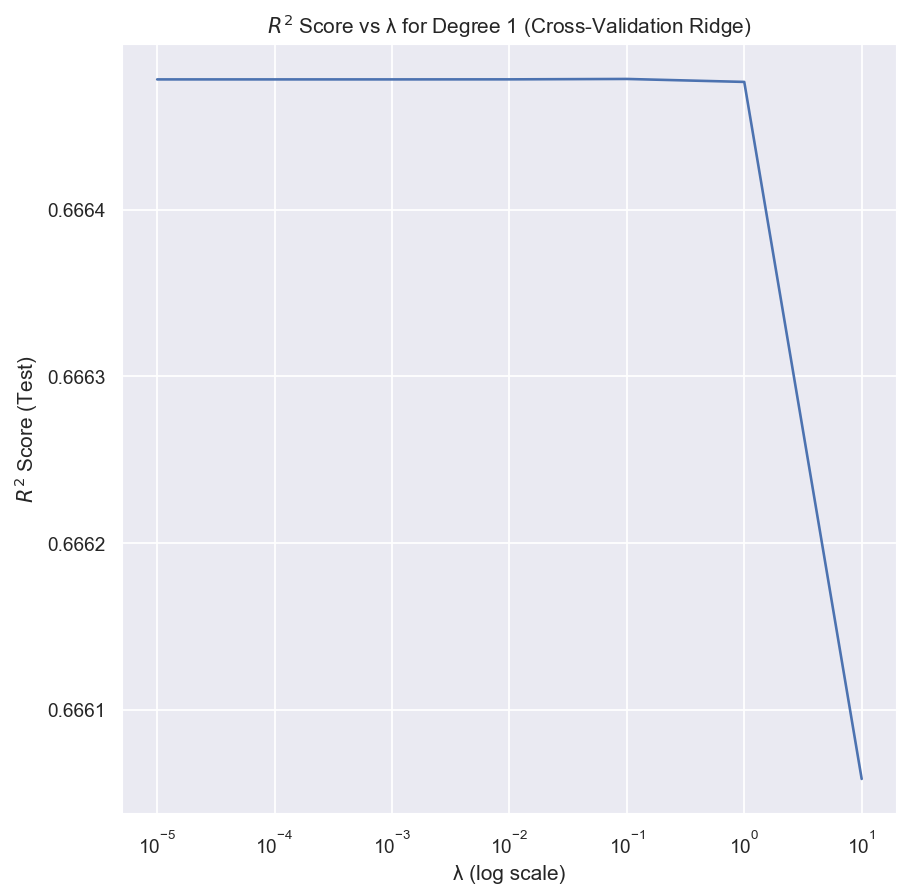

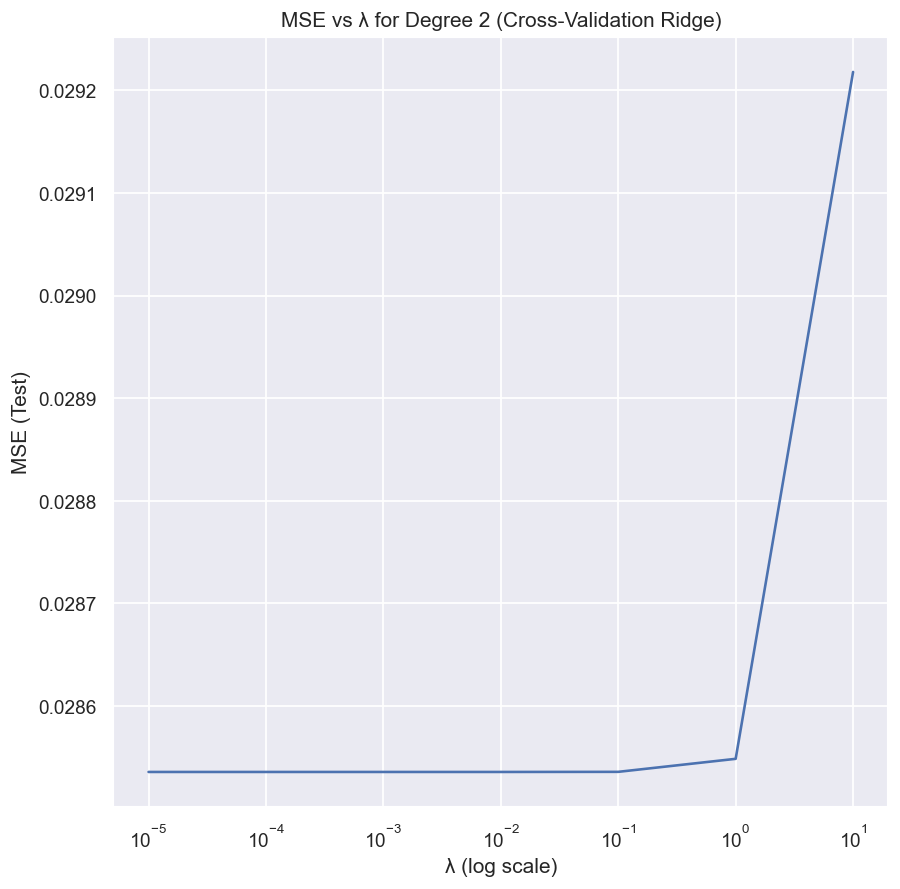

...

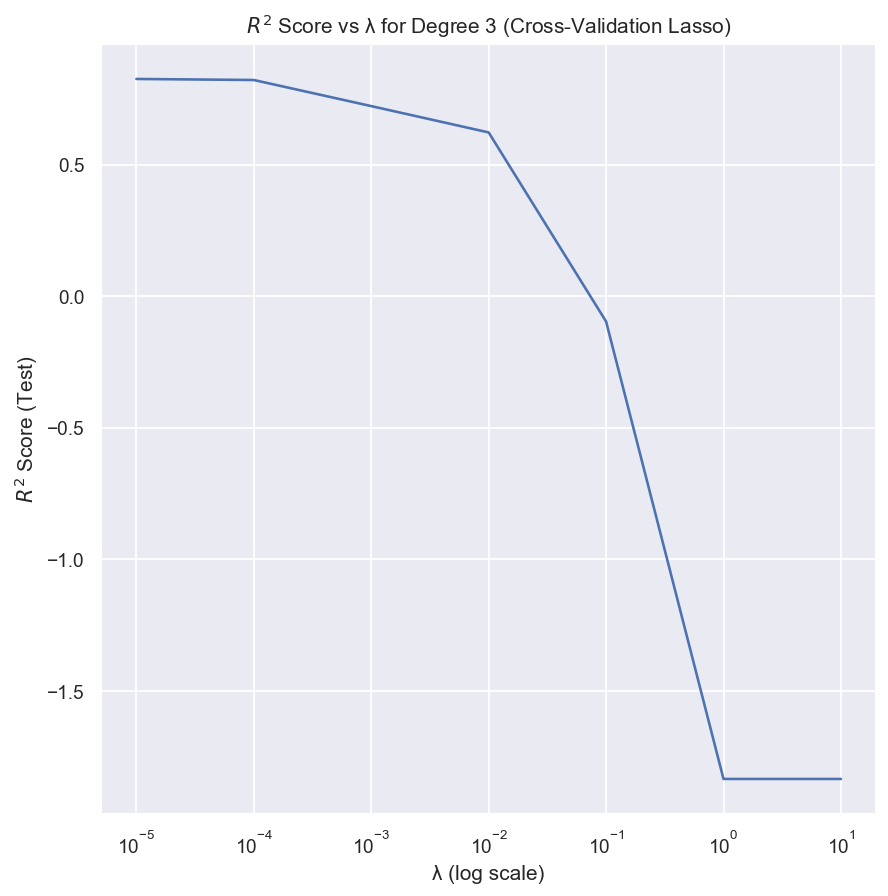

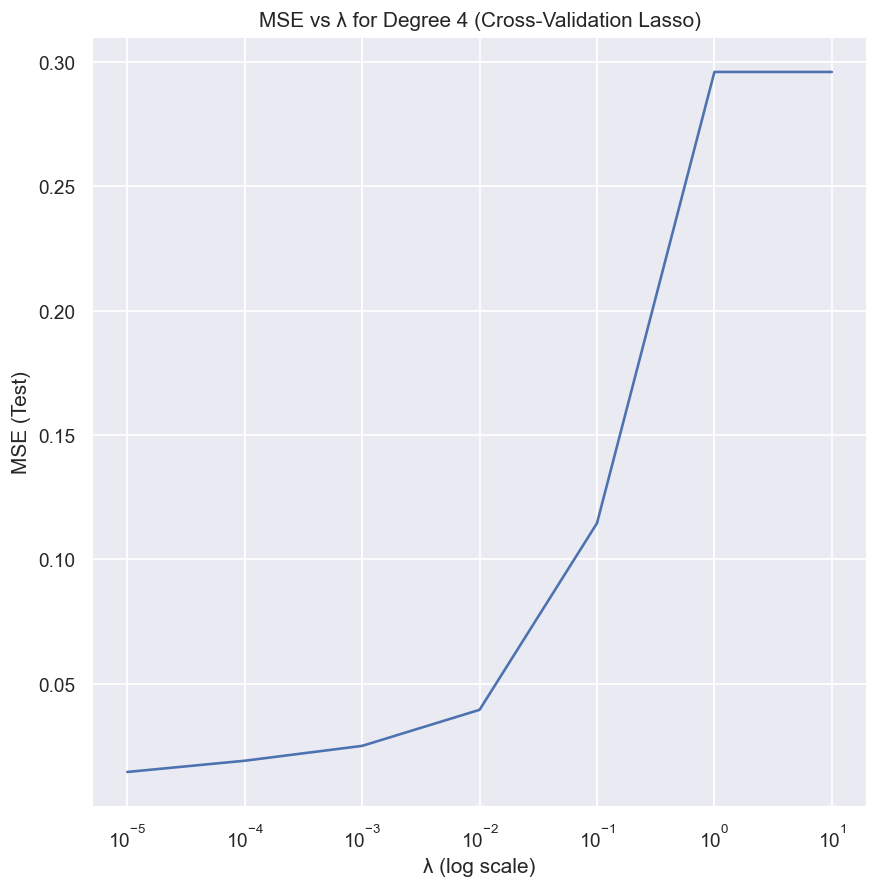

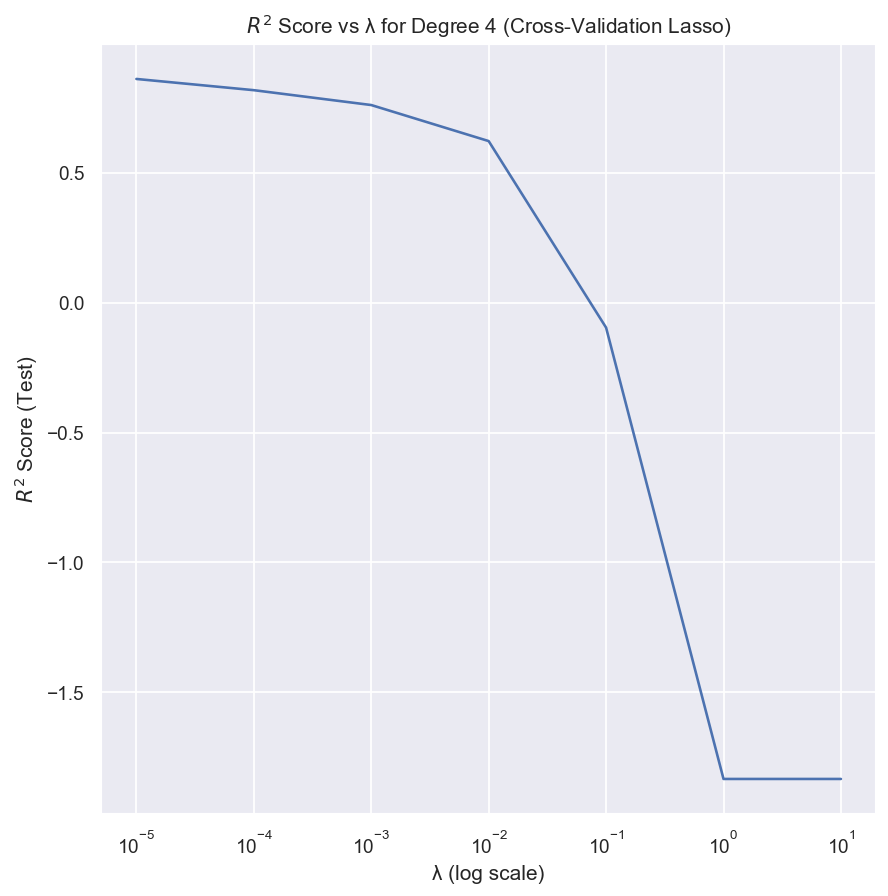

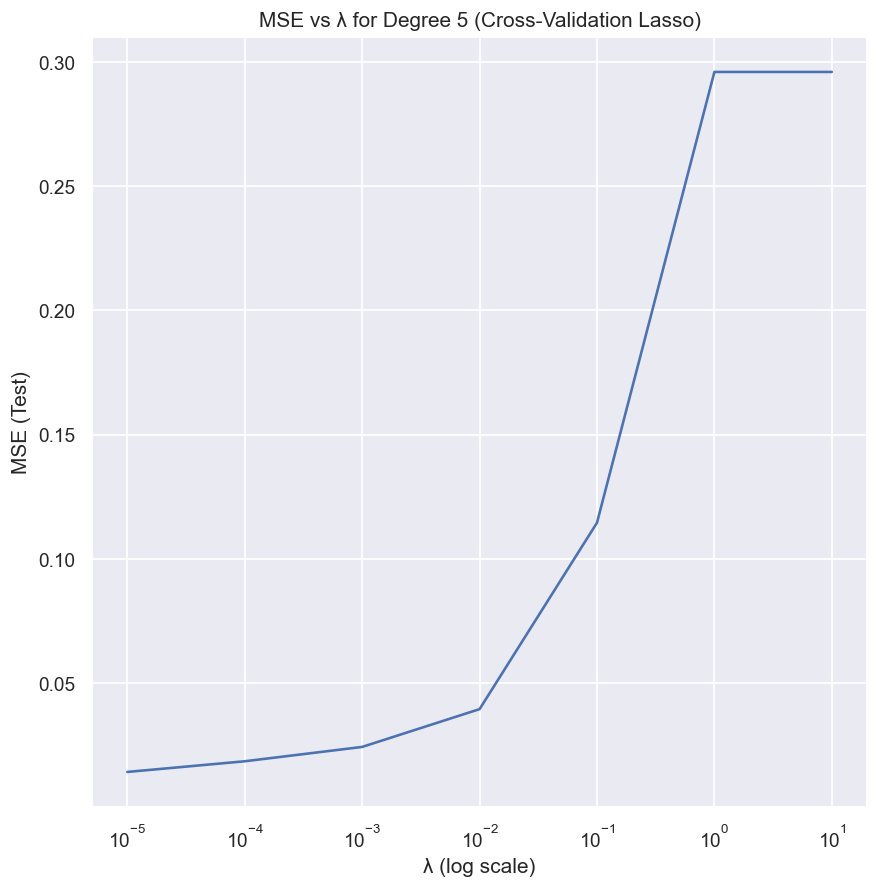

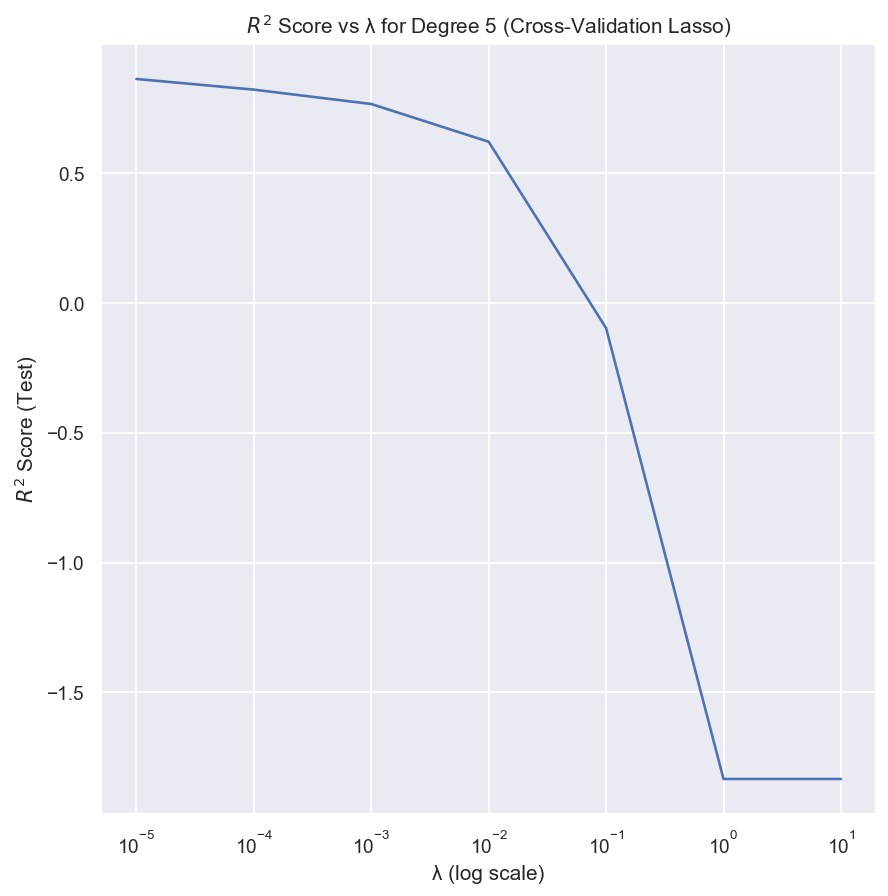

In [708]:
x, y, z = franke_func_data(add_noise=True)
degrees = range(1, 6)
lambdas = np.logspace(-5, 1, 7)

results_df_cv_ols = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
    resampling_method="cross-validation",
    scaling=False
)

results_df_cv_ridge = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Ridge",
    lambdas=lambdas,
    resampling_method="cross-validation",
    scaling=False
)

results_df_cv_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
    resampling_method="cross-validation",
    scaling=False
)

plot_scores(results_df_cv_ols, reg_method="OLS", title_string="(Cross-Validation OLS)", fig_name="part_f_OLS")
plot_scores(results_df_cv_ridge, reg_method="Ridge", title_string="(Cross-Validation Ridge)", fig_name="part_f_ridge")
plot_scores(results_df_cv_lasso, reg_method="Lasso", title_string="(Cross-Validation Lasso)",fig_name="part_f_lasso")

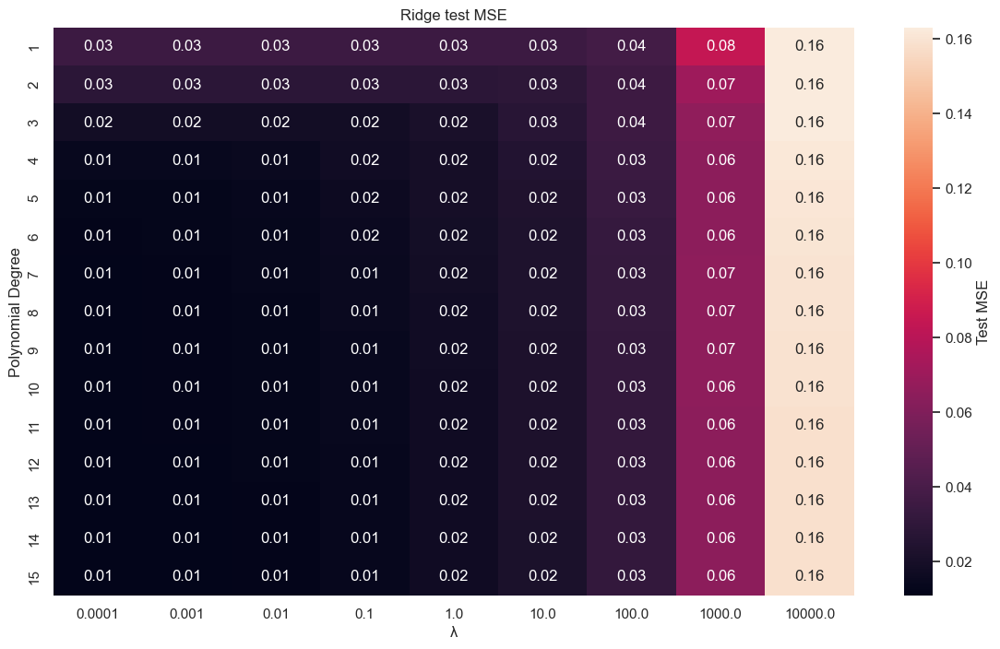

In [710]:
# heatmap for cv ridge test
# should probably have done this with fold rather than poly. deg. again but too late.
x, y, z = franke_func_data(add_noise=True)
lambdas = np.logspace(-4, 4, 9)

results_df_cv_ridge = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Ridge",
    lambdas=lambdas,
    resampling_method="cross-validation",
    scaling=False
)

mse_test_pivot = results_df_cv_ridge.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Ridge test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")
plt.savefig("results/ridge_cv_heatmap.png")
plt.show()


In [ ]:
#heatmap for cv lasso - running too long, can't fix in time
#x, y, z = franke_func_data(add_noise=True)
#lambdas = np.logspace(-5, 1, 7)

#results_df_lasso = regression(
#    x,
#    y,
#    z,
#    degrees=range(1,16),
#    reg_method="Lasso",
#    lambdas=lambdas,
#    resampling_method="cross-validation",
#    scaling=False

#)

#mse_test_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_test")

#plt.figure(figsize=(14,8))
#sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
#plt.title("Lasso test MSE")
#plt.xlabel("λ")
#plt.ylabel("Polynomial Degree")
#plt.savefig("results/lasso_cv_heatmap.png")
#plt.show()

##### Part g): Analysis of real data.

C:\Users\aleks\AppData\Local\Temp\ipykernel_2636\1448681481.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  terrain = imread("SRTM_data_Norway_1.tif")


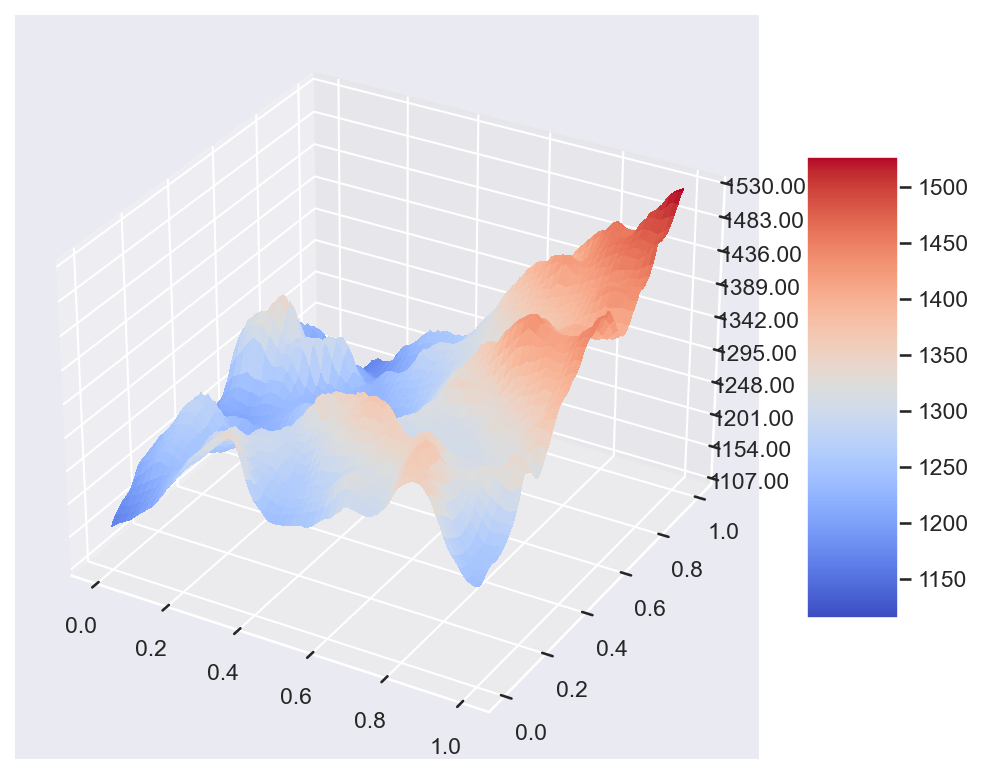

In [664]:
terrain = imread("SRTM_data_Norway_1.tif")
#setting up a sample we can work with
n = 100
z = terrain[:n, :n]
n_rows, n_cols = np.shape(z)

x = np.linspace(0, 1, n_rows)
y = np.linspace(0, 1, n_cols)
x, y = np.meshgrid(x, y)

fig = plt.figure(figsize=(8, 8), dpi=150)
ax = fig.add_subplot(projection='3d')

# Plot the surface.
surf = ax.plot_surface(x, y, z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(np.min(z), np.max(z))
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig("results/g_real_terrain.png")
plt.show()

x = x.flatten()
y = y.flatten()
z = z.flatten()

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.908e+06, tolerance: 1.350e+06
  model = cd_fast.enet_coordinate_descent(


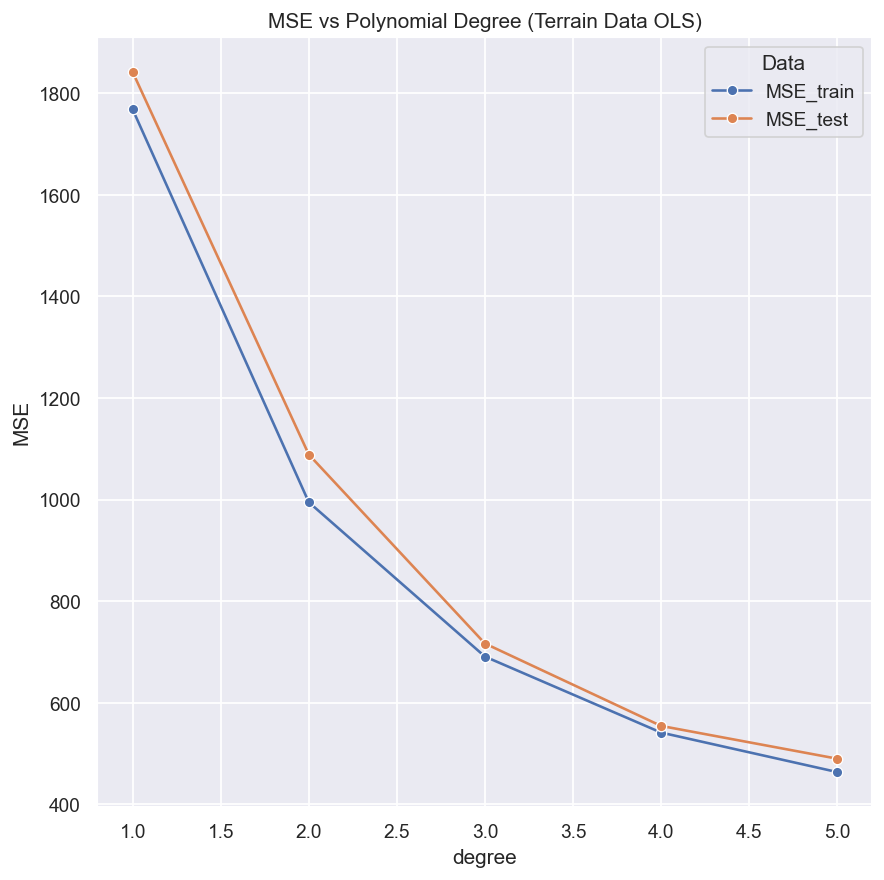

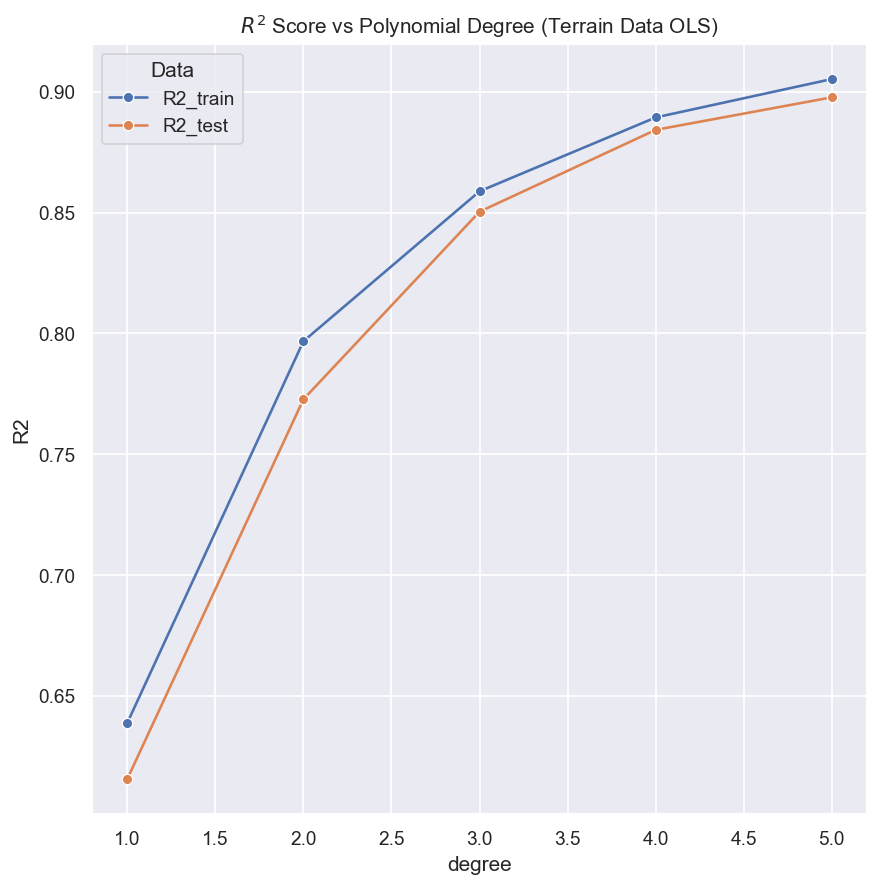

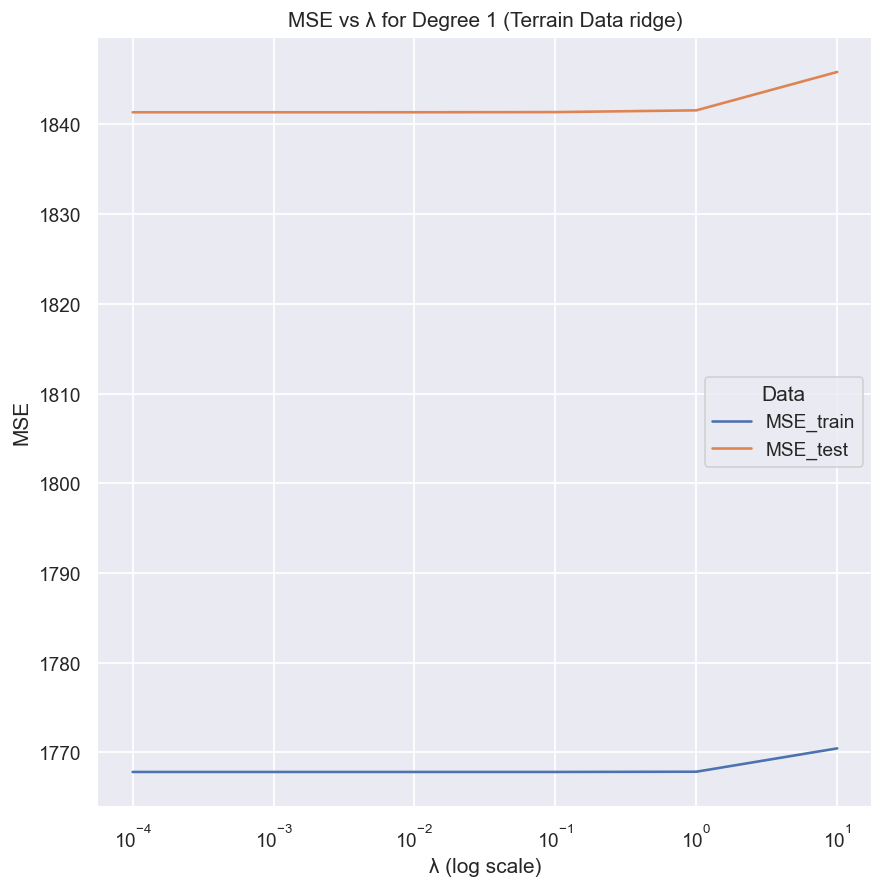

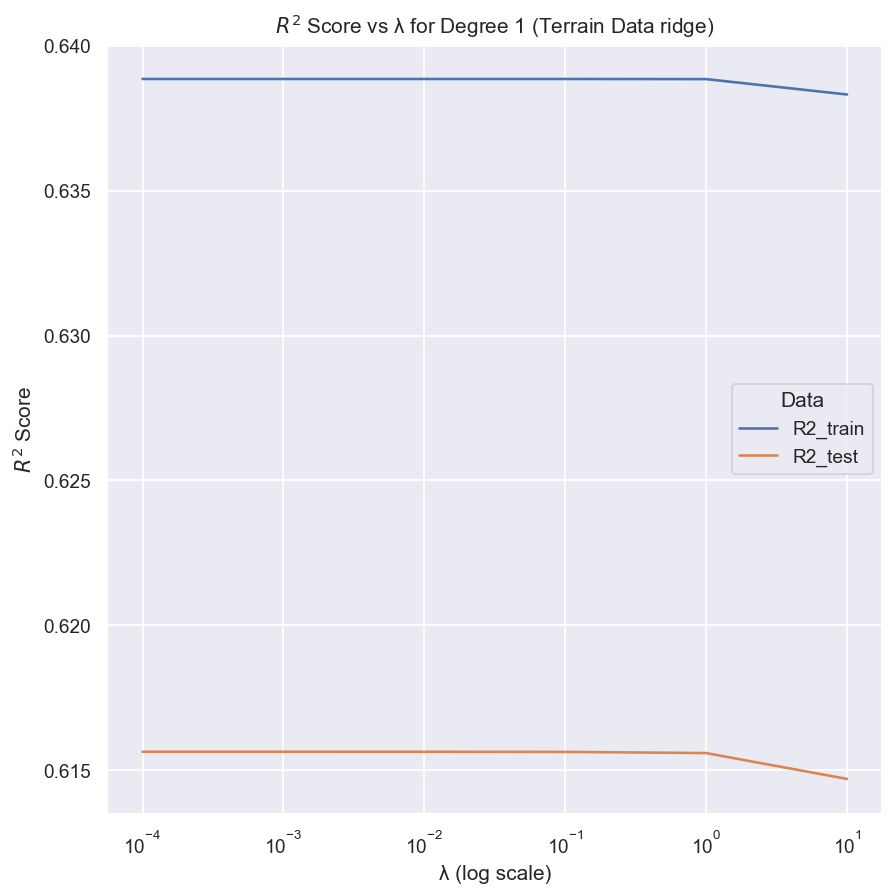

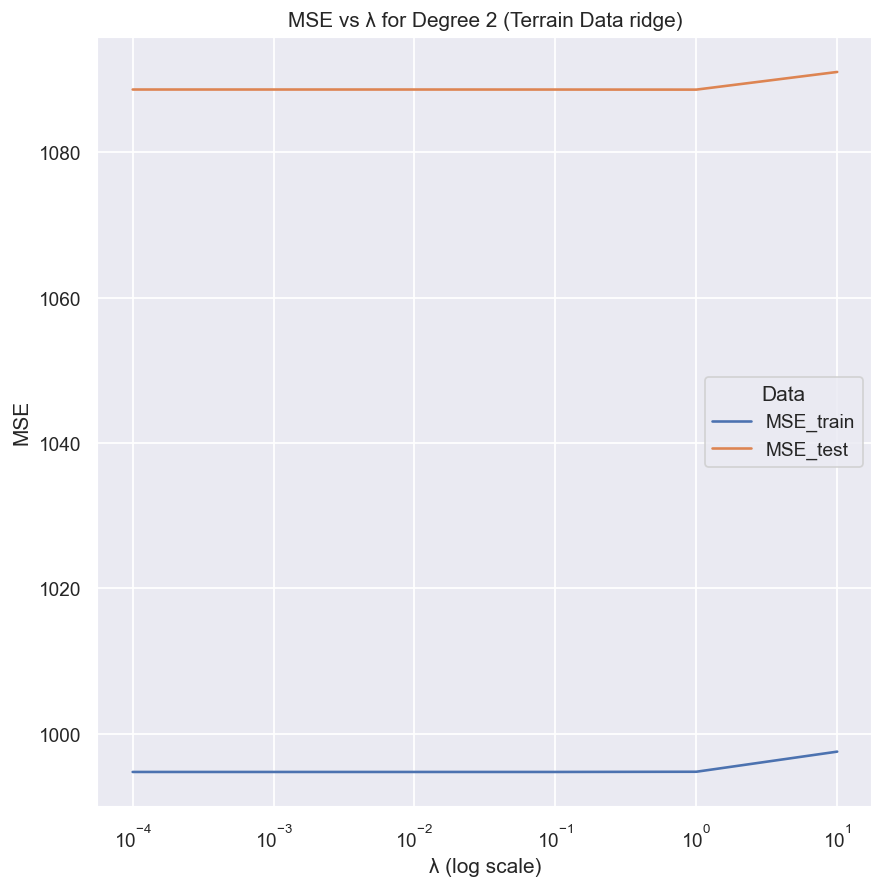

...

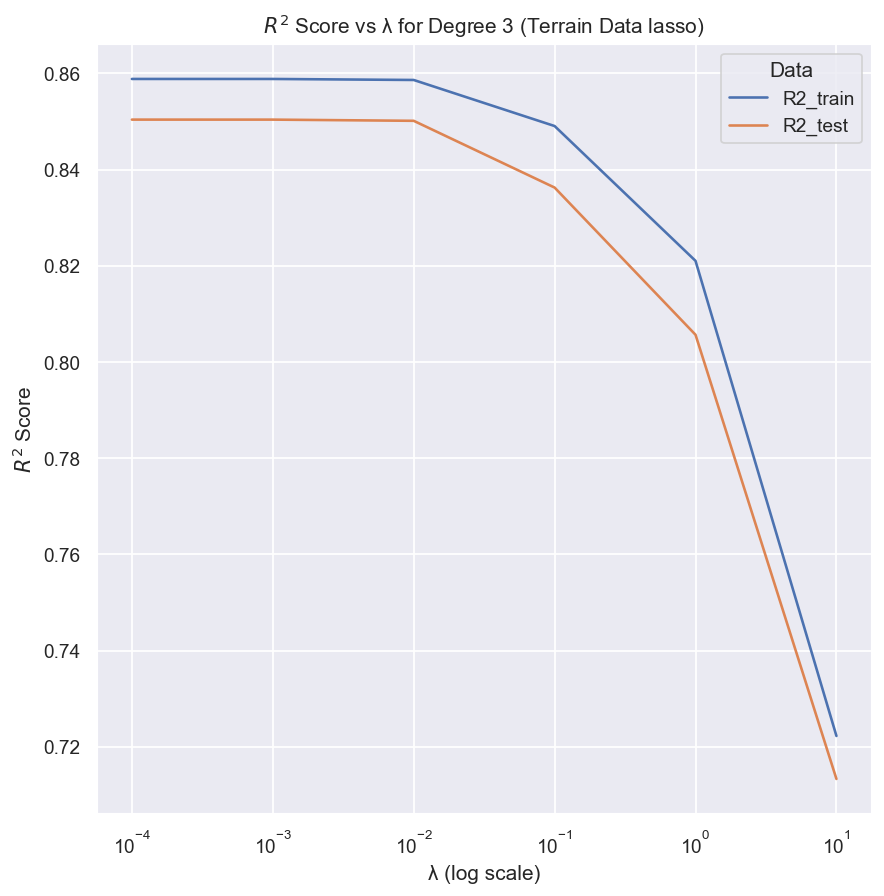

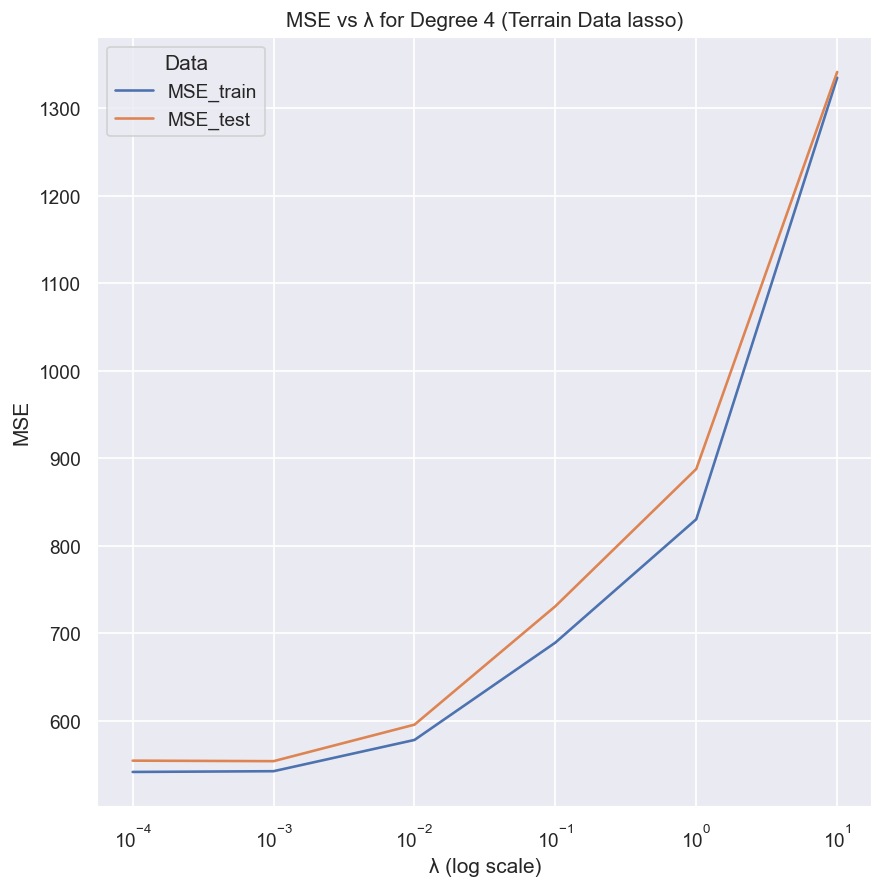

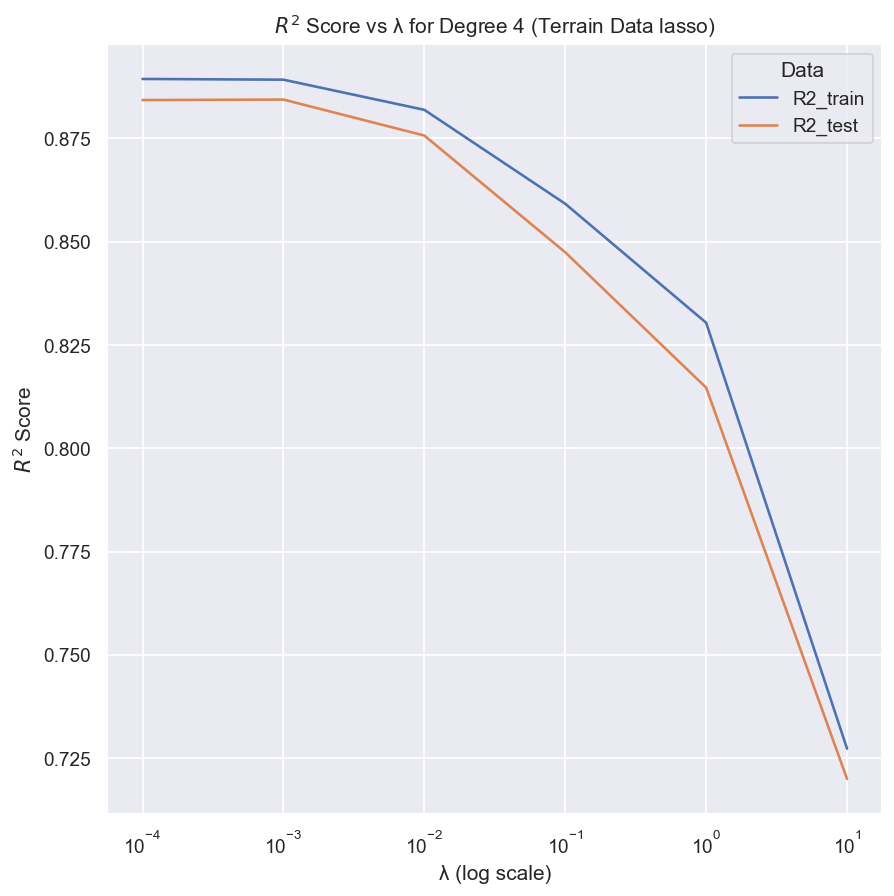

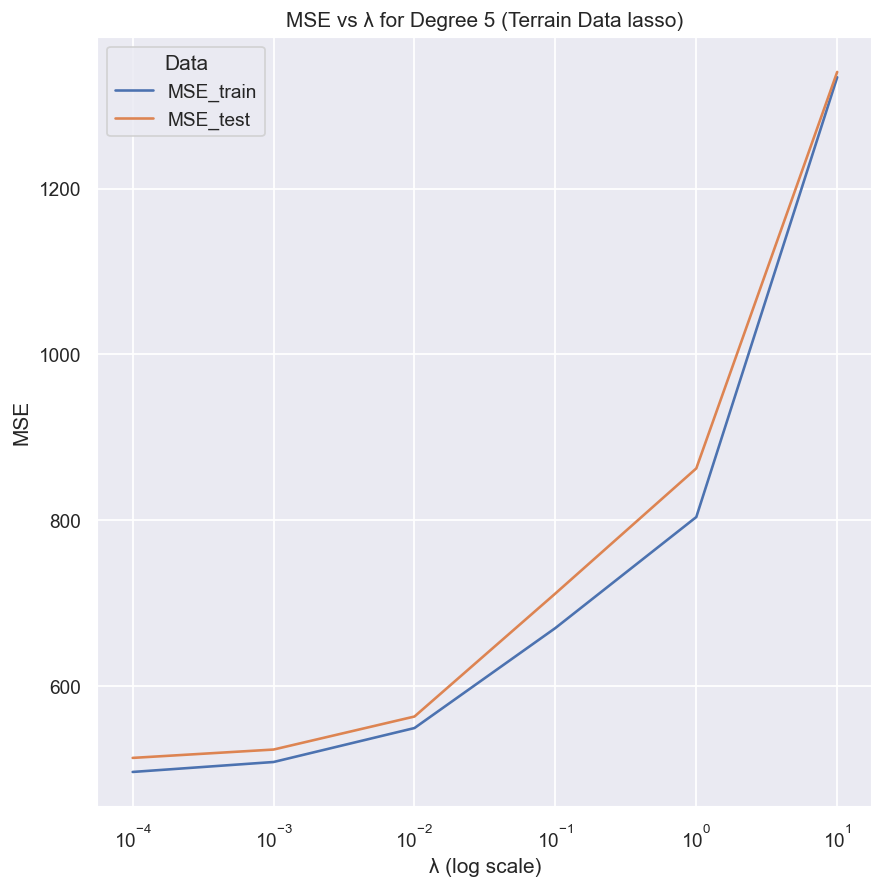

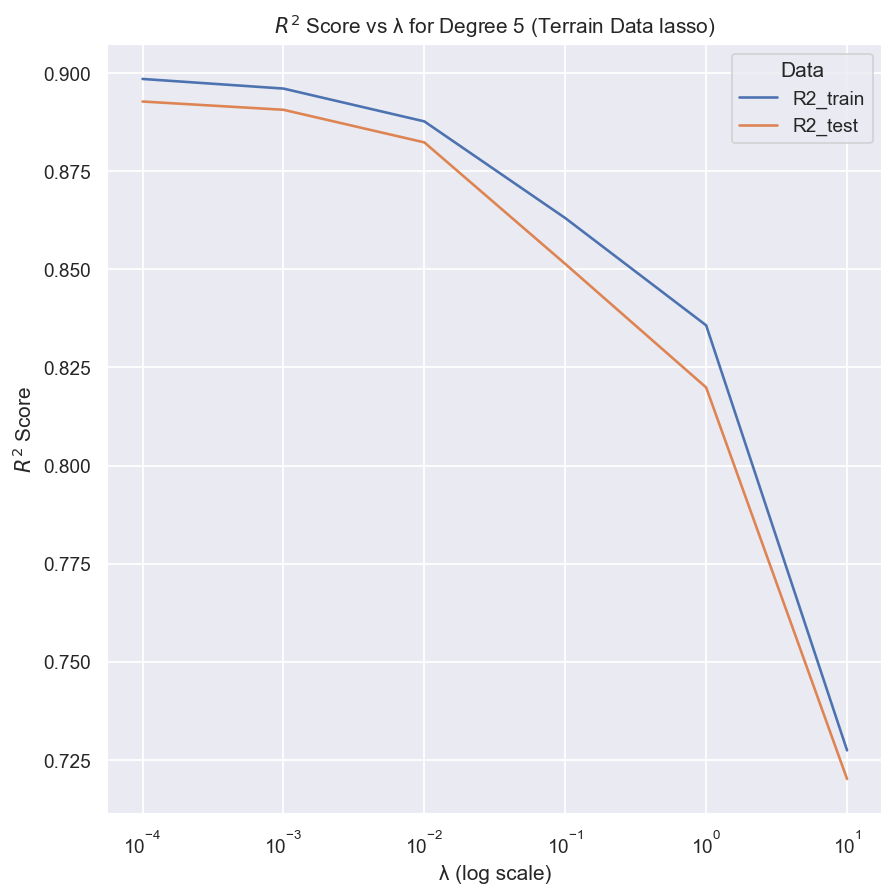

In [668]:
#task a-c for real
degrees = range(1, 6)
lambdas = np.logspace(-4, 1, 6)

results_df_real_ols = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
)

results_df_real_ridge = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Ridge",
    lambdas=lambdas,
)

results_df_real_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
)

plot_scores(results_df_real_ols, reg_method="OLS", title_string="(Terrain Data OLS)", fig_name="real_ols")
plot_scores(results_df_real_ridge, reg_method="Ridge", title_string="(Terrain Data ridge)", fig_name="real_ridge")
plot_scores(results_df_real_lasso, reg_method="Lasso", title_string="(Terrain Data lasso)", fig_name="real_lasso")


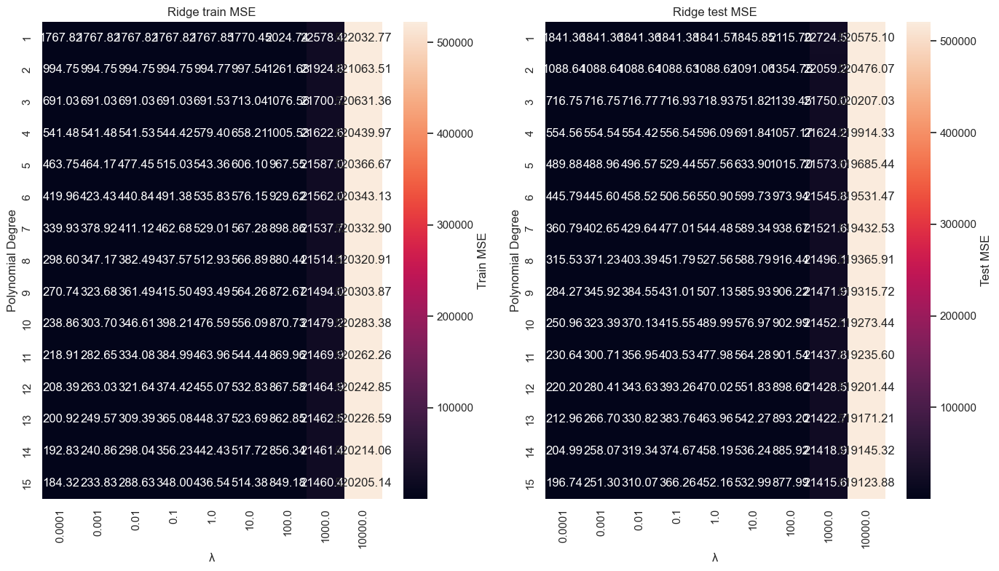

In [672]:
#real heatmaps for ridge - don't have time to fix this sadly
lambdas = np.logspace(-4, 4, 9)

results_df_ridge = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Ridge",
    lambdas=lambdas
)
mse_train_pivot = results_df_ridge.pivot(index="degree", columns="lambda", values="MSE_train")
mse_test_pivot = results_df_ridge.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
sns.heatmap(mse_train_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Train MSE"})
plt.title("Ridge train MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.subplot(1, 2, 2)
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Ridge test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")

plt.tight_layout()
plt.savefig("results/ridge_real_heatmap.png")
plt.show()


In [ ]:
#real heatmaps for lasso - had to be interrupted after a lot of minutes, don't have time to fix sadly
#lambdas = np.logspace(-5, 1, 7)

#results_df_lasso = regression(
#    x,
#    y,
#    z,
#    degrees=range(1,16),
#    reg_method="Lasso",
#    lambdas=lambdas,
#)

#mse_train_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_train")
#mse_test_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_test")

#plt.figure(figsize=(14,8))

#plt.subplot(1, 2, 1)
#sns.heatmap(mse_train_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Train MSE"})
#plt.title("Lasso train MSE")
#plt.xlabel("λ")
#plt.ylabel("Polynomial Degree")

#plt.subplot(1, 2, 2)
#sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
#plt.title("Lasso test MSE")
#plt.xlabel("λ")
#plt.ylabel("Polynomial Degree")

#plt.tight_layout()
#plt.savefig("results/lasso_real_heatmap.png")
#plt.show()

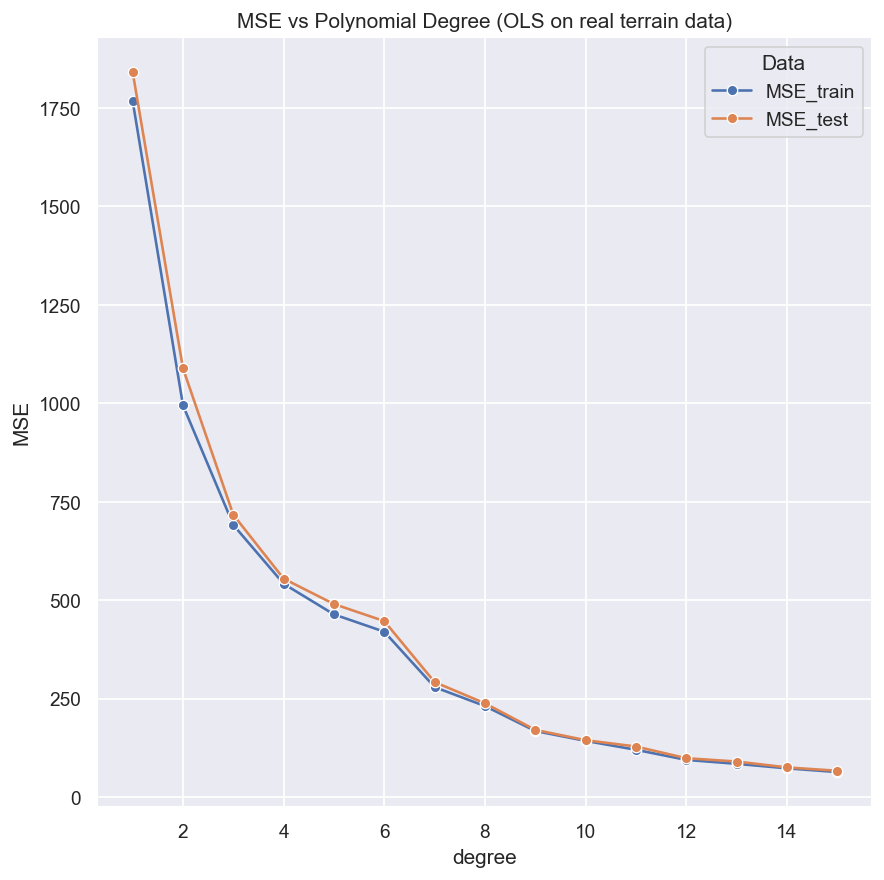

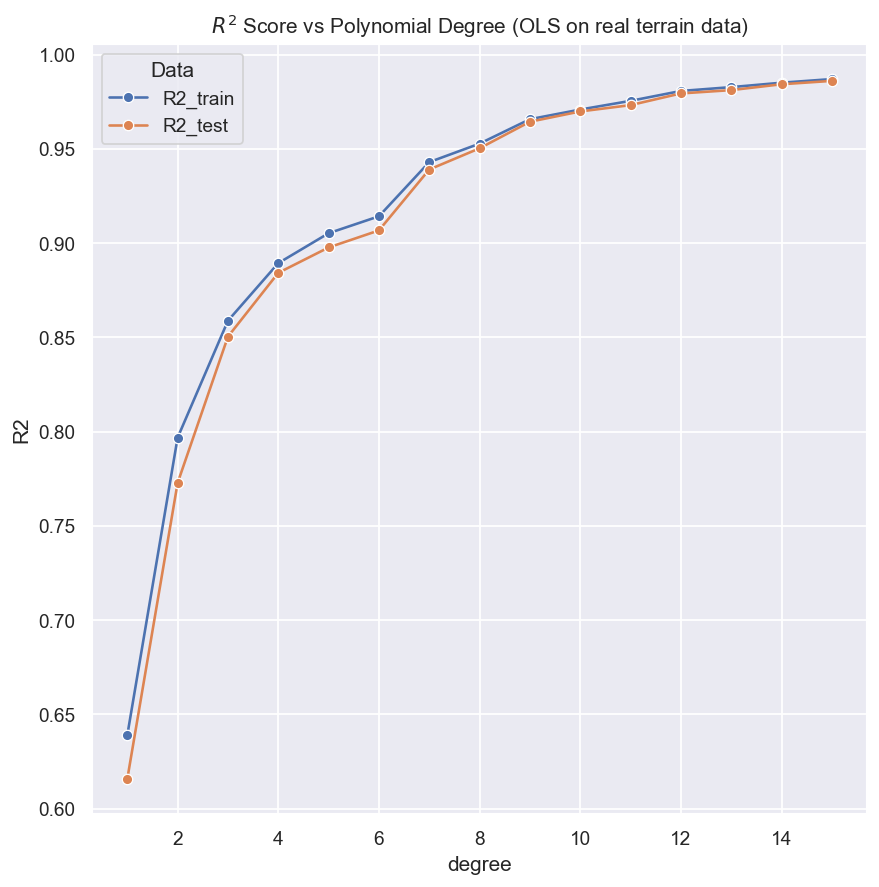

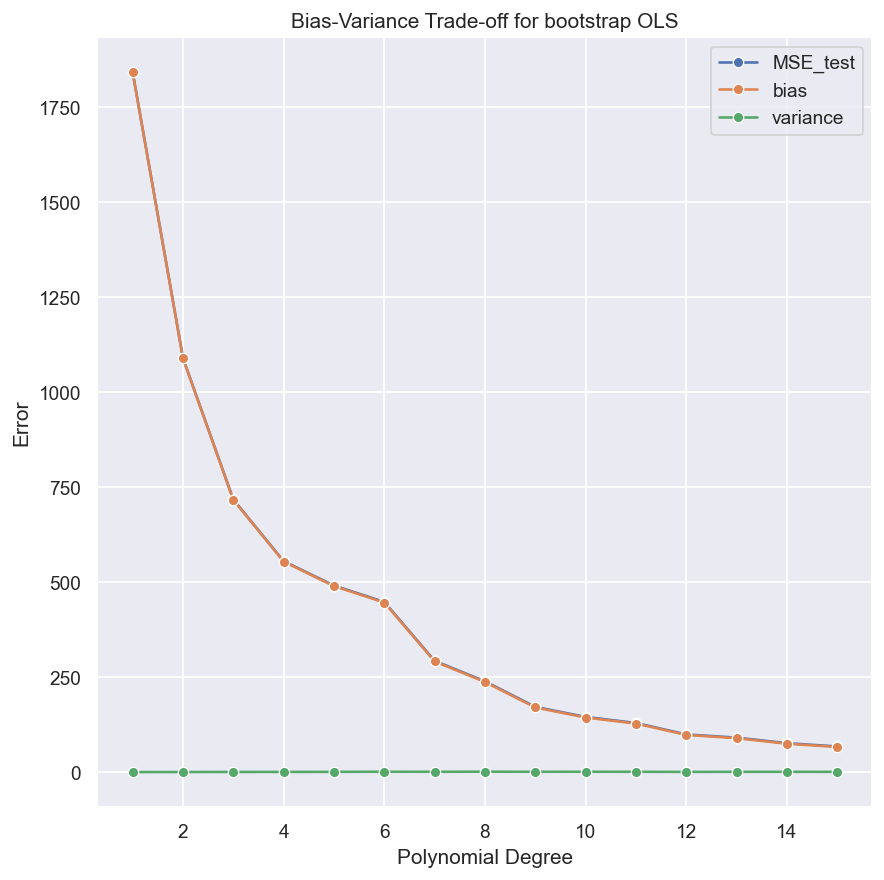

In [680]:
#task e for real data
results_df = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="OLS",
)

plot_scores(results_df, reg_method="OLS", title_string="(OLS on real terrain data)", fig_name="part_e_real_tt")

results_df_bootstrap = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="OLS",
    resampling_method="bootstrap",
)

df = results_df_bootstrap.copy()
df = df[df["bias"].notnull()]
df_melt = df.melt(id_vars=["degree"], value_vars=["MSE_test", "bias", "variance"], var_name="Error Type", value_name="Error")

plt.figure(figsize=(8, 8), dpi=125)
sns.lineplot(data=df_melt, x="degree", y="Error", hue="Error Type", marker="o")
plt.xlabel("Polynomial Degree")
plt.ylabel("Error")
plt.title("Bias-Variance Trade-off for bootstrap OLS")
plt.legend()
plt.savefig("results/part_e_real_boot")
plt.show()

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.908e+06, tolerance: 1.350e+06
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.909e+06, tolerance: 1.350e+06
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.897e+06, toleranc

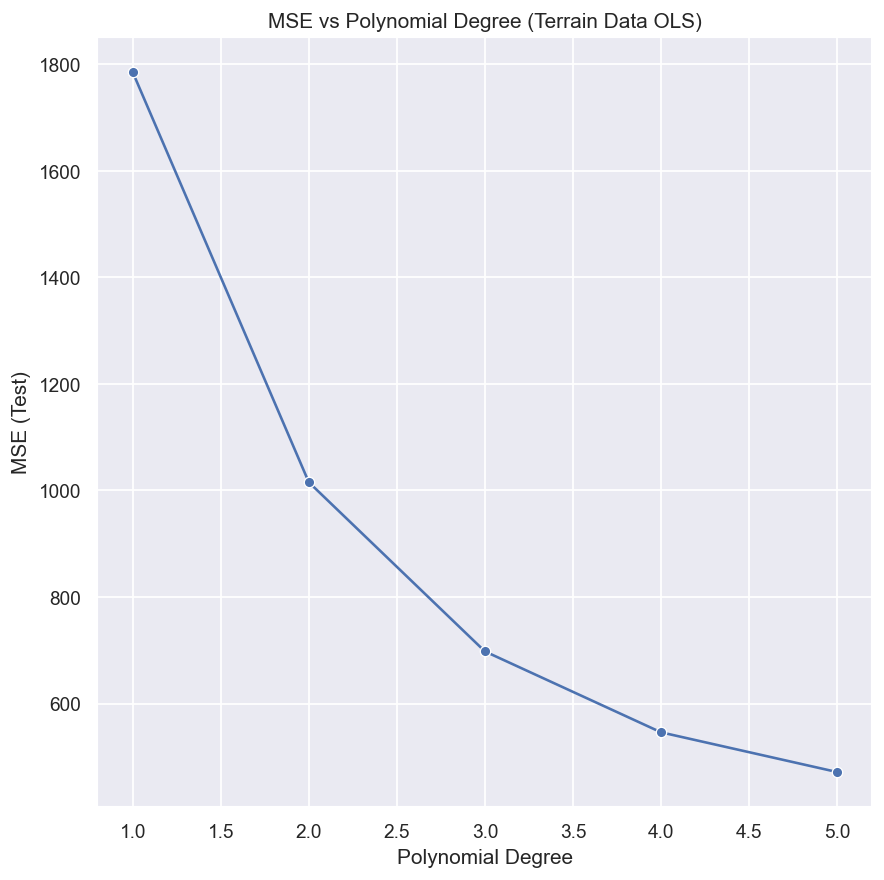

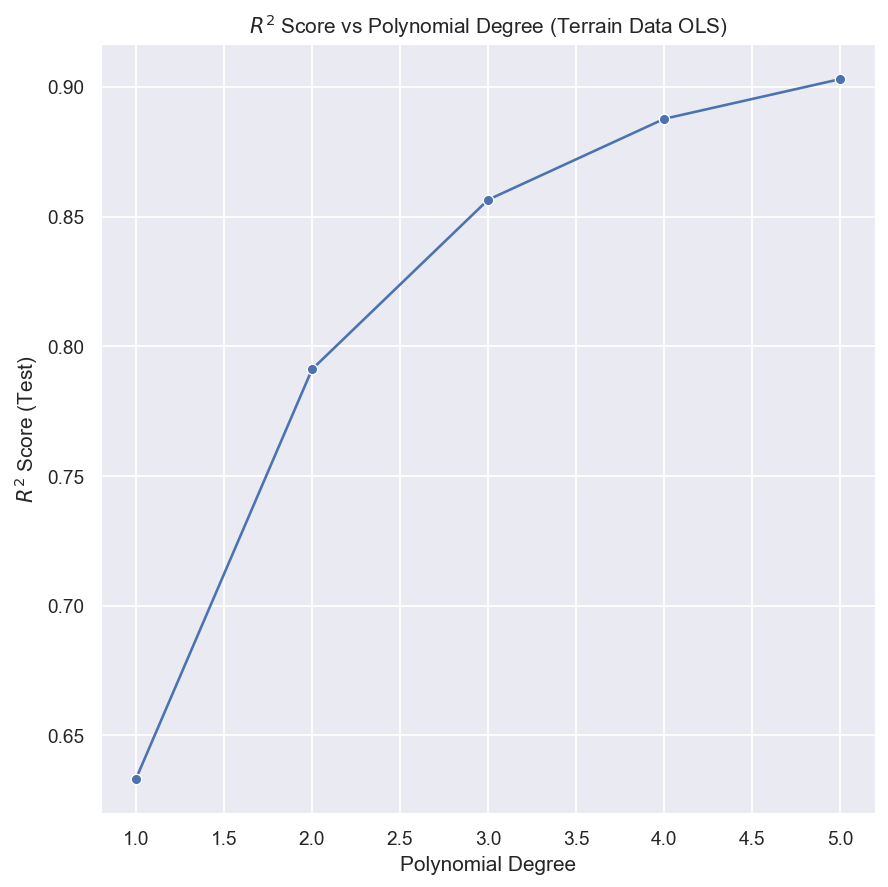

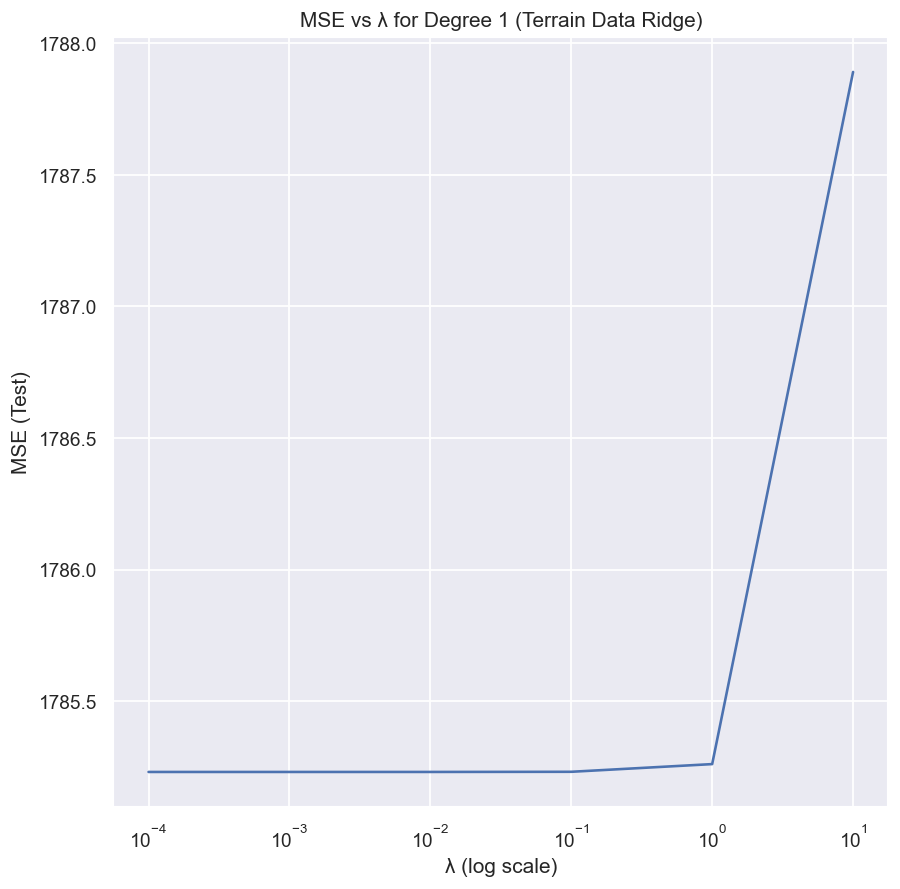

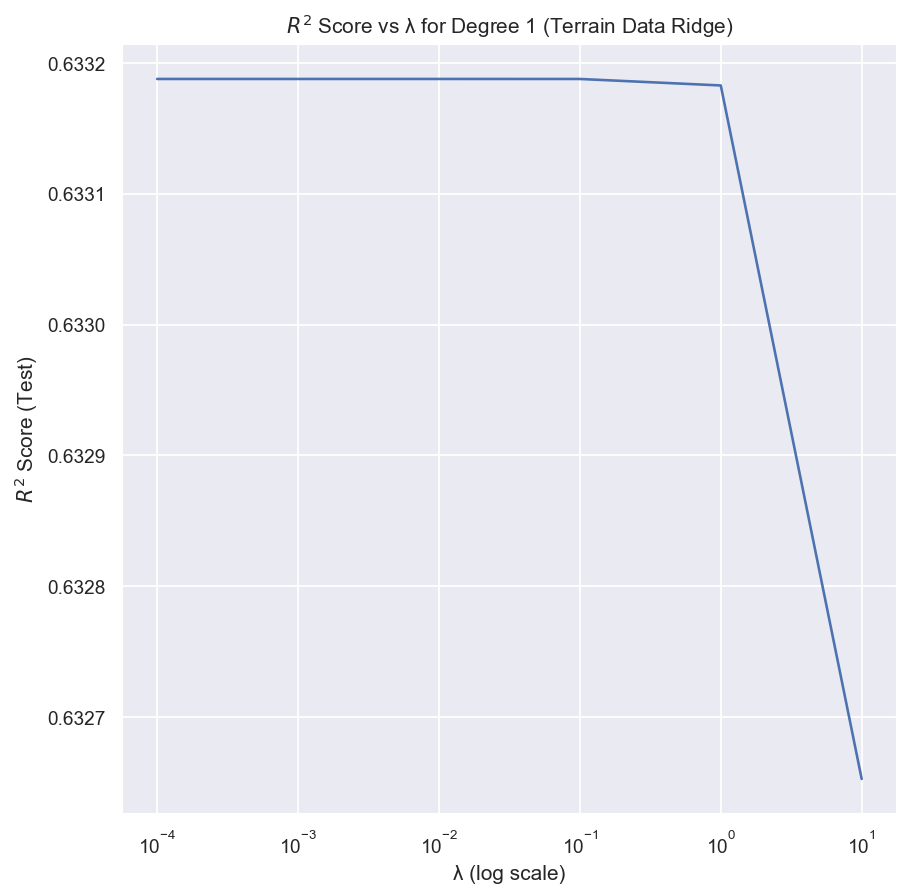

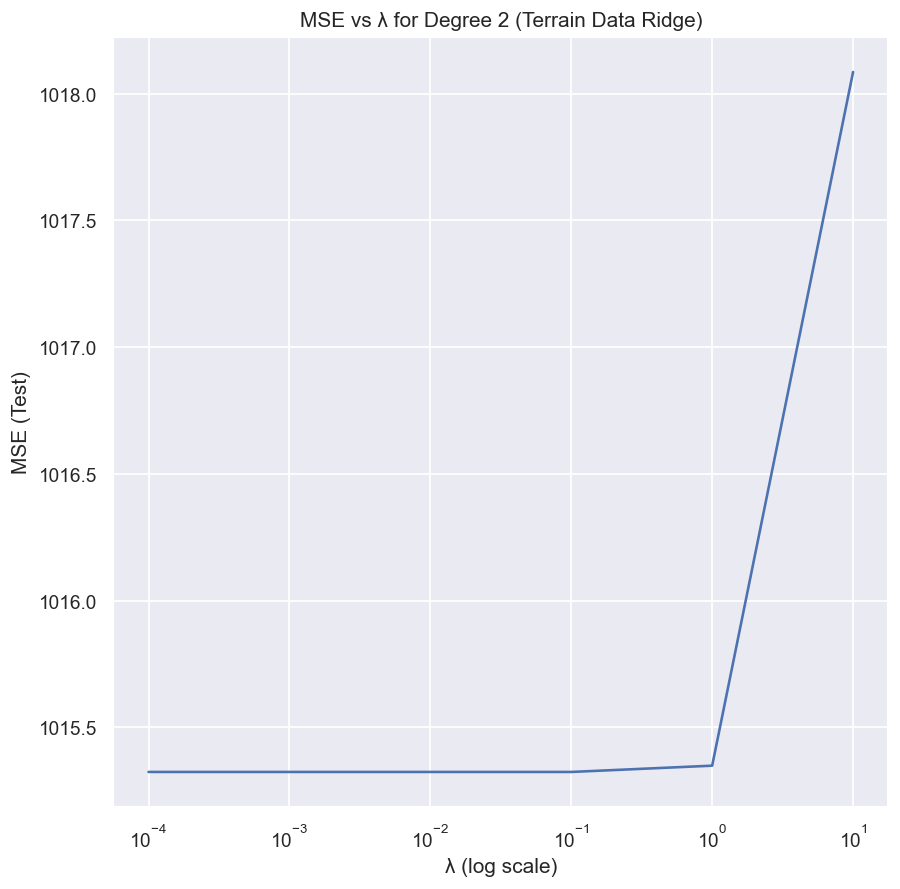

...

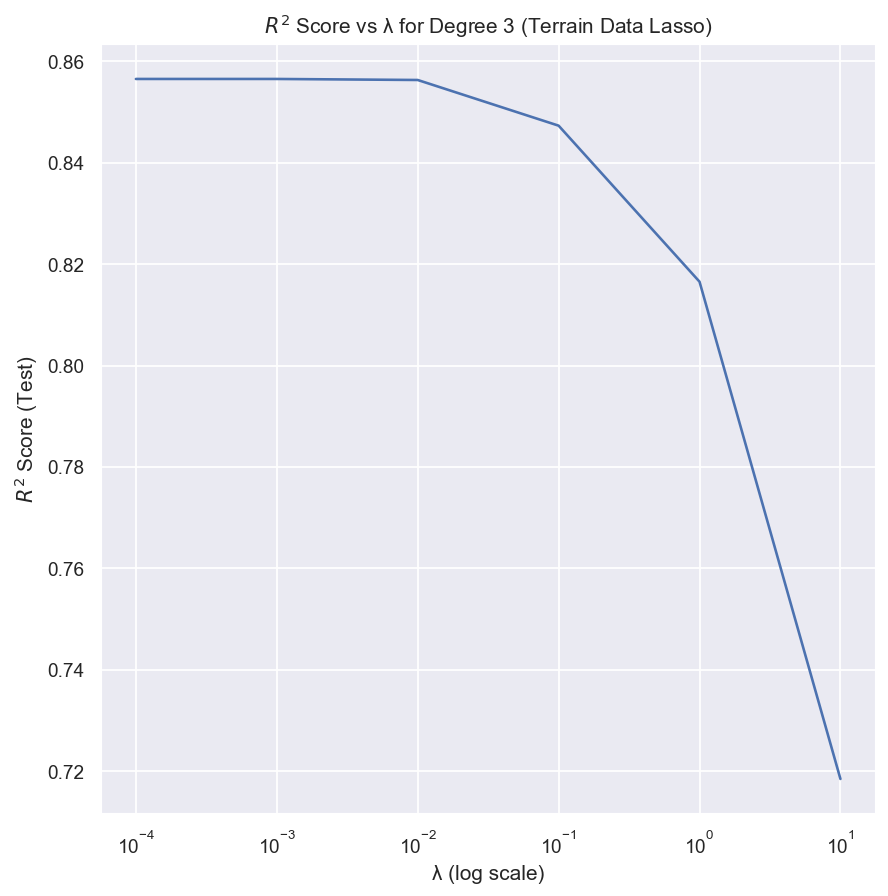

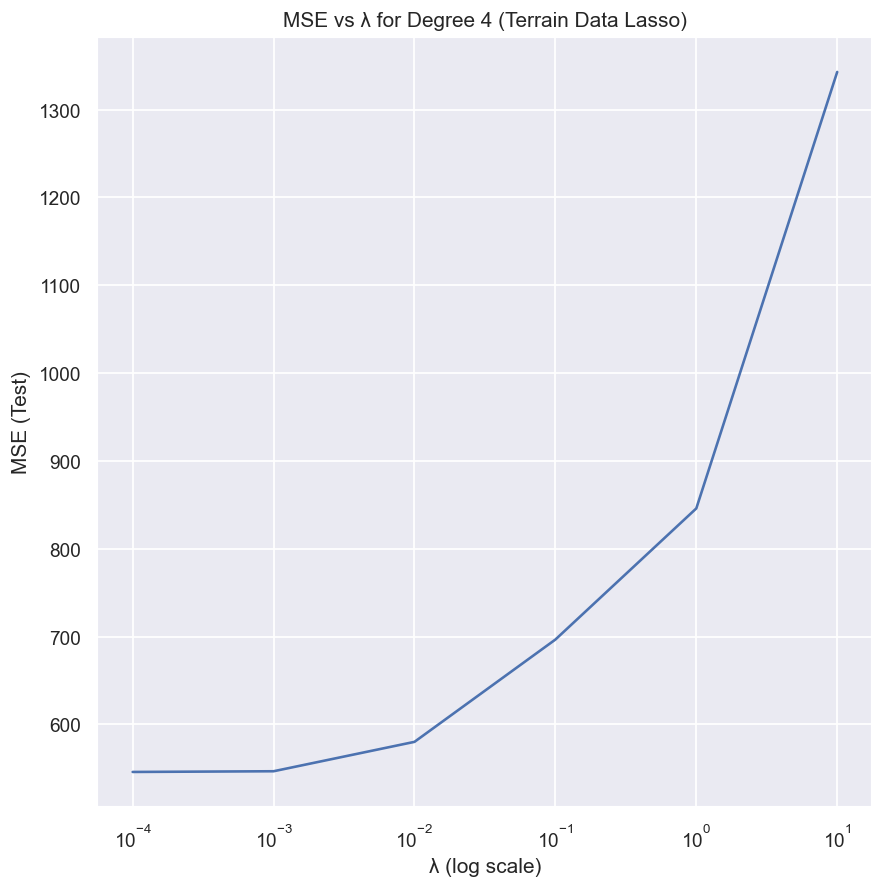

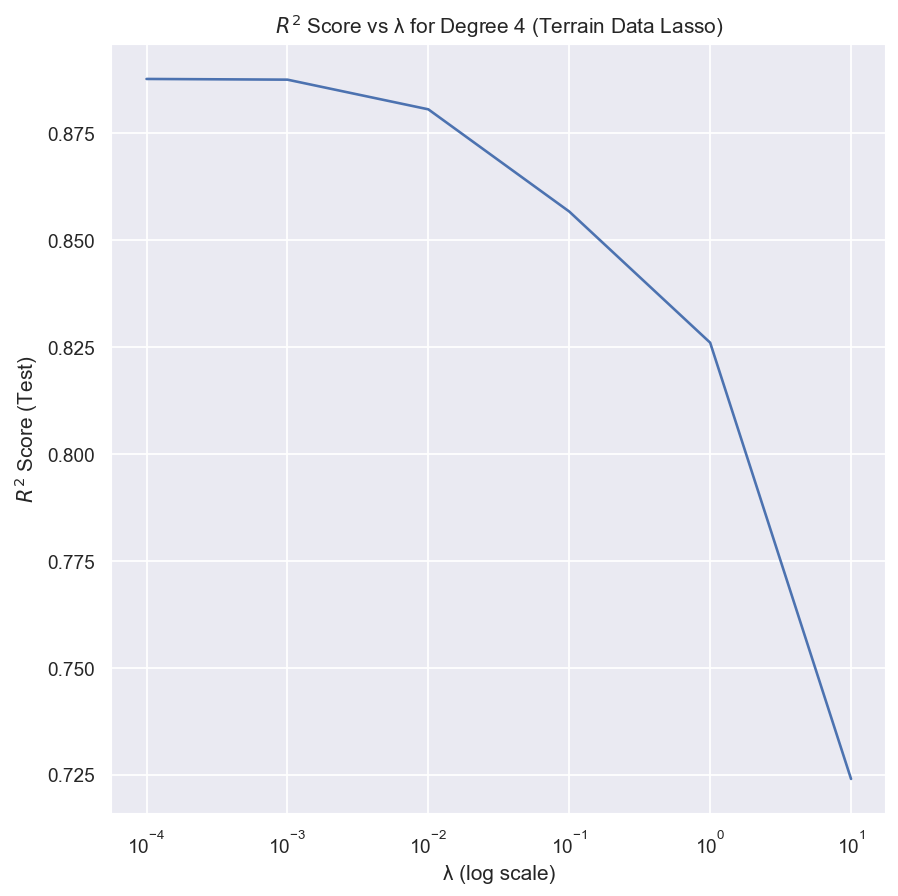

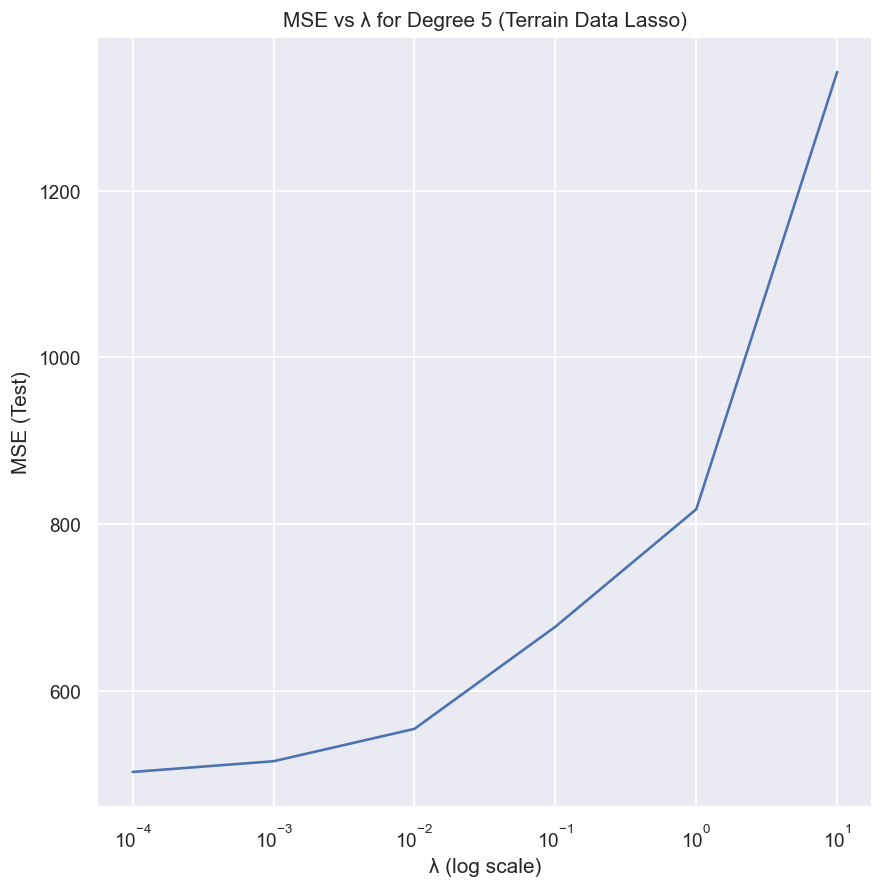

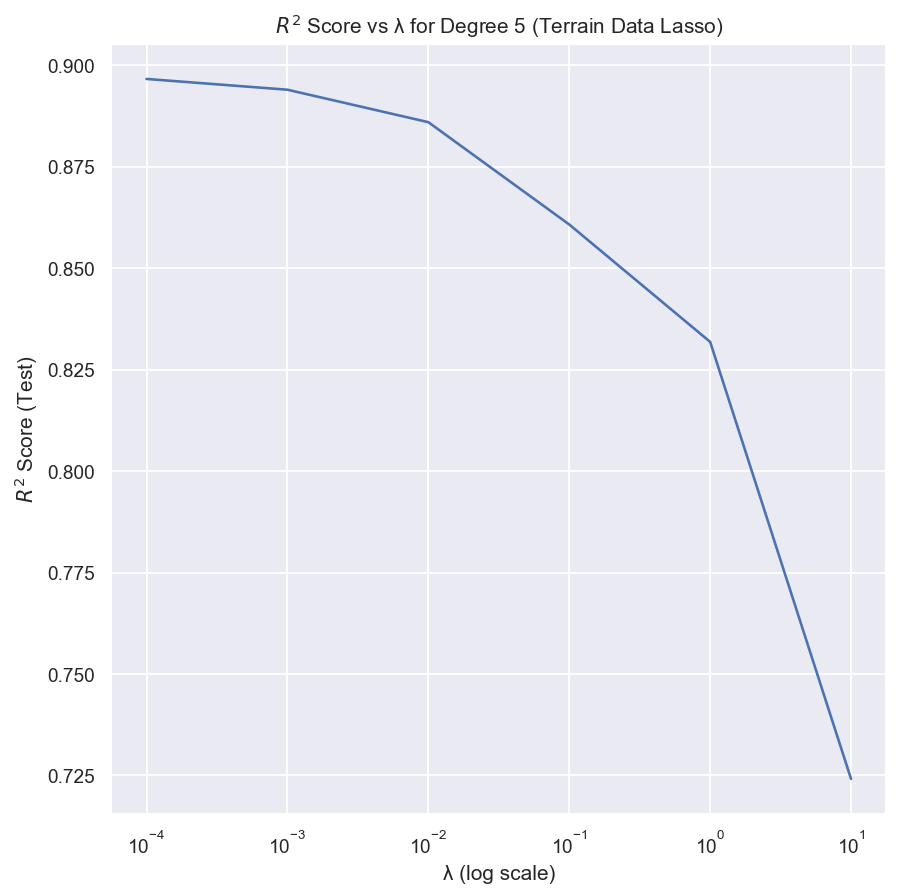

In [682]:
#real with cv - task f)
degrees = range(1, 6)
lambdas = np.logspace(-4, 1, 6)

results_df_real_ols = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="OLS",
    resampling_method="cross-validation",
)

results_df_real_ridge = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Ridge",
    lambdas=lambdas,
    resampling_method="cross-validation",
)

results_df_real_lasso = regression(
    x,
    y,
    z,
    degrees=degrees,
    reg_method="Lasso",
    lambdas=lambdas,
    resampling_method="cross-validation"
)

plot_scores(results_df_real_ols, reg_method="OLS", title_string="(Terrain Data OLS)", fig_name="real_cv_ols")
plot_scores(results_df_real_ridge, reg_method="Ridge", title_string="(Terrain Data Ridge)", fig_name="real_cv_ridge")
plot_scores(results_df_real_lasso, reg_method="Lasso", title_string="(Terrain Data Lasso)",fig_name="real_cv_lasso")

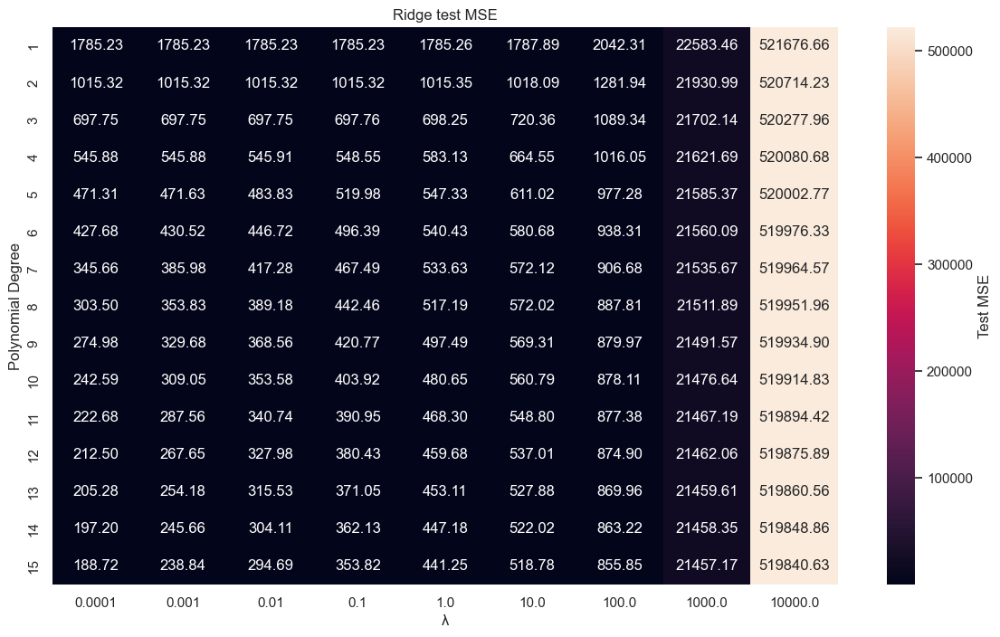

In [684]:
#real cv heatmap for ridge
lambdas = np.logspace(-4, 4, 9)

results_df_ridge = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Ridge",
    lambdas=lambdas,
    resampling_method="cross-validation"
)
mse_test_pivot = results_df_ridge.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Ridge test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")
plt.savefig("results/ridge_real_cv_heatmap.png")
plt.show()


In [692]:
"""#real cv heatmaps for lasso - had to keyboard interrupt here.
lambdas = np.logspace(-5, 1, 7)

results_df_lasso = regression(
    x,
    y,
    z,
    degrees=range(1,16),
    reg_method="Lasso",
    lambdas=lambdas,
    resampling_method="cross-validation"
)

mse_test_pivot = results_df_lasso.pivot(index="degree", columns="lambda", values="MSE_test")

plt.figure(figsize=(14,8))
sns.heatmap(mse_test_pivot, annot=True, fmt=".2f", cbar_kws={"label": "Test MSE"})
plt.title("Lasso test MSE")
plt.xlabel("λ")
plt.ylabel("Polynomial Degree")
plt.savefig("results/lasso_real_cv_heatmap.png")
plt.show()""" 

C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.748e+06, tolerance: 1.350e+06
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+06, tolerance: 1.350e+06
  model = cd_fast.enet_coordinate_descent(
C:\Users\aleks\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.730e+06, toleranc

KeyboardInterrupt: 

In [712]:
#originally planned a plotting function of the predicted terrain, but could not determine best model and implement it in time.